In [9]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib as mlp
import matplotlib.pyplot as plt
import seaborn as sns
import time
import re, pip, conda

In [10]:
for package in [sklearn,mlp,np,pd,sns,pip,conda]:
    print(re.findall("([^']*)",str(package))[2],package.__version__)

sklearn 1.0.2
matplotlib 3.5.3
numpy 1.21.5
pandas 1.3.5
seaborn 0.12.0
pip 23.1.2
conda 4.3.16


## **<center><font color ="k">loan default prediction<br><br>Home Credit loan default prediction  <br><br>Part 3 & Part 4</font></center>**

#### *load library and functions*

In [11]:
import scipy
scipy.__version__

'1.7.3'

In [12]:
import numpy as np
import pandas as pd

import gc
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import KFold, train_test_split, GridSearchCV, cross_val_score
from scipy.misc import derivative 
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer 
from lightgbm import LGBMClassifier
from sklearn.preprocessing import KBinsDiscretizer, StandardScaler

In [13]:
# 绘制核密度估计图的函数
def kde_plot(feature_name,df):
    plt.figure(figsize = (8, 6))

    # 使用违约用户的目标特征feature_name年数数据创建一个KDE图，并命名这条曲线的名字为'target == 0'
    sns.kdeplot(df.loc[df['TARGET'] == 0, feature_name] , label = 'target == 0')

    # 使用违约用户的目标特征feature_name年数数据创建一个KDE图，并命名这条曲线的名字为'target == 1'
    sns.kdeplot(df.loc[df['TARGET'] == 1, feature_name] , label = 'target == 1')

    # 设置横纵坐标
    plt.xlabel(feature_name) 
    plt.ylabel('Density'); plt.title('%s 分布图' %feature_name)
    plt.legend() # 显示曲线所代表的含义
    plt.rcParams['font.sans-serif'] = ['SimHei'] # 显示中文
    plt.rcParams['axes.unicode_minus'] = False # 显示负号
    plt.show()

In [14]:
# 绘制特征重要性的函数
def plot_feature_importances(df):
    # 选择前十个特征
    top_10_features = df.nlargest(10, 'importance')

    # 反转DataFrame或y轴标签的顺序
    top_10_features = top_10_features[::-1]

    # 创建一个水平条形图
    plt.figure(figsize=(10, 6))
    plt.barh(top_10_features['feature'], top_10_features['importance'])

    # 添加轴标签和标题
    plt.xlabel('Importance')
    plt.ylabel('Features')
    plt.title('Top 10 Feature Importance')

    # 设置y轴标签的位置和对齐方式
    plt.yticks(range(len(top_10_features)), top_10_features['feature'])
    plt.tight_layout()

    # 显示图表
    plt.show()

In [2]:
# 优化数据类型的函数
from tqdm import tqdm
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in tqdm(df.columns):
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

# Feature Engineering

## 1 feture enginering for main table

In [16]:
# load data
train_df = pd.read_csv('./application_train.csv') 
test_df = pd.read_csv('./application_test.csv')

In [17]:
#concatenating training and testing dataset for the use of feature engineering
apply = train_df.append(test_df)

In [18]:
del train_df,test_df
gc.collect()

3200

For the NAME_TYPE_SUITE column, the average default rate for missing values was quite unique, likely representing a special group. Therefore, we filled the missing values in this column with 'Unknown'.

Similarly, for the OCCUPATION_TYPE column, the missing values likely correspond to a specific group of users, so we also filled these missing values with 'Unknown'.

For the FLAG_OWN_CAR column, if the value is 'N', it means the customer does not own a car, and thus car age is irrelevant. Therefore, we filled the missing values in the OWN_CAR_AGE column with 0.

For the DAYS_LAST_PHONE_CHANGE column, if the value is 0, it indicates that the customer changed their phone number on the same day as the application. From a business perspective, this does not truly represent the exact number of days since the last phone number change. Hence, we replaced these values with missing values, which we can later impute or directly let LightGBM handle during modeling.

For the CNT_FAM_MEMBERS column, the number of missing values is very small, so we simply removed these records.

The CODE_GENDER column has a similarly low number of missing values, but instead of np.nan, the missing values are represented by 'XNA'.

According to the competition organizers, a value of 365243 in the DAYS_EMPLOYED column should be considered missing. However, during our exploration, we discovered that records with this value have a significantly lower default rate. Therefore, we treated this value as missing but also preserved the information by creating a new feature DAYS_ANOM, where such anomalous days are marked as 1.

In [19]:
apply['NAME_TYPE_SUITE'] = apply['NAME_TYPE_SUITE'].fillna('Unknow')
apply.loc[apply['FLAG_OWN_CAR'] == 'N', 'OWN_CAR_AGE'] = apply.loc[apply['FLAG_OWN_CAR'] == 'N', 'OWN_CAR_AGE'].fillna(0)
apply['OCCUPATION_TYPE'] = apply['OCCUPATION_TYPE'].fillna('Unknow')
apply['DAYS_LAST_PHONE_CHANGE'].replace(0, np.nan, inplace=True) # 0 we replace 0 with nan meaning customer changed phone number the day they apply for loan
apply = apply[apply['CNT_FAM_MEMBERS'].notna()]
apply = apply[apply['CODE_GENDER'] != 'XNA']


apply['DAYS_ANOM'] = ((apply["DAYS_EMPLOYED"] == 365243)*1).values.astype(np.int32)
apply['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)

### 1.1 Domain features

1. Loan Interest
Credit annuity to credit total ratio (AMT_ANNUITY_CREDIT_RATIO):
This metric reflects the interest level of the loan. A higher ratio indicates a higher interest rate, meaning that the amount related to interest repayments each year is greater.

Goods price to credit total ratio (AMT_GOODS_PRICE_CREDIT_RATIO):
This metric evaluates whether the loan amount for goods is reasonable. If the goods price is significantly lower than the loan amount, it could indicate potential loan risk.

2. Repayment Pressure
Credit annuity to total income ratio (AMT_ANNUITY_INCOME_RATIO):
This metric reflects the borrower’s repayment pressure. A higher ratio indicates greater pressure, as a larger portion of income is allocated to loan repayments.

Credit total to total income ratio (AMT_CREDIT_INCOME_RATIO):
This is an important metric for measuring a borrower’s debt repayment capacity (credit-to-income ratio). A higher ratio indicates higher debt levels, with a larger share of income used for loan repayments.

Goods price to total income ratio (AMT_GOODS_PRICE_INCOME_RATIO):
This metric evaluates whether the goods price aligns with the borrower’s ability to pay. A higher ratio may indicate that the purchased goods are too expensive and exceed the borrower’s financial capacity.

3. Household Support Burden
Total income to number of family members ratio (AMT_INCOME_CNT_FEM_RATIO):
This metric assesses the household support burden. A lower ratio indicates higher financial pressure, as the average income per household member decreases.

Total income to number of children ratio (AMT_INCOME_CNT_CHI_RATIO):
This metric also evaluates household support burden, but specifically for children. To avoid division by zero errors, we add 1 to the number of children. A lower ratio suggests greater financial pressure in supporting children.

4. Other Stability Indicators
Total income to years employed ratio (AMT_INCOME_EMPLOYED_RATIO):
This metric assesses the relationship between work experience and income. A higher ratio may indicate a relatively higher salary level.

Total income to age ratio (AMT_INCOME_BIRTH_RATIO):
This metric evaluates the relationship between age and income. A higher ratio may suggest better overall financial status for the applicant.

Days employed to age ratio (DAYS_EMPLOYED_BIRTH_RATIO):
This metric reflects the proportion of the borrower’s working years relative to their age, indirectly indicating job stability. A higher ratio may suggest stronger job stability, which is favorable for timely loan repayment.

Car ownership age to age ratio (OWN_CAR_AGE_BIRTH_RATIO) and car ownership age to employment years ratio (OWN_CAR_AGE_EMPLOYED_RATIO):
These two metrics compare the number of years the borrower has owned a car with their age and employment duration, providing insights into financial and lifestyle stability.

Days since last phone change to age ratio (DAYS_LAST_PHONE_CHANGE_BIRTH_RATIO) and days since last phone change to employment years ratio (DAYS_LAST_PHONE_CHANGE_EMPLOYED_RATIO):
These metrics compare the time since the borrower last changed their phone number with their age and employment duration, offering additional perspectives on their stability. These stability indicators help us better understand the borrower’s living and working conditions, contributing valuable information for risk assessment.

Social circle information:
Includes metrics such as the number of defaults in the borrower’s social circle and whether they have a social network.

In [20]:
# 1.Loan interest
apply['AMT_ANNUITY_CREDIT_RATIO'] = apply['AMT_ANNUITY'] / apply['AMT_CREDIT'] # 信贷年金(每年要偿还的债务金额) / 信贷额(贷款总额)，反应利息相关
apply['AMT_GOODS_PRICE_CREDIT_RATIO'] = apply['AMT_GOODS_PRICE'] / apply['AMT_CREDIT'] # 商品价格信贷比


# 2.stress to pay
apply['AMT_ANNUITY_INCOME_RATIO'] = apply['AMT_ANNUITY'] / apply['AMT_INCOME_TOTAL'] # 贷款年金收入比
apply['AMT_CREDIT_INCOME_RATIO'] = apply['AMT_CREDIT'] / apply['AMT_INCOME_TOTAL'] # 授信收入比
apply['AMT_GOODS_PRICE_INCOME_RATIO'] = apply['AMT_GOODS_PRICE'] / apply['AMT_INCOME_TOTAL'] # 商品价格收入比


# 3.stress to support family
apply['AMT_INCOME_CNT_FEM_RATIO'] = apply['AMT_INCOME_TOTAL'] / apply['CNT_FAM_MEMBERS'] # 收入/家庭人数，家庭供养压力
apply['AMT_INCOME_CNT_CHI_RATIO'] = apply['AMT_INCOME_TOTAL'] / (1 + apply['CNT_CHILDREN']) # 收入/(孩童数+1)，供养压力，防止除0大量空值


# 4.Other: age and years of working exprience
apply['AMT_INCOME_EMPLOYED_RATIO'] = apply['AMT_INCOME_TOTAL']/apply['DAYS_EMPLOYED'] # 收入雇佣年数比
apply['AMT_INCOME_BIRTH_RATIO'] = apply['AMT_INCOME_TOTAL']/apply['DAYS_BIRTH'] 
   
apply['DAYS_EMPLOYED_BIRTH_RATIO'] = apply['DAYS_EMPLOYED'] / apply['DAYS_BIRTH']
apply['OWN_CAR_AGE_BIRTH_RATIO'] = apply['OWN_CAR_AGE'] / apply['DAYS_BIRTH']
apply['DAYS_LAST_PHONE_CHANGE_BIRTH_RATIO'] = apply['DAYS_LAST_PHONE_CHANGE'] / apply['DAYS_BIRTH']
apply['OWN_CAR_AGE_EMPLOYED_RATIO'] = apply['OWN_CAR_AGE'] / apply['DAYS_EMPLOYED']
apply['DAYS_LAST_PHONE_CHANGE_EMPLOYED_RATIO'] = apply['DAYS_LAST_PHONE_CHANGE'] / apply['DAYS_EMPLOYED']
    # Create new feature AMT_DPD_DEF30 to reflect defualt condition for people surrounded
apply['AMT_DPD_DEF30'] = apply.DEF_30_CNT_SOCIAL_CIRCLE + apply.OBS_30_CNT_SOCIAL_CIRCLE
    # Create new feature HAS_SOCIAL_CIRCLE to look at clients' social circle
apply.loc[~apply.OBS_30_CNT_SOCIAL_CIRCLE.isnull(), 'HAS_SOCIAL_CIRCLE'] = 1

In Part 2, during our data exploration of the main table and the development of the baseline model, we identified the importance of three external data features (EXT_SOURCE_X). Their significance was evident from both their correlation with the target variable and their high feature importance rankings in the baseline model.

However, these features are highly anonymized, meaning we cannot directly interpret their specific business meaning. Nevertheless, this does not prevent us from further extracting valuable information from them from a statistical perspective.

Therefore, we calculated the key statistical metrics for these three features, including their sum, mean, standard deviation, median, minimum, maximum, and product. In addition, we considered that these features might have different levels of influence on the target variable, so we applied weighted processing. Specifically, during our data exploration, we found that the EXT_SOURCE_3 field had the highest correlation with the target variable. Hence, when calculating the weighted sum, we assigned it the greatest weight.

In [21]:
# Basic statistical metrics
apply['EXT_SOURCE_sum'] = apply['EXT_SOURCE_1'] + apply['EXT_SOURCE_2'] + apply['EXT_SOURCE_3'] # 求和
apply['EXT_SOURCE_MEAN'] = apply[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1) # 求均值
apply['EXT_SOURCE_STD'] = apply[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1) # 求标准差
apply['EXT_SOURCE_STD'] = apply['EXT_SOURCE_STD'].fillna(apply['EXT_SOURCE_STD'].mean())
apply['EXT_SOURCE_MEDIAN'] = apply[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].apply(np.nanmedian, axis=1) # 求中位数
apply['EXT_SOURCE_MIN'] = apply[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].min(axis=1) # 求最小值
apply['EXT_SOURCE_MAX'] = apply[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].max(axis=1) # 求最大值

# Feature product
apply['EXT_SOURCE_PROD'] = apply['EXT_SOURCE_1'] * apply['EXT_SOURCE_2'] * apply['EXT_SOURCE_3']
# Weighted sum
apply['EXT_SOURCES_WEIGHTED'] = apply['EXT_SOURCE_1'] * 2 + apply['EXT_SOURCE_2'] * 1 + apply['EXT_SOURCE_3'] * 3 # 在数据探索的过程中，我们发现EXT_SOURCE_3字段是最相关的，所以给大一点的比重

However, we must also recognize that feature engineering is an iterative process of trial and error. Neither the statistical features derived from EXT_SOURCE_X nor any subsequent engineered features are guaranteed to improve model performance. Therefore, it is essential to carefully evaluate the impact of these features during the following stages of model training and validation.

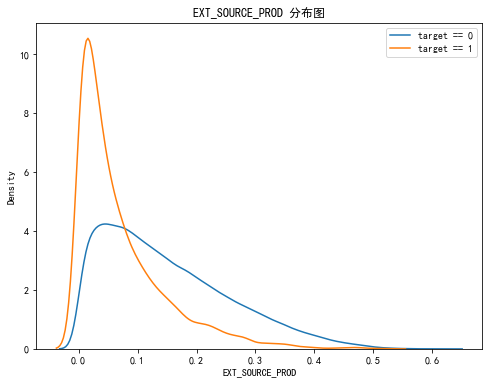

In [ ]:
# In addition, we can use a Kernel Density Estimation (KDE) plot to get a preliminary sense 
# of how the derived feature influences the target variable.
# Note, however, that this method does not take into account interactions between features.
kde_plot('EXT_SOURCE_PROD', apply)

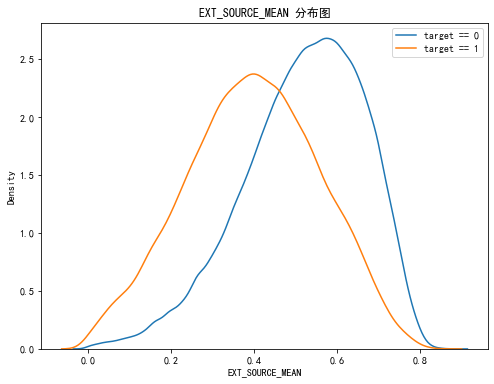

In [ ]:
kde_plot('EXT_SOURCE_MEAN',apply)

Based on the feature engineering ideas and conclusions above, combined with business understanding and competition experience, we can make the following attempts:

Calculate statistical features for FLAG_DOCUMENT_X: This represents the number of documents submitted by the applicant.

Bin age into different ranges: Borrowers at different ages may face varying financial pressures and income situations, which significantly impact their credit evaluation.

Further feature engineering on EXT_SOURCE_X: Build additional derived features based on the previously engineered EXT_SOURCE_X variables.

- gathering 'FLAG_DOC' related feature

In [22]:
# gathering all 'FLAG_DOC' related feature
doc_cols = [col for col in apply.columns if 'FLAG_DOC' in col]
apply['DOCUMENT_COUNT'] = apply[doc_cols].sum(axis=1)

In [23]:
apply['DOCUMENT_COUNT'].value_counts()

1    318051
0     30292
2      7742
3       163
4         1
Name: DOCUMENT_COUNT, dtype: int64

In [24]:
apply.groupby('DOCUMENT_COUNT')['TARGET'].mean()

DOCUMENT_COUNT
0    0.055238
1    0.084491
2    0.046370
3    0.098160
4    1.000000
Name: TARGET, dtype: float64

we can tell the new feature has some distinctions for the labell

- binning the age groups

In [25]:
def get_age_binned(age_years):
    if age_years < 27: return 1 # too young and now having stable income
    elif age_years < 40: return 2
    elif age_years < 50: return 3
    elif age_years < 65: return 4 # just retired and might face financial difficulties
    elif age_years < 99: return 5
    else: return 0

In [26]:
# change age to discrete variables
apply['DAYS_BIRTH_YEAR'] = (-apply['DAYS_BIRTH'] / 365).astype(int)
apply['AGE_BINNED'] =  apply['DAYS_BIRTH_YEAR'].apply(lambda x: get_age_binned(x))

- Further feature derivation based on the external variables EXT_SOURCE_X

In [27]:
# These three new features help us understand the relative relationship between each external score and the average score for the applicant
apply['EXT_SOURCE_MEAN_1_ratio'] = apply['EXT_SOURCE_MEAN'] / (apply['EXT_SOURCE_1'] + 1e-5)
apply['EXT_SOURCE_MEAN_2_ratio'] = apply['EXT_SOURCE_MEAN'] / (apply['EXT_SOURCE_2'] + 1e-5)
apply['EXT_SOURCE_MEAN_3_ratio'] = apply['EXT_SOURCE_MEAN'] / (apply['EXT_SOURCE_3'] + 1e-5)

# Relationship between external score and annuity-to-credit ratio
apply['EXT_SOURCE_AMT_ANNUITY_CREDIT_RATIO_ratio'] = apply['EXT_SOURCE_MEAN'] / (apply['AMT_ANNUITY_CREDIT_RATIO'] + 1e-5)

# Relationship between external score and ID issue date
apply['EXT_SOURCE_DAYS_ID_PUBLISH_ratio'] = apply['EXT_SOURCE_MEAN'] / (apply['DAYS_ID_PUBLISH'] + 1e-5)

# Relationship between age and annuity-to-credit ratio
apply['DAYS_BIRTH_AMT_ANNUITY_CREDIT_RATIO_ratio'] = apply['DAYS_BIRTH'] / (apply['AMT_ANNUITY_CREDIT_RATIO'] + 1e-5)

# Combined relationship between age, annuity-to-credit ratio, and external score
apply['BIRTH*CREDIT_RATIO*EXT_MEAN'] = apply['DAYS_BIRTH'] * apply['AMT_ANNUITY_CREDIT_RATIO'] * apply['EXT_SOURCE_MEAN']

In [28]:
# check results
apply.iloc[-5:,-10:]

,DOCUMENT_COUNT,DAYS_BIRTH_YEAR,AGE_BINNED,EXT_SOURCE_MEAN_1_ratio,EXT_SOURCE_MEAN_2_ratio,EXT_SOURCE_MEAN_3_ratio,EXT_SOURCE_AMT_ANNUITY_CREDIT_RATIO_ratio,EXT_SOURCE_DAYS_ID_PUBLISH_ratio,DAYS_BIRTH_AMT_ANNUITY_CREDIT_RATIO_ratio,BIRTH*CREDIT_RATIO*EXT_MEAN
48739,1,54,4,NaN,0.995707,1.004299,15.244139,-0.000190,-471392.590078,-546.221827
48740,1,30,2,NaN,0.999985,NaN,13.350824,-0.000228,-218146.760188,-392.599984
48741,1,43,3,0.749809,0.869173,1.938500,5.216967,-0.000366,-151027.819559,-923.115012
48742,1,38,2,1.263510,1.057671,0.791675,8.440748,-0.000346,-250098.478066,-367.691618
48743,1,38,2,NaN,0.798021,1.338768,4.611125,-0.000086,-176705.887878,-401.876643


将上述过程封装成一个函数

In [331]:
def Leaking_proof_TargetEncode(df, column_name, target_column, n_bins, freq_threshold):
    '''
    This function performs leaking-proof target encoding to avoid data leakage.

    Parameters:
    df: Pandas DataFrame — the dataset to perform target encoding on.
    column_name: str — the name of the categorical column to encode.
    target_column: str — the name of the target variable used for encoding.
    n_bins: int — the number of bins to divide the data into (used for KBinsDiscretizer).
    freq_threshold: int — the frequency threshold; categories with a frequency below this value 
                          will not be binned and will be assigned -1.

    Returns:
    A DataFrame with the target-encoded column added.
    '''

    # Compute the frequency of values in 'column_name' and select those with frequency greater than freq_threshold
    value_counts = df[column_name].value_counts()
    selected_values = value_counts[value_counts > freq_threshold].index

    # Compute the mean of 'target_column' for the selected values
    target_mean = df[df[column_name].isin(selected_values)].groupby(column_name)[target_column].mean()

    # Standardize the group means — first fill NaNs with the mean, then standardize
    scaler = StandardScaler()
    target_mean_filled = target_mean.fillna(target_mean.mean())  # Fill NaNs with the mean
    target_mean_scaled = scaler.fit_transform(target_mean_filled.values.reshape(-1, 1))

    # Use KBinsDiscretizer to bin the standardized group means; fill NaNs with 0
    discretizer = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='kmeans')
    bins = discretizer.fit_transform(pd.DataFrame(target_mean_scaled).fillna(0).values.reshape(-1, 1))

    # Map the binning results to the corresponding 'column_name' values
    map_ = dict(zip(target_mean.index, bins.flatten()))

    # Create a new column '{column_name}_manual' — replace 'column_name' values with their bin numbers; 
    # if a value is not in the mapping, assign -1
    df[f'{column_name}_manual'] = df[column_name].map(map_).fillna(-1)

    return df


In [332]:
# Leaking_proof_TargetEncode
apply = Leaking_proof_TargetEncode(apply, 'NAME_FAMILY_STATUS', 'TARGET', 3, 0)
# View the derived column
apply['NAME_FAMILY_STATUS_manual'].value_counts()

1.0    251437
2.0     86515
0.0     18297
Name: NAME_FAMILY_STATUS_manual, dtype: int64

Here’s a complete example showing how to apply the Leaking_proof_TargetEncode function to the CNT_CHILDREN field:

1. Examine the distribution of values in the CNT_CHILDREN column to determine an appropriate threshold (freq_threshold) for use in the Leaking_proof_TargetEncode function.

In [52]:
# As we can see, many of the values correspond to only a small number of applicants
apply['CNT_CHILDREN'].value_counts()

0     250052
1      70622
2      30697
3       4252
4        478
5         96
6         24
7          8
8          5
11         3
14         3
9          2
12         2
10         2
19         2
20         1
Name: CNT_CHILDREN, dtype: int64

In [56]:
# So we filter out the values that have at least 20 or more applicants
value_counts = apply['CNT_CHILDREN'].value_counts()
value_counts[value_counts > 20]

0    250052
1     70622
2     30697
3      4252
4       478
5        96
6        24
Name: CNT_CHILDREN, dtype: int64

2. Check the mean of the target variable for each value of this field to decide how many bins to divide into.

In [57]:
value_counts = apply['CNT_CHILDREN'].value_counts()
selected_values = value_counts[value_counts > 20].index
apply[apply['CNT_CHILDREN'].isin(selected_values)].groupby('CNT_CHILDREN')['TARGET'].mean()

CNT_CHILDREN
0    0.077120
1    0.089237
2    0.087221
3    0.096314
4    0.128205
5    0.083333
6    0.285714
Name: TARGET, dtype: float64

# 3. Call the Leaking_proof_TargetEncode function and inspect the result

In [335]:
# Call the Leaking_proof_TargetEncode function with k_bins set to 4 and frequency threshold set to 20
apply = Leaking_proof_TargetEncode(apply, 'CNT_CHILDREN', 'TARGET', 4, 20)

# Count the number of occurrences for each encoded value
apply['CNT_CHILDREN_manual'].value_counts()

 0.0    250148
 1.0    105571
 2.0       478
-1.0        28
 3.0        24
Name: CNT_CHILDREN_manual, dtype: int64

We applied the above process repeatedly to 14 other features, including NAME_INCOME_TYPE, NAME_HOUSING_TYPE, AMT_INCOME_TOTAL, REGION_POPULATION_RELATIVE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, and others. Below, we only present the final results of the execution.

In [336]:
apply = Leaking_proof_TargetEncode(apply, 'NAME_INCOME_TYPE', 'TARGET', 4,0)
apply = Leaking_proof_TargetEncode(apply, 'NAME_HOUSING_TYPE', 'TARGET', 4,0)
apply = Leaking_proof_TargetEncode(apply, 'AMT_INCOME_TOTAL', 'TARGET', 7, 5000)
apply = Leaking_proof_TargetEncode(apply, 'REGION_POPULATION_RELATIVE', 'TARGET', 7, 1000)
apply = Leaking_proof_TargetEncode(apply, 'OWN_CAR_AGE', 'TARGET', 6, 15)
apply = Leaking_proof_TargetEncode(apply, 'OCCUPATION_TYPE', 'TARGET', 5, 0)
apply = Leaking_proof_TargetEncode(apply, 'CNT_FAM_MEMBERS', 'TARGET', 4, 0)
apply = Leaking_proof_TargetEncode(apply, 'HOUR_APPR_PROCESS_START', 'TARGET', 4, 0)
apply = Leaking_proof_TargetEncode(apply, 'ORGANIZATION_TYPE', 'TARGET', 6, 0)
apply = Leaking_proof_TargetEncode(apply, 'YEARS_BEGINEXPLUATATION_AVG', 'TARGET', 6, 1000)
apply = Leaking_proof_TargetEncode(apply, 'YEARS_BUILD_AVG', 'TARGET', 6, 1000)
apply = Leaking_proof_TargetEncode(apply, 'FLOORSMAX_MODE', 'TARGET', 5, 0)
apply = Leaking_proof_TargetEncode(apply, 'WALLSMATERIAL_MODE', 'TARGET', 3, 0)
apply = Leaking_proof_TargetEncode(apply, 'AMT_REQ_CREDIT_BUREAU_HOUR', 'TARGET', 3, 0)

**思考**：通过Leaking_proof式目标编码特征的构建过程，你有哪些收获？哪些方法可以在其他比赛中复用？

1. 针对分类任务，Leaking_proof_TargetEncode 是一个强有力的工具，它可直接应用于类别型字段或者对连续变量进行分箱后的目标编码。

2. 在本案例中，我们可以根据这种Leaking_proof式目标编码构造出更丰富的操作，<font color='red'>例如</font>可以在自己的数据集上尝试对其他类别型特征进行衍生、对连续型变量分箱之后再进行衍生等。这种编码的<font color='red'>本质</font>是将标签在类别变量上的分布作为特征融入训练集。<font color='red'>例如</font>，对于 NAME_EDUCATION_TYPE 字段，我们实际上参考了整体的平均违约率以及每种取值的违约率，然后根据业务理解将此字段分为四类。然而，我们还可以基于多个类别特征来识别某一特定群体（比如，男性且拥有汽车的群体）的违约率是否与整体违约率存在显著差异。

3. 可以尝试调整 category_encoders 库中 TargetEncoder 的正则化参数，对<font color='red'>与标签相关性较强的连续型变量进行目标编码</font>。例如，te.fit_transform(apply[object_col], apply['EXT_SOURCE_MEAN'])。

4. 实际上，我们团队就是基于这些思路，对不同的特征进行了各式各样的 Leaking_proof 式目标编码。尽管我们采用的都是同一套未经调参的 lightgbm 参数，但由于特征的多样性，最后融合的模型显示出了优秀的泛化能力。

### 1.3 Validating the Effectiveness of the Above Feature Engineering

Feature engineering is an iterative process of trial and error. Therefore, after performing feature engineering, we need to continuously validate whether our methods actually improve the model’s performance.

In [337]:
# To avoid affecting further feature engineering based on the original data, we create a copy called apply_test
apply_test = apply.copy()

In [ ]:
# Encoder
object_col = apply_test.dtypes[apply_test.dtypes == 'object'].index.to_list()

for col in object_col:
    # If the categorical variable has more than 2 unique values, apply one-hot encoding
    if len(apply_test[col].unique()) > 2:
        apply_test = pd.concat([apply_test, pd.get_dummies(apply_test[col], prefix=col)], axis=1)
        apply_test.drop(columns=[col], inplace=True)
    # Otherwise, use adaptive encoding with factorize (similar to LabelEncoder)
    else:
        apply_test[col] = pd.factorize(apply_test[col])[0]

apply_test.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,...,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,100002,1.0,0,0,0,0,...,0,0,1,0,1,0
1,100003,0.0,0,1,0,1,...,0,0,0,0,1,0
2,100004,0.0,1,0,1,0,...,0,0,0,0,0,0
3,100006,0.0,0,1,0,0,...,0,0,0,0,0,0
4,100007,0.0,0,0,0,0,...,0,0,0,0,0,0


In [339]:
# train test split
test = apply_test[apply_test['TARGET'].isnull()]
test = test.drop('TARGET', axis = 1)
train = apply_test[~apply_test['TARGET'].isnull()]

In [340]:
# recycle memory
del apply_test
gc.collect()

42

In [341]:
# get rid of JSON characters in the feature names
train.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in train.columns]
test.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in test.columns]

In [342]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier
import pandas as pd

# Use the sigmoid function to convert model outputs to probabilities of default,
# so the result aligns with the standard used on platforms like Kaggle.
def sigmoid(x):
    """
    Sigmoid function to convert raw scores into probabilities
    """
    return 1. / (1. + np.exp(-x))

def fit(train=train, valid=test):
    """
    Function to train the model

    Input parameters:
    - train: training dataset (default: application_train)
    - valid: validation dataset (default: application_test)

    Output:
    - valid_auc: AUC score on the validation set
    - feature_importances: DataFrame of feature importances
    - test_results: DataFrame of test predictions
    """
    test = valid.copy()

    X_train = train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
    y_train = train['TARGET']

    # 5-fold cross-validation
    folds = KFold(n_splits=5, shuffle=True, random_state=1412)

    oof_preds = np.zeros(y_train.shape[0])
    test_preds = np.zeros(test.shape[0])

    # Get feature names
    feature_names = list(X_train.columns)

    # Empty array to store feature importances
    feature_importance_values = np.zeros(len(feature_names))

    # Instantiate the LightGBM model
    lgb = LGBMClassifier(
        n_estimators=10000,            # Set a high number of estimators to allow early stopping
        early_stopping_round=200,      # Stop early to save training time
        random_state=2024
        # device_type="gpu"  # Uncomment if using GPU
    )

    # Cross-validation: we use KFold to split the dataset into 5 subsets.
    # In each round, one subset is used as the validation set, and the others as the training set.
    # This allows more comprehensive evaluation and avoids overfitting to any particular split.
    for fold_idx, (train_idx, valid_idx) in enumerate(folds.split(X_train)):
        # For each fold, we extract the training and validation indices
        # and use them to get the corresponding data from X_train and y_train
        X = X_train.iloc[train_idx, :]
        y = y_train.iloc[train_idx]
        valid_X = X_train.iloc[valid_idx, :]
        valid_y = y_train.iloc[valid_idx]

        # Train the model and evaluate on the training and validation sets
        lgb.fit(X, y, eval_set=[(X, y), (valid_X, valid_y)])

        # After each round of training, accumulate the feature importances
        # This allows us to get average importances over all folds
        feature_importance_values += lgb.feature_importances_ / folds.n_splits

        # Predict on validation set and store in the appropriate position
        oof_preds[valid_idx] = sigmoid(
            lgb.predict_proba(valid_X, num_iteration=lgb.best_iteration_)[:, 1]
        )

        # Predict on test set and accumulate predictions (to be averaged later)
        test_preds += sigmoid(
            lgb.predict_proba(test[feature_names], num_iteration=lgb.best_iteration_)[:, 1]
        ) / folds.n_splits

    # After all folds, calculate AUC using out-of-fold predictions
    valid_auc = roc_auc_score(y_train, oof_preds)

    # Save feature importances to DataFrame
    feature_importances = pd.DataFrame({
        'feature': feature_names,
        'importance': feature_importance_values
    })

    # Store final test predictions
    test['TARGET'] = test_preds

    return valid_auc, feature_importances, test[['SK_ID_CURR', 'TARGET']]

In [343]:
valid_auc,feature_importance,submission = fit(train,test)

[1]	training's binary_logloss: 0.275119	valid_1's binary_logloss: 0.270973
[2]	training's binary_logloss: 0.270616	valid_1's binary_logloss: 0.266837
[3]	training's binary_logloss: 0.267081	valid_1's binary_logloss: 0.263657
[4]	training's binary_logloss: 0.264269	valid_1's binary_logloss: 0.261209
[5]	training's binary_logloss: 0.261915	valid_1's binary_logloss: 0.259115
[6]	training's binary_logloss: 0.259917	valid_1's binary_logloss: 0.25735
[7]	training's binary_logloss: 0.258254	valid_1's binary_logloss: 0.255923
[8]	training's binary_logloss: 0.256843	valid_1's binary_logloss: 0.254646
[9]	training's binary_logloss: 0.255588	valid_1's binary_logloss: 0.253569
[10]	training's binary_logloss: 0.254475	valid_1's binary_logloss: 0.25262
[11]	training's binary_logloss: 0.253482	valid_1's binary_logloss: 0.251807
[12]	training's binary_logloss: 0.25259	valid_1's binary_logloss: 0.251088
[13]	training's binary_logloss: 0.251751	valid_1's binary_logloss: 0.250389
[14]	training's binary_l

In [344]:
# local validation score 0.7649
valid_auc

0.7649974774603775

In [345]:
# Printing feature significance
feature_importance.sort_values(by='importance',ascending=False)

,feature,importance
109,AMT_ANNUITY_CREDIT_RATIO,290.4
33,EXT_SOURCE_3,136.6
110,AMT_GOODS_PRICE_CREDIT_RATIO,123.6
10,DAYS_BIRTH,120.2
7,AMT_ANNUITY,95.2
...,...,...
171,NAME_INCOME_TYPE_Pensioner,0.0
18,FLAG_CONT_MOBILE,0.0
255,ORGANIZATION_TYPE_Religion,0.0
170,NAME_INCOME_TYPE_Maternity_leave,0.0


we can see feature AMT_ANNUITY_CREDIT_RATIO、AMT_GOODS_PRICE_CREDIT_RATIO have very high significane，this proof our feature engineering is effective.

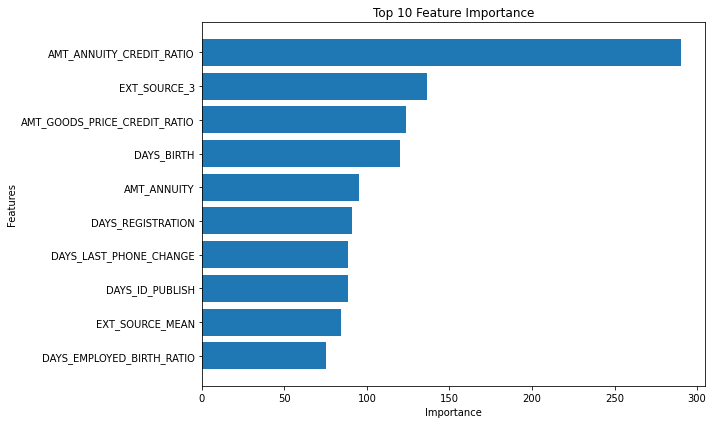

In [346]:
plot_feature_importances(feature_importance.sort_values(by='importance',ascending=False))

In [348]:
# baseline score：0.74373
# main table feature engineering score：0.75923
submission.to_csv('manualfeature_model_lightgbm.csv',index=False)

We can see that the private leaderboard score has also improved significantly. Previously, we did not merge the auxiliary tables into the main table when building the baseline in order to better compare the impact of feature engineering.

## 2 Auxiliary Table Operations and Manual Feature Engineering

After completing feature engineering on the main table, we will now proceed to extract features from the other six auxiliary tables. While building the baseline model, we observed some issues with the auxiliary tables, which are briefly reviewed below:

A borrower may have multiple past loan records. If we directly join the tables using the borrower's ID, it could lead to an exponential increase in data volume.

The raw data in the auxiliary tables may not inherently contain predictive information. However, if we apply certain aggregations or transformations—for example, calculating how many times a borrower has taken out loans—we may uncover signals about their financial needs, thereby creating more valuable predictive features.

To address these challenges, we will adopt the GAME strategy to fully explore users’ past credit behavior patterns and risk preferences. I will walk you through the application of the GAME strategy in detail using bureau.csv and bureau_balance.csv as examples. Then, we will extend this approach to the other four auxiliary tables, including previous_application.csv.

### 2.1 bureau.csv & bureau_balance.csv

First, let's get familiar with the two tables: bureau.csv and bureau_balance.csv.

The bureau.csv file is a dataset that records details of each individual loan application. Each row represents a single loan, containing information such as the loan amount, loan type, and loan status. One important point to note is that a single customer can have multiple loan records, so the customer ID appears multiple times in this table.

The bureau_balance.csv file provides monthly loan balance information, including historical repayment records and outstanding amounts.

These two tables describe a customer's credit history, borrowing behavior, financial status, and repayment habits. By analyzing the features within them, we can more accurately assess a customer's credit risk and make better lending decisions.

However, since one customer can have multiple loan records, we need to group the data by customer ID and perform aggregations (such as sum or average) on certain features. This will give us an overall view of each customer's borrowing behavior and credit profile.

Next, we will look at the first five rows of each table to help you better understand the meaning of these features and how they relate to one another.

In [58]:
bureau_df = pd.read_csv('./bureau.csv')
bureau_balance_df = pd.read_csv('./bureau_balance.csv')
reduce_mem_usage(bureau_balance_df)
reduce_mem_usage(bureau_df).head()

100%|██████████| 3/3 [00:00<00:00,  3.68it/s]


Mem. usage decreased to 338.46 Mb (45.8% reduction)


100%|██████████| 17/17 [00:01<00:00, 15.19it/s]

Mem. usage decreased to 112.95 Mb (49.3% reduction)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [69]:
# Focus on the CREDIT_ACTIVE field. It has four types of values.
# Among them, 'Sold' means that the debt has been sold to another institution.
bureau_df['CREDIT_ACTIVE'].value_counts()

Closed      1079273
Active       630607
Sold           6527
Bad debt         21
Name: CREDIT_ACTIVE, dtype: int64

In [70]:
# We can see that the loan types in this table differ significantly from those in the main table
bureau_df['CREDIT_TYPE'].value_counts()

Consumer credit                                 1251615
Credit card                                      402195
Car loan                                          27690
Mortgage                                          18391
Microloan                                         12413
Loan for business development                      1975
Another type of loan                               1017
Unknown type of loan                                555
Loan for working capital replenishment              469
Cash loan (non-earmarked)                            56
Real estate loan                                     27
Loan for the purchase of equipment                   19
Loan for purchase of shares (margin lending)          4
Mobile operator loan                                  1
Interbank credit                                      1
Name: CREDIT_TYPE, dtype: int64

In [71]:
bureau_balance_df.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [72]:
# Numbers 0–5 indicate the number of days a loan is overdue.
# The letter 'C' means the loan has been fully paid off,
# while 'X' indicates there is no loan record for that month.
bureau_balance_df['STATUS'].value_counts()

C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64

In [73]:
# The dataset contains millions of loan records
bureau_df.shape

(1716428, 17)

In [74]:
# The repayment dataset consists of over ten million records
bureau_balance_df.shape

(27299925, 3)

The core feature information from these two tables includes:
> - **Identifiers**：such as SK_ID_CURR and SK_ID_BUREAU. These are unique identifiers used to link different records across datasets<br><br>
> - **Credit Status and Type**：such as CREDIT_ACTIVE and CREDIT_TYPE. These features describe the status of the loan (e.g., active, closed, or sold) and its type (e.g., consumer loan or credit card). Understanding the loan's status and type is important for assessing a customer's credit risk, as different loan types may carry different default risks <br><br>
> - **Time Features**：such as DAYS_CREDIT, DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, and DAYS_CREDIT_UPDATE. These features provide information about the loan lifecycle, including application date, scheduled end date, actual end date, and last update date. These help evaluate the length of a customer’s credit history and the stability of their borrowing behavior.<br><br>
> - **Loan Amount and Overdue Information**：such as AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_CREDIT_SUM_OVERDUE, and AMT_ANNUITY. These features provide financial information about the loan, including overdue amounts, total loan amounts, outstanding debt, credit limits, and annuity payments. These are crucial for assessing the customer’s repayment ability and potential default risk。<br><br>
> - **Repayment Behavior**：such as CREDIT_DAY_OVERDUE, CNT_CREDIT_PROLONG, and STATUS. These features reflect a customer's repayment habits, including days overdue, number of times payment was extended, and payment status. This information is useful for evaluating repayment behavior and predicting future default risk

For a detailed explanation of each field, please refer to the Appendix at the end of this section.

#### 2.1.1 Data Preprocessing and Business Features

- Preprocessing

The data in the auxiliary tables also needs to be explored and preprocessed, similar to the main table. Due to space limitations, I have only listed the features that require processing and omitted the exploration steps.

In [75]:
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.float_format', '{:.1f}'.format)  # Display only one decimal place for floats
pd.set_option('display.width', 50)  # Set the display width to ensure numbers are fully shown
bureau_df.describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1716428.0,1716428.0,1716428.0,1716428.0,1610875.0,1082775.0,591940.0,1716428.0,1716415.0,1458759.0,1124648.0,1716428.0,1716428.0,489637.0
mean,278214.9,5924434.5,-1142.1,0.8,NaN,NaN,3825.4,0.0,354994.6,137085.1,6229.5,37.9,-593.7,15712.8
std,102938.6,532265.7,795.2,36.5,NaN,NaN,206031.6,0.1,1149811.4,677401.1,45032.0,5937.6,720.7,325826.9
min,100001.0,5000000.0,-2922.0,0.0,-42048.0,-42016.0,0.0,0.0,0.0,-4705600.5,-586406.1,0.0,-41947.0,0.0
25%,188866.8,5463953.8,-1666.0,0.0,-1138.0,-1489.0,0.0,0.0,51300.0,0.0,0.0,0.0,-908.0,0.0
50%,278055.0,5926303.5,-987.0,0.0,-330.0,-897.0,0.0,0.0,125518.5,0.0,0.0,0.0,-395.0,0.0
75%,367426.0,6385681.2,-474.0,0.0,474.0,-425.0,0.0,0.0,315000.0,40153.5,0.0,0.0,-33.0,13500.0
max,456255.0,6843457.0,0.0,2792.0,31200.0,0.0,115987184.0,9.0,585000000.0,170100000.0,4705600.5,3756681.0,372.0,118453424.0


By observing the columns above, we found that the values in 'DAYS_CREDIT_ENDDATE', 'DAYS_CREDIT_UPDATE', and 'DAYS_ENDDATE_FACT' appear to be abnormal.

In [ ]:
# Similar to the main table, some date-related fields contain abnormal values
bureau_df.describe()[['DAYS_CREDIT_ENDDATE','DAYS_CREDIT_UPDATE','DAYS_ENDDATE_FACT']]

,DAYS_CREDIT_ENDDATE,DAYS_CREDIT_UPDATE,DAYS_ENDDATE_FACT
count,1610875.0,1716428.0,1082775.0
mean,NaN,-593.7,NaN
std,NaN,720.7,NaN
min,-42048.0,-41947.0,-42016.0
25%,-1138.0,-908.0,-1489.0
50%,-330.0,-395.0,-897.0
75%,474.0,-33.0,-425.0
max,31200.0,372.0,0.0


In [77]:
# Moreover, the number of abnormal values is not very large, and they are all greater than 40,000 days
bureau_df['DAYS_CREDIT_ENDDATE'].value_counts().sort_index().head(10)

-42048.0     6
-42016.0     1
-41952.0     1
-41920.0     3
-41888.0    11
-41856.0    62
-41824.0    50
-16320.0     1
-16304.0     4
-16296.0     7
Name: DAYS_CREDIT_ENDDATE, dtype: int64

We can see that some of the abnormal values are as high as 40,000 days (nearly 110 years). We will set these abnormally large day values to null (NaN).

In [78]:
#We will set these abnormally large day values to null (NaN).
bureau_df['DAYS_CREDIT_ENDDATE'][bureau_df['DAYS_CREDIT_ENDDATE'] < -40000] = np.nan
bureau_df['DAYS_CREDIT_UPDATE'][bureau_df['DAYS_CREDIT_UPDATE'] < -40000] = np.nan
bureau_df['DAYS_ENDDATE_FACT'][bureau_df['DAYS_ENDDATE_FACT'] < -40000] = np.nan

- Domain feature

Similar to the main table, the first step is to perform some business-driven feature engineering in bureau.csv, including:

**1. Creating domain-specific features:** Based on credit business understanding, we will create new features such as AMT_CREDIT_DEBT_RATIO, AMT_CREDIT_DEBT_DIFF, and AMT_CREDIT_ANNUITY_RATIO. These are derived through combinations or transformations of existing loan amount, debt, and annuity features.

**2. Creating overdue features:** This includes two new features, IS_CREDIT_DAY_OVERDUE and IS_CREDIT_AMT_OVERDUE, which indicate whether the customer has any overdue payments.

**3. Processing date-related features:** We will calculate differences between various date fields to reflect the loan term and the gap between actual and scheduled repayment dates.

**4. Transforming categorical features:** We will manually encode the CREDIT_ACTIVE feature, assigning greater weight to active credit accounts.

**5. Creating interaction features:** This includes the ratio of overdue amount to overdue days, and the squared term of overdue days — which may help capture nonlinear relationships between features.

In [79]:
# 1. Create domain-specific features

# Ratio of total debt to total credit — reflects the degree of debt burden.
# A higher ratio indicates heavier liabilities for the customer.
bureau_df['AMT_CREDIT_DEBT_RATIO'] = bureau_df['AMT_CREDIT_SUM_DEBT'] / (bureau_df['AMT_CREDIT_SUM'] + 1e-5)

# Remaining credit = total credit minus total debt — shows the remaining credit limit.
bureau_df['AMT_CREDIT_DEBT_DIFF'] = bureau_df['AMT_CREDIT_SUM'] - bureau_df['AMT_CREDIT_SUM_DEBT']

# Ratio of annuity to total credit — reflects annual repayment burden relative to total credit.
bureau_df['AMT_CREDIT_ANNUITY_RATIO'] = bureau_df['AMT_ANNUITY'] / (bureau_df['AMT_CREDIT_SUM'] + 1e-5)


# 2. Create overdue features

# Whether there are overdue days
bureau_df['IS_CREDIT_DAY_OVERDUE'] = bureau_df['CREDIT_DAY_OVERDUE'].apply(lambda x: 1 if x > 0 else 0)

# Whether there is an overdue amount
bureau_df['IS_CREDIT_AMT_OVERDUE'] = bureau_df['AMT_CREDIT_SUM_OVERDUE'].apply(lambda x: 1 if x > 0 else 0)


# 3. Process date-related features — to capture loan term length and gaps between actual vs. expected repayments

# Difference between scheduled loan end date and loan start date
bureau_df['DAYS_CREDIT_ENDDATE_CREDIT_DIFF'] = bureau_df['DAYS_CREDIT_ENDDATE'] - bureau_df['DAYS_CREDIT']

# Difference between scheduled and actual loan end dates
bureau_df['DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF'] = bureau_df['DAYS_CREDIT_ENDDATE'] - bureau_df['DAYS_ENDDATE_FACT']

# Difference between loan start date and actual end date
bureau_df['DAYS_CREDIT_ENDDATE_FACT_DIFF'] = bureau_df['DAYS_CREDIT'] - bureau_df['DAYS_ENDDATE_FACT']


# 4. Transform categorical feature

# Manually encode 'CREDIT_ACTIVE': assign 5 to 'Active' credit, and 1 to all other statuses
# This gives higher weight to active credit accounts.
bureau_df['CREDIT_ACTIVE_manual'] = bureau_df['CREDIT_ACTIVE'].apply(lambda x : 5 if x == 'Active' else 1)


# 5. Create interaction features

# Ratio of overdue amount to overdue days — indicates how much is overdue per day
bureau_df['OVERDUE_CREDIT_SUMDAY_RATIO'] = bureau_df['AMT_CREDIT_SUM_OVERDUE'] / (bureau_df['CREDIT_DAY_OVERDUE'] + 1e-5)

# Polynomial (squared) term of overdue days — may help capture nonlinear relationships
bureau_df['CREDIT_DAY_OVERDUE_poly'] = bureau_df['CREDIT_DAY_OVERDUE'] * bureau_df['CREDIT_DAY_OVERDUE']

#### 2.1.2 Aggregation Linking Strategy (GAME)

Let's briefly review the issues we encountered when building the baseline model:

In [80]:
apply.head().merge(bureau_df,on='SK_ID_CURR',how='left').head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY_x,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_ANOM,AMT_ANNUITY_CREDIT_RATIO,AMT_GOODS_PRICE_CREDIT_RATIO,AMT_ANNUITY_INCOME_RATIO,AMT_CREDIT_INCOME_RATIO,AMT_GOODS_PRICE_INCOME_RATIO,AMT_INCOME_CNT_FEM_RATIO,AMT_INCOME_CNT_CHI_RATIO,AMT_INCOME_EMPLOYED_RATIO,AMT_INCOME_BIRTH_RATIO,DAYS_EMPLOYED_BIRTH_RATIO,OWN_CAR_AGE_BIRTH_RATIO,DAYS_LAST_PHONE_CHANGE_BIRTH_RATIO,OWN_CAR_AGE_EMPLOYED_RATIO,DAYS_LAST_PHONE_CHANGE_EMPLOYED_RATIO,AMT_DPD_DEF30,HAS_SOCIAL_CIRCLE,EXT_SOURCE_sum,EXT_SOURCE_MEAN,EXT_SOURCE_STD,EXT_SOURCE_MEDIAN,EXT_SOURCE_MIN,EXT_SOURCE_MAX,EXT_SOURCE_PROD,EXT_SOURCES_WEIGHTED,DOCUMENT_COUNT,DAYS_BIRTH_YEAR,AGE_BINNED,EXT_SOURCE_MEAN_1_ratio,EXT_SOURCE_MEAN_2_ratio,EXT_SOURCE_MEAN_3_ratio,EXT_SOURCE_AMT_ANNUITY_CREDIT_RATIO_ratio,EXT_SOURCE_DAYS_ID_PUBLISH_ratio,DAYS_BIRTH_AMT_ANNUITY_CREDIT_RATIO_ratio,BIRTH*CREDIT_RATIO*EXT_MEAN,NAME_EDUCATION_TYPE_manual,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY_y,AMT_CREDIT_DEBT_RATIO,AMT_CREDIT_DEBT_DIFF,AMT_CREDIT_ANNUITY_RATIO,IS_CREDIT_DAY_OVERDUE,IS_CREDIT_AMT_OVERDUE,DAYS_CREDIT_ENDDATE_CREDIT_DIFF,DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF,DAYS_CREDIT_ENDDATE_FACT_DIFF,CREDIT_ACTIVE_manual,OVERDUE_CREDIT_SUMDAY_RATIO,CREDIT_DAY_OVERDUE_poly
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0,-9461,-637.0,-3648.0,-2120,0.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.1,0.3,0.1,0.0,0.0,1.0,0.6,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.6,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,

In the training set, a single ID corresponds to multiple rows in the bureau and bureau_balance tables. If we simply join these features together, it may lead to excessive data volume and doesn't necessarily improve the model's predictive power. Therefore, we need to aggregate or transform this information so that each SK_ID_CURR has only one row in the auxiliary tables — while still preserving or even uncovering more meaningful information.

"GAME" 策略的具体含义如下：

> - "Group"（分组）：我们根据某个或某些关键字段对数据进行分组。这是为了能够针对每个特定的实体（在我们的案例中，即每个ID）提取特定的信息。
> - "Aggregate"（聚合）：我们对每个分组应用聚合函数（如mean、max、min、sum等）来生成统计特征。这是为了尽可能多地提取附表中的信息。
> - "Merge"（合并）：我们将这些新生成的特征合并回原始的数据集。这是为了让模型在训练时能够使用这些新生成的特征。
> - "Estimate"（评估）：最后，我们使用某种评估方法（如使用模型进行训练和预测）来验证新特征的有效性。这是为了确保我们的转化和提取确实能够提高模型的预测性能。

接下来我们就按上述步骤来实现一下多表链接。

- Group

&emsp;&emsp;"Group"的第一步是分组聚合。我们需要根据一个特征进行分组，这个特征通常应该是能唯一标识每个数据样本的。在我们的案例中，我们选择'SK_ID_CURR'作为分组依据，因为这是每个贷款申请人的唯一标识。我们按照'SK_ID_CURR'进行分组的目的是为了把bureau表中的多条数据汇总到一个申请人ID上，也就是说，我们希望把每个申请人（'SK_ID_CURR'）在bureau表中的所有历史贷款信息都汇总起来。这样做可以避免在后续与主表（application_train或application_test）合并时，出现数据重复的问题，同时也保证了汇总后的数据中，每个申请人都能与他们的历史贷款信息对应。

&emsp;&emsp;we will firstly consider the number of times someone take loans, because the number of loan taking will be related to if they will default.

In [82]:
# Use groupy function to calculate the number of loans taken per ID
bureau_df.groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().head()

,SK_ID_CURR,SK_ID_BUREAU
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


In [ ]:
# Rename the number of loans taken to previous_loan_counts
previous_loan_counts = bureau_df.groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().rename(columns = {'SK_ID_BUREAU': 'previous_loan_counts'})
previous_loan_counts.head()

,SK_ID_CURR,previous_loan_counts
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


&emsp;&emsp;这样就成功的把bureau表里的SK_ID_CURR字段和主表里的一一对应起来了，拼接的话就不会再产生重复值了。可是，这样依然还有一个问题：如此简单的计数操作真的可以保留bureau表里的全部信息吗？

- Aggregate

&emsp;&emsp;为了充分的挖掘出更多信息，我们将使用agg方法来应用更多的聚合函数，生成更多的统计特征。例如，我们可能想要知道每个申请者的借款次数，借款日的最大值、最小值和平均值等。

> 先来看一个简单的代码示例

In [83]:
# 按照SK_ID_CURR分组之后借助agg函数计算每个特征的基础统计量
bureau_df.groupby('SK_ID_CURR', as_index = False).agg(['count', 'mean', 'max', 'min', 'sum']).head()

SK_ID_BUREAU                     \
                  count      mean      max   
SK_ID_CURR                                   
100001                7 5896633.0  5896636   
100002                8 6153272.1  6158909   
100003                4 5885878.5  5885880   
100004                2 6829133.5  6829134   
100005                3 6735201.0  6735202   

                              DAYS_CREDIT  \
                min       sum       count   
SK_ID_CURR                                  
100001      5896630  41276431           7   
100002      6113835  49226177           8   
100003      5885877  23543514           4   
100004      6829133  13658267           2   
100005      6735200  20205603           3   

                                       \
              mean  max   min     sum   
SK_ID_CURR                              
100001      -735.0  -49 -1572 -5145.0   
100002      -874.0 -103 -1437 -6992.0   
100003     -1400.8 -606 -2586 -5603.0   
100004      -867.0 -408 -1326 -1734.0   
100005      -190.7  -62  -373  -572.0   

           CREDIT_DAY_OVERDUE                   \
                        count mean max min sum   
SK_ID_CURR                                       
100001                      7  0.0   0   0   0   
100002                      8  0.0   0   0   0   
100003                      4  0.0   0   0   0   
100004                      2  0.0   0   0   0   
100005                      3  0.0   0   0   0   

           DAYS_CREDIT_ENDDATE                \
                         count   mean    max   
SK_ID_CURR                                     
100001                       7   82.4 1778.0   
100002                       6 -349.0  780.0   
100003                       4 -544.5 1216.0   
100004                       2 -488.5 -382.0   
100005                       3  439.2 1324.0   

                           DAYS_ENDDATE_FACT  \
               min     sum             count   
SK_ID_CURR                                     
100001     -1329.0   577.0                 4   
100002     -1072.0 -2094.0                 6   
100003     -2434.0 -2178.0                 3   
100004      -595.0  -977.0                 2   
100005      -128.0  1318.0                 1   

                                           \
              mean    max     min     sum   
SK_ID_CURR                                  
100001      -825.5 -544.0 -1328.0 -3302.0   
100002      -697.5  -36.0 -1185.0 -4184.0   
100003     -1098.0 -540.0 -2132.0 -3292.0   
100004      -532.5 -382.0  -683.0 -1065.0   
100005      -123.0 -123.0  -123.0  -123.0   

           AMT_CREDIT_MAX_OVERDUE                \
                            count   mean    max   
SK_ID_CURR                                        
100001                          0    NaN    NaN   
100002                          5 1681.0 5043.6   
100003                          4    0.0    0.0   
100004                          1    0.0    0.0   
100005                          1    0.0    0.0   

                      CNT_CREDIT_PROLONG       \
           min    sum              count mean   
SK_ID_CURR                                      
100001     NaN    0.0                  7  0.0   
100002     0.0 8405.1                  8  0.0   
100003     0.0    0.0                  4  0.0   
100004     0.0    0.0                  2  0.0   
100005     0.0    0.0                  3  0.0   

                       AMT_CREDIT_SUM           \
           max min sum          count     mean   
SK_ID_CURR                                       
100001       0   0   0              7 207623.6   
100002       0   0   0              8 108131.9   
100003       0   0   0              4 254350.1   
100004       0   0   0              2  94518.9   
100005       0   0   0              3 219042.0   

                                       \
                max     min       sum   
SK_ID_CURR                              
100001     378000.0 85500.0 1453365.0   
100002     450000.0     0.0  865055.6   
100003     8

In [84]:
# 我们注意到上面的列名不太方便观察，因此我们对其进行重命名

# 首先，我们对 bureau_df 按照 SK_ID_CURR 分组，并对每个分组计算每个特征的数量、平均值、最大值、最小值和总和，得到 bureau_agg_df
bureau_agg_df = bureau_df.groupby('SK_ID_CURR').agg(['count', 'mean', 'max', 'min', 'sum'])

# 然后，我们使用 "BUREAU_" 加上原来的列名和统计量作为新的列名
bureau_agg_df.columns = ['BUREAU_' + '_'.join(col) for col in bureau_agg_df.columns]

# 最后，我们重置索引，将 SK_ID_CURR 作为一列
bureau_agg_df.reset_index(inplace=True)

In [85]:
bureau_agg_df.head()

,SK_ID_CURR,BUREAU_SK_ID_BUREAU_count,BUREAU_SK_ID_BUREAU_mean,BUREAU_SK_ID_BUREAU_max,BUREAU_SK_ID_BUREAU_min,BUREAU_SK_ID_BUREAU_sum,BUREAU_DAYS_CREDIT_count,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_sum,BUREAU_CREDIT_DAY_OVERDUE_count,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_CREDIT_DAY_OVERDUE_min,BUREAU_CREDIT_DAY_OVERDUE_sum,BUREAU_DAYS_CREDIT_ENDDATE_count,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_CREDIT_ENDDATE_min,BUREAU_DAYS_CREDIT_ENDDATE_sum,BUREAU_DAYS_ENDDATE_FACT_count,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_max,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_ENDDATE_FACT_sum,BUREAU_AMT_CREDIT_MAX_OVERDUE_count,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_min,BUREAU_AMT_CREDIT_MAX_OVERDUE_sum,BUREAU_CNT_CREDIT_PROLONG_count,BUREAU_CNT_CREDIT_PROLONG_mean,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_CNT_CREDIT_PROLONG_min,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_AMT_CREDIT_SUM_count,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_min,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_DEBT_count,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_DEBT_min,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_count,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_min,BUREAU_AMT_CREDIT_SUM_LIMIT_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_count,BUREAU_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_min,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_DAYS_CREDIT_UPDATE_count,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_DAYS_CREDIT_UPDATE_min,BUREAU_DAYS_CREDIT_UPDATE_sum,BUREAU_AMT_ANNUITY_count,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_max,BUREAU_AMT_ANNUITY_min,BUREAU_AMT_ANNUITY_sum,BUREAU_AMT_CREDIT_DEBT_RATIO_count,BUREAU_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_AMT_CREDIT_DEBT_RATIO_max,BUREAU_AMT_CREDIT_DEBT_RATIO_min,BUREAU_AMT_CREDIT_DEBT_RATIO_sum,BUREAU_AMT_CREDIT_DEBT_DIFF_count,BUREAU_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_AMT_CREDIT_DEBT_DIFF_max,BUREAU_AMT_CREDIT_DEBT_DIFF_min,BUREAU_AMT_CREDIT_DEBT_DIFF_sum,BUREAU_AMT_CREDIT_ANNUITY_RATIO_count,BUREAU_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_AMT_CREDIT_ANNUITY_RATIO_sum,BUREAU_IS_CREDIT_DAY_OVERDUE_count,BUREAU_IS_CREDIT_DAY_OVERDUE_mean,BUREAU_IS_CREDIT_DAY_OVERDUE_max,BUREAU_IS_CREDIT_DAY_OVERDUE_min,BUREAU_IS_CREDIT_DAY_OVERDUE_sum,BUREAU_IS_CREDIT_AMT_OVERDUE_count,BUREAU_IS_CREDIT_AMT_OVERDUE_mean,BUREAU_IS_CREDIT_AMT_OVERDUE_max,BUREAU_IS_CREDIT_AMT_OVERDUE_min,BUREAU_IS_CREDIT_AMT_OVERDUE_sum,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_count,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_sum,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_count,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_sum,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_count,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_sum,BUREAU_CREDIT_ACTIVE_manual_count,BUREAU_CREDIT_ACTIVE_manual_mean,BUREAU_CREDIT_ACTIVE_manual_max,BUREAU_CREDIT_ACTIVE_manual_min,BUREAU_CREDIT_ACTIVE_manual_sum,BUREAU_OVERDUE_CREDIT_SUMDAY_RATIO_count,BUREAU_OVERDUE_CREDIT_SUMDAY_RATIO_mean,BUREAU_OVERDUE_CREDIT_SUMDAY_RATIO_max,BUREAU_OVERDUE_CREDIT_SUMDAY_RATIO_min,BUREAU_OVERDUE_CREDIT_SUMDAY_RATIO_sum,BUREAU_CREDIT_DAY_OVERDUE_poly_count,BUREAU_CREDIT_DAY_OVERDUE_poly_mean,BUREAU_CREDIT_DAY_OVERDUE_poly_max,BUREAU_CREDIT_DAY_OVERDUE_poly_min,BUREAU_CREDIT_DAY_OVERDUE_poly_sum
0,1000

仔细观察上表，发现有很多无效的信息，比如BUREAU_SK_ID_BUREAU_mean，我们并不关心每个申请人的SK_ID_BUREAU的平均值是多少，因此，我们可以考虑指定每一个原始特征都进行何种衍生，比如我们只对SK_ID_BUREAU进行计数以及求DAYS_CREDIT的最大值、最小值以及均值。

In [364]:
bureau_agg = {
    'SK_ID_BUREAU':['count'],
    'DAYS_CREDIT':['min', 'max', 'mean']
    }

In [365]:
# 和上面一样进行相同的操作
bureau_agg_df = bureau_df.groupby('SK_ID_CURR').agg(bureau_agg)
bureau_agg_df.columns = ['BUREAU_'+'_'.join(col) for col in bureau_agg_df.columns]
bureau_agg_df.reset_index(inplace=True)

bureau_agg_df

,SK_ID_CURR,BUREAU_SK_ID_BUREAU_count,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_mean
0,100001,7,-1572,-49,-735.000000
1,100002,8,-1437,-103,-874.000000
2,100003,4,-2586,-606,-1400.750000
3,100004,2,-1326,-408,-867.000000
4,100005,3,-373,-62,-190.666667
...,...,...,...,...,...
305806,456249,13,-2713,-483,-1667.076923
305807,456250,3,-1002,-760,-862.000000
305808,456253,4,-919,-713,-867.500000
305809,456254,1,-1104,-1104,-1104.000000


- Merge

在完成了对bureau表信息的提取之后，我们就可以使用merge函数把附表中的信息汇总到主表当中去了

In [366]:
# 这里我们导入之前在baseline中处理完成的original_application_train.csv和original_application_test.csv，以便于我们对于后面GAME策略的效果
application_train = pd.read_csv('original_application_train.csv')
application_test = pd.read_csv('original_application_test.csv')

In [367]:
train = application_train.merge(bureau_agg_df, on = 'SK_ID_CURR', how = 'left')
test = application_test.merge(bureau_agg_df, on = 'SK_ID_CURR', how = 'left')

- Estimate

为了验证我们新特征的有效性，我们将使用LightGBM来进行建模和评估。因为在我们的baseline中，LightGBM的表现最佳，而且训练速度也较快。在评估过程中，我们还需要确保特征名称没有包含可能会干扰模型训练的特殊字符。

In [368]:
train.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in train.columns]
test.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in test.columns]
valid_auc,feature_importance,submission = fit(train,test)

[1]	training's binary_logloss: 0.275789	valid_1's binary_logloss: 0.271562
[2]	training's binary_logloss: 0.271735	valid_1's binary_logloss: 0.267882
[3]	training's binary_logloss: 0.268521	valid_1's binary_logloss: 0.264969
[4]	training's binary_logloss: 0.265883	valid_1's binary_logloss: 0.262585
[5]	training's binary_logloss: 0.263708	valid_1's binary_logloss: 0.260689
[6]	training's binary_logloss: 0.261876	valid_1's binary_logloss: 0.259047
[7]	training's binary_logloss: 0.260319	valid_1's binary_logloss: 0.257686
[8]	training's binary_logloss: 0.258884	valid_1's binary_logloss: 0.256462
[9]	training's binary_logloss: 0.257683	valid_1's binary_logloss: 0.255416
[10]	training's binary_logloss: 0.256588	valid_1's binary_logloss: 0.254499
[11]	training's binary_logloss: 0.255571	valid_1's binary_logloss: 0.253613
[12]	training's binary_logloss: 0.254703	valid_1's binary_logloss: 0.252919
[13]	training's binary_logloss: 0.2539	valid_1's binary_logloss: 0.252238
[14]	training's binary_

In [369]:
# 本地验证成绩为0.758
valid_auc

0.7582785798879976

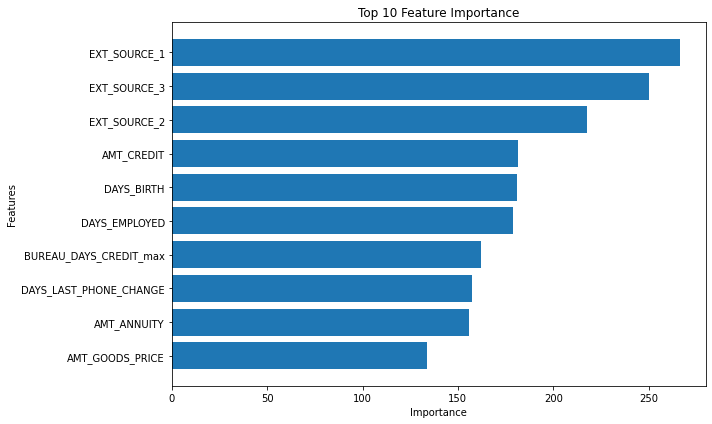

In [370]:
# 注意到BUREAU_DAYS_CREDIT_max字段在特征重要性中排名较前
# 它表示客户最近一次向信用局申请贷款的天数的最大值
plot_feature_importances(feature_importance.sort_values(by='importance',ascending=False))

In [371]:
# CPU成绩0.74767
submission.to_csv('bureau_naiveGMAE.csv',index=False)

|lightgbm_baseline|0.74385|
|---|---|
|bureau_naiveGMAE|0.74767|

#### 2.1.3 GAME策略进阶与实现（附bureau.csv特征字段详解）

到这里我们已经完成了GAME策略的基本概念和思路的讲解，在我们之前所实现的简单版的GAME策略中，我们对每个贷款申请人（SK_ID_CURR）进行分组，并对这些分组进行统计操作，比如求和、计算均值等。这样，我们就可以获得关于每个申请人的一些基本信息，例如他们的平均信用额度、最大的信用额度等。然而，我们能否挖掘得更深一些，提取出更丰富的信息呢？比如，我们能否明确地表述出一个客户在其所属类别（贷款类别）中（相对）的行为如何？

- **GAME进阶策略1：相对行为分析**

基于GAME策略，我们已经对每个借款人的行为信息进行了汇总。然而，我们同时也希望了解某个借款人的特定行为在其所在群体中的相对情况。因此，我定义了一个名为 'cat_groupby_extension' 的函数，它专门用于对分类变量进行分组聚合操作，并生成比值特征。

这个函数的关键在于，它通过计算原始列与聚合列的比值，以揭示更深层次的信息和洞察力。比值特征能够揭示不同类别之间的关系、差异和相对大小，从而使模型更好地理解某个借款人的行为在群体中的相对地位。

In [87]:
# 类别变量分组衍生特征处理，生成比值和差值
def cat_groupby_extension(df, key_col, cols, agg_list, agg_name):
    """
    对类别变量进行分组聚合操作，并生成比值和差值的衍生特征

    参数:
    - df: DataFrame，待处理的数据
    - key_col: string，分组键列
    - cols: list，需要进行聚合操作的列名列表
    - agg_list: list，聚合函数列表
    - agg_name: list，聚合函数名称列表

    返回值:
    - df: DataFrame，处理后的数据
    """
    # 进行GAME操作
    df_agg = df.groupby(key_col)[cols].agg(agg_list)# 使用groupby进行聚合操作
    df_agg.columns = ['_'.join(col) for col in df_agg.columns]
    df_agg.reset_index(inplace=True)
    df = pd.merge(df, df_agg, on=key_col, how='left')# 将聚合结果合并回原数据框


    # 根据GAME聚合的结果进一步生成衍生特征
    for col in cols:
        for agg in agg_name:
            df['_'.join([col, key_col, agg, 'ratio'])] = df[col] / (df[col + '_' + agg] + 1e-5) # 计算比值特征
            df.drop(col + '_' + agg, axis=1, inplace=True)# 删除已用于计算比值特征的聚合列

    return df

In [92]:
# 尝试调用cat_groupby_extension
# 在这里我们计算了不同CREDIT_TYPE的AMT_CREDIT_SUM聚合值的相对大小
# 'sum','mean', 'median'是对应的聚合函数名称，用于生成新的特征列名
# 以下代码将显示出头三个新生成的特征列，它们分别表示不同CREDIT_TYPE下，AMT_CREDIT_SUM与各自聚合值（总和、平均、中位数）的比值
cat_groupby_extension(bureau_df, 'CREDIT_TYPE', ['AMT_CREDIT_SUM'], agg_list=['sum','mean','median'],agg_name=['sum','mean', 'median']).iloc[:,-3:].head()

,AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio,AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio,AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio
0,0.0,0.3,0.8
1,0.0,1.3,1.9
2,0.0,1.5,3.9
3,0.0,0.5,0.8
4,0.0,8.8,22.6


**思考**：这样的比值在业务上有什么含义？

答：量化一个借款人的信贷行为，有利于发掘用户的行为模式和风险偏好。

（比如说，一个借款人在某种类型的信贷（如消费贷款）中的贷款总额，相对于所有同种类型信贷的平均贷款总额是怎样的？如果他的贷款总额远高于平均值，那么这可能意味着他有更高的贷款风险。因此，这个比值特征可以帮助我们发现并量化这样的风险模式。）

- **GAME进阶策略2：分层聚合分析**

除了相对行为分析之外我们还可以进行<font color='red'>分层聚合分析</font>。所谓的分层聚合，是指将某一类别的群体独立出来进行分析。例如，我们可以将信贷状态（CREDIT_ACTIVE）为‘Active’的用户单独拿出来，然后进行GAME聚合操作，计算一系列的统计特征。这样，我们不仅能更深入地了解这个'Active'群体的信贷行为模式，也能比较他们与其他状态群体在信贷行为上的异同。这种方法有助于模型更深层次地理解各种信贷行为的模式，从而提高我们预测模型的准确性。

In [374]:
bureau_df[bureau_df['CREDIT_ACTIVE'] == 'Active'].head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,AMT_CREDIT_DEBT_RATIO,AMT_CREDIT_DEBT_DIFF,AMT_CREDIT_ANNUITY_RATIO,IS_CREDIT_DAY_OVERDUE,IS_CREDIT_AMT_OVERDUE,DAYS_CREDIT_ENDDATE_CREDIT_DIFF,DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF,DAYS_CREDIT_ENDDATE_FACT_DIFF,CREDIT_ACTIVE_manual,OVERDUE_CREDIT_SUMDAY_RATIO,CREDIT_DAY_OVERDUE_poly
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.000000,NaN,0.0,Credit card,-20.0,NaN,0.761520,53658.000000,NaN,0,0,1283.0,NaN,NaN,5,0.0,0
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16.0,NaN,NaN,NaN,NaN,0,0,731.0,NaN,NaN,5,0.0,0
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16.0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,5,0.0,0
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21.0,NaN,NaN,NaN,NaN,0,0,1826.0,NaN,NaN,5,0.0,0
5,215354,5714467,Active,currency 1,-273,0,27456.0,NaN,0.0,0,180000.0,71017.382812,108982.617188,0.0,Credit card,-31.0,NaN,0.394541,108982.617188,NaN,0,0,27729.0,NaN,NaN,5,0.0,0


In [375]:
# 把信贷状态为active的群体单独拿出来使用GAME策略聚合，就能更深层次挖掘这个群体的行为模式
bureau_active_agg_df = bureau_df[bureau_df['CREDIT_ACTIVE'] == 'Active'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_active_agg_df.columns = ['BUREAU_ACT_'+'_'.join(col) for col in bureau_active_agg_df.columns]
bureau_active_agg_df.reset_index(inplace=True)
bureau_active_agg_df.head()

,SK_ID_CURR,BUREAU_ACT_SK_ID_BUREAU_count,BUREAU_ACT_DAYS_CREDIT_min,BUREAU_ACT_DAYS_CREDIT_max,BUREAU_ACT_DAYS_CREDIT_mean
0,100001,3,-559,-49,-309.333333
1,100002,2,-1042,-103,-572.500000
2,100003,1,-606,-606,-606.000000
3,100005,2,-137,-62,-99.500000
4,100008,1,-78,-78,-78.000000


- **把GAME策略应用到当前bureau表中**

接下来我们把上面讨论的几种GAME策略综合应用到bureau表中

- 用户贷款行为偏好测量

In [376]:
# 使用cat_groupby_extension函数衍生不同贷款类型群体的相对贷款金额特征
# 这可以帮助模型更好的区分不同贷款群体的贷款行为（贷款金额）偏好
bureau_df = cat_groupby_extension(bureau_df, 'CREDIT_TYPE', ['AMT_CREDIT_SUM'], agg_list=['sum','mean','median'],agg_name=['sum','mean', 'median'])

- 计算现有特征的统计度量

使用GAME策略对bureau表进行聚合，指定每一个特征需要衍生的统计量

In [377]:
# 针对每个SK_ID进行bureau数据聚合，计算一些基础统计量
bureau_agg = {
    'SK_ID_BUREAU':['count'],
    'DAYS_CREDIT':['min', 'max', 'mean'],
    'CREDIT_DAY_OVERDUE':['min', 'max', 'mean'],
    'DAYS_CREDIT_ENDDATE':['min', 'max', 'mean'],
    'DAYS_ENDDATE_FACT':['min', 'max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['max', 'mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean', 'sum'],
    'DAYS_CREDIT_ENDDATE_CREDIT_DIFF':['min', 'max', 'mean'],
    'DAYS_CREDIT_ENDDATE_FACT_DIFF':['min', 'max', 'mean'],
    'DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF':['min', 'max', 'mean'],
    'AMT_CREDIT_DEBT_RATIO':['min', 'max', 'mean'],
    'AMT_CREDIT_DEBT_DIFF':['min', 'max', 'mean'],
    'AMT_CREDIT_ANNUITY_RATIO':['min', 'max', 'mean'],
    'CNT_CREDIT_PROLONG':['sum','mean','count'],

    'AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio':['min', 'max', 'mean'],
    'AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio':['min', 'max', 'mean'],
    'AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio':['min', 'max', 'mean'],
    'IS_CREDIT_DAY_OVERDUE':['mean', 'sum'],
    'IS_CREDIT_AMT_OVERDUE':['mean', 'sum']
    }
bureau_agg_df = bureau_df.groupby('SK_ID_CURR').agg(bureau_agg)
bureau_agg_df.columns = ['BUREAU_'+'_'.join(col) for col in bureau_agg_df.columns]
bureau_agg_df.reset_index(inplace=True)

bureau_agg_df.head()

,SK_ID_CURR,BUREAU_SK_ID_BUREAU_count,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_mean,BUREAU_CREDIT_DAY_OVERDUE_min,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_DAYS_CREDIT_ENDDATE_min,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_ENDDATE_FACT_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_ANNUITY_max,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_sum,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_AMT_CREDIT_DEBT_RATIO_min,BUREAU_AMT_CREDIT_DEBT_RATIO_max,BUREAU_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_AMT_CREDIT_DEBT_DIFF_min,BUREAU_AMT_CREDIT_DEBT_DIFF_max,BUREAU_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_mean,BUREAU_CNT_CREDIT_PROLONG_count,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_min,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_max,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_mean,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_min,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_max,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_mean,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_min,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_max,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_mean,BUREAU_IS_CREDIT_DAY_OVERDUE_mean,BUREAU_IS_CREDIT_DAY_OVERDUE_sum,BUREAU_IS_CREDIT_AMT_OVERDUE_mean,BUREAU_IS_CREDIT_AMT_OVERDUE_sum
0,100001,7,-1572,-49,-735.000000,0,0,0.0,-1329.0,1778.0,82.4375,-1328.0,-544.0,-825.5,NaN,NaN,378000.000000,207623.578125,1.453365e+06,373239.0,85240.929688,596686.5,0.0,0.0,0.0,10822.5,3545.357178,24817.5,243.0,1827.0,817.428589,-335.0,-32.0,-228.75,-1.0,698.0,197.00000,0.0,0.987405,0.282518,4761.0,279720.000000,122382.640625,0.0,0.055627,0.013996,0,0.0,7,0.279309,1.234842,0.678260,0.714286,3.157895,1.734533,2.231598e-07,9.866011e-07,5.419091e-07,0.0,0,0.0,0
1,100002,8,-1437,-103,-874.000000,0,0,0.0,-1072.0,780.0,-349.0000,-1185.0,-36.0,-697.5,5043.64502,1681.029053,450000.000000,108131.945312,8.650556e+05,245781.0,49156.199219,245781.0,0.0,0.0,0.0,0.0,0.000000,0.0,87.0,1822.0,719.833313,-609.0,-76.0,-277.00,0.0,1029.0,252.62500,0.0,0.546180,0.109236,0.0,204219.000000,98388.515625,0.0,0.000000,0.000000,0,0.0,8,0.000000,1.470050,0.397621,0.000000,3.759398,0.906738,0.000000e+00,1.174525e-06,4.892080e-07,0.0,0,0.0,0
2,100003,4,-2586,-606,-1400.750000,0,0,0.0,-2434.0,1216.0,-544.5000,-2132.0,-540.0,-1098.0,0.00000,0.000000,810000.000000,254350.125000,1.017400e+06,0.0,0.000000,0.0,0.0,0.0,0.0,NaN,NaN,0.0,152.0,1822.0,856.250000,-1096.0,-154.0,-568.00,-302.0,201.0,-33.65625,0.0,0.000000,0.000000,22248.0,810000.000000,254350.125000,NaN,NaN,NaN,0,0.0,4,0.072679,4.696513,1.414706,0.185865,6.923077,2.169359,5.806852e-08,1.167720e-05,3.386683e-06,0.0,0,0.0,0
3,100004,2,-1326,-408,-867.000000,0,0,0.0,-595.0,-382.0,-488.5000,-683.0,-382.0,-532.5,0.00000,0.000000,94537.796875,94518.898438,1.890378e+05,0.0,0.000000,0.0,0.0,0.0,0.0,NaN,NaN,0.0,26.0,731.0,378.500000,-643.0,-26.0,-334.50,0.0,88.0,44.00000,0.0,0.000000,0.000000,94500.0,94537.796875,94518.898438,NaN,NaN,NaN,0,0.0,2,0.308710,0.308834,0.308772,0.789474,0.789789,0.789632,2.466503e-07,2.467489e-07,2.466996e-07,0.0,0,0.0,0
4,100005,3,-373,-62,-190.666

- 分层聚合分析

将分层聚合分析的思路应用于CREDIT_ACTIVE、CREDIT_TYPE、DAYS_CREDIT、CREDIT_CURRENCY等字段

1. 分析信贷状态各群体的行为模式：按信贷状态进行聚合

In [378]:
# credit active聚合，分析不同信贷状态借款人的行为模式
bureau_active_agg_df = bureau_df[bureau_df['CREDIT_ACTIVE'] == 'Active'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_closed_agg_df = bureau_df[bureau_df['CREDIT_ACTIVE'] == 'Closed'].groupby(['SK_ID_CURR']).agg(bureau_agg) 
bureau_active_agg_df.columns = ['BUREAU_ACT_'+'_'.join(col) for col in bureau_active_agg_df.columns]
bureau_closed_agg_df.columns = ['BUREAU_CLO_'+'_'.join(col) for col in bureau_closed_agg_df.columns]
bureau_active_agg_df.reset_index(inplace=True)
bureau_closed_agg_df.reset_index(inplace=True)
bureau_active_agg_df.head()

,SK_ID_CURR,BUREAU_ACT_SK_ID_BUREAU_count,BUREAU_ACT_DAYS_CREDIT_min,BUREAU_ACT_DAYS_CREDIT_max,BUREAU_ACT_DAYS_CREDIT_mean,BUREAU_ACT_CREDIT_DAY_OVERDUE_min,BUREAU_ACT_CREDIT_DAY_OVERDUE_max,BUREAU_ACT_CREDIT_DAY_OVERDUE_mean,BUREAU_ACT_DAYS_CREDIT_ENDDATE_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_mean,BUREAU_ACT_DAYS_ENDDATE_FACT_min,BUREAU_ACT_DAYS_ENDDATE_FACT_max,BUREAU_ACT_DAYS_ENDDATE_FACT_mean,BUREAU_ACT_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_ACT_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_ACT_AMT_CREDIT_SUM_max,BUREAU_ACT_AMT_CREDIT_SUM_mean,BUREAU_ACT_AMT_CREDIT_SUM_sum,BUREAU_ACT_AMT_CREDIT_SUM_DEBT_max,BUREAU_ACT_AMT_CREDIT_SUM_DEBT_mean,BUREAU_ACT_AMT_CREDIT_SUM_DEBT_sum,BUREAU_ACT_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_ACT_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_ACT_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_ACT_AMT_ANNUITY_max,BUREAU_ACT_AMT_ANNUITY_mean,BUREAU_ACT_AMT_ANNUITY_sum,BUREAU_ACT_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_ACT_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_ACT_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_ACT_AMT_CREDIT_DEBT_RATIO_min,BUREAU_ACT_AMT_CREDIT_DEBT_RATIO_max,BUREAU_ACT_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_ACT_AMT_CREDIT_DEBT_DIFF_min,BUREAU_ACT_AMT_CREDIT_DEBT_DIFF_max,BUREAU_ACT_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_ACT_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_ACT_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_ACT_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_ACT_CNT_CREDIT_PROLONG_sum,BUREAU_ACT_CNT_CREDIT_PROLONG_mean,BUREAU_ACT_CNT_CREDIT_PROLONG_count,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_min,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_max,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_mean,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_min,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_max,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_mean,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_min,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_max,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_mean,BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_mean,BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_sum,BUREAU_ACT_IS_CREDIT_AMT_OVERDUE_mean,BUREAU_ACT_IS_CREDIT_AMT_OVERDUE_sum
0,100001,3,-559,-49,-309.333333,0,0,0.0,411.0,1778.0,1030.0,NaN,NaN,NaN,NaN,NaN,378000.0,294675.00000,884025.0000,373239.0,198895.50,596686.5,0.0,0.0,0.0,10822.5,8272.50,24817.5,731.0,1827.0,1339.666626,NaN,NaN,NaN,NaN,NaN,NaN,0.335128,0.987405,0.659208,4761.000000,224514.0,95779.50000,0.013713,0.055627,0.032657,0,0.0,3,0.549946,1.234842,0.962637,1.406391,3.157895,2.461780,4.393898e-07,9.866011e-07,7.691182e-07,0.0,0,0.0,0
1,100002,2,-1042,-103,-572.500000,0,0,0.0,780.0,780.0,780.0,NaN,NaN,NaN,40.5,40.5,450000.0,240994.28125,481988.5625,245781.0,122890.50,245781.0,0.0,0.0,0.0,0.0,0.00,0.0,1822.0,1822.0,1822.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.546180,0.273090,31988.564453,204219.0,118103.78125,0.000000,0.000000,0.000000,0,0.0,2,0.185475,1.470050,0.827762,0.273407,3.759398,2.016402,4.611568e-07,1.174525e-06,8.178409e-07,0.0,0,0.0,0
2,100003,1,-606,-606,-606.000000,0,0,0.0,1216.0,1216.0,1216.0,NaN,NaN,NaN,0.0,0.0,810000.0,810000.00000,810000.0000,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,0.0,1822.0,1822.0,1822.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,810000.000000,810000.0,810000.00000,NaN,NaN,NaN,0,0.0,1,4.696513,4.696513,4.696513,6.923077,6.923077,6.923077,1.167720e-05,1.167720e-05,1.167720e-05,0.0,0,0.0,0
3,100005,2,-137,-62,-99.500000,0,0,0.0,122.0,1324.0,723.0,NaN,NaN,NaN,0.0,0.0,568800.0,299313.00000,598626.0000,543087.0,284204.25,568408.5,0.0,0.0,0.0,4261.5,2130.75,4261.5,184.0,1461.0,822.500000,NaN,NaN,NaN,NaN,NaN,NaN,0.848974,0.954794,0.901884,4504.500000,25713.0,15108.75000,0.000000,0.142879,0.071439,0,0.0,2,0.097435,1.858143,0.977789

2. 分析各类型贷款群体的行为模式：按贷款类型进行聚合

In [379]:
# bureau credit type聚合，分析不同贷款类型借款人的行为模式
bureau_consumer_agg_df = bureau_df[bureau_df['CREDIT_TYPE'] == 'Consumer credit'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_card_agg_df = bureau_df[bureau_df['CREDIT_TYPE'] == 'Credit card'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_car_agg_df = bureau_df[bureau_df['CREDIT_TYPE'] == 'Car loan'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_mortgage_agg_df = bureau_df[bureau_df['CREDIT_TYPE'] == 'Mortgage'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_microloan_agg_df = bureau_df[bureau_df['CREDIT_TYPE'] == 'Microloan'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_consumer_agg_df.columns = ['BUREAU_CONSUME_'+'_'.join(col) for col in bureau_consumer_agg_df.columns]
bureau_card_agg_df.columns = ['BUREAU_CARD_'+'_'.join(col) for col in bureau_card_agg_df.columns]
bureau_car_agg_df.columns = ['BUREAU_CAR_'+'_'.join(col) for col in bureau_car_agg_df.columns]
bureau_mortgage_agg_df.columns = ['BUREAU_MORTGAGE_'+'_'.join(col) for col in bureau_mortgage_agg_df.columns]
bureau_microloan_agg_df.columns = ['BUREAU_MICRO_'+'_'.join(col) for col in bureau_microloan_agg_df.columns]
bureau_consumer_agg_df.reset_index(inplace=True)
bureau_card_agg_df.reset_index(inplace=True)
bureau_car_agg_df.reset_index(inplace=True)
bureau_mortgage_agg_df.reset_index(inplace=True)
bureau_microloan_agg_df.reset_index(inplace=True)
bureau_consumer_agg_df.head()

,SK_ID_CURR,BUREAU_CONSUME_SK_ID_BUREAU_count,BUREAU_CONSUME_DAYS_CREDIT_min,BUREAU_CONSUME_DAYS_CREDIT_max,BUREAU_CONSUME_DAYS_CREDIT_mean,BUREAU_CONSUME_CREDIT_DAY_OVERDUE_min,BUREAU_CONSUME_CREDIT_DAY_OVERDUE_max,BUREAU_CONSUME_CREDIT_DAY_OVERDUE_mean,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_min,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_max,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_mean,BUREAU_CONSUME_DAYS_ENDDATE_FACT_min,BUREAU_CONSUME_DAYS_ENDDATE_FACT_max,BUREAU_CONSUME_DAYS_ENDDATE_FACT_mean,BUREAU_CONSUME_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_CONSUME_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_CONSUME_AMT_CREDIT_SUM_max,BUREAU_CONSUME_AMT_CREDIT_SUM_mean,BUREAU_CONSUME_AMT_CREDIT_SUM_sum,BUREAU_CONSUME_AMT_CREDIT_SUM_DEBT_max,BUREAU_CONSUME_AMT_CREDIT_SUM_DEBT_mean,BUREAU_CONSUME_AMT_CREDIT_SUM_DEBT_sum,BUREAU_CONSUME_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_CONSUME_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_CONSUME_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_CONSUME_AMT_ANNUITY_max,BUREAU_CONSUME_AMT_ANNUITY_mean,BUREAU_CONSUME_AMT_ANNUITY_sum,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_CONSUME_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_CONSUME_AMT_CREDIT_DEBT_RATIO_min,BUREAU_CONSUME_AMT_CREDIT_DEBT_RATIO_max,BUREAU_CONSUME_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_CONSUME_AMT_CREDIT_DEBT_DIFF_min,BUREAU_CONSUME_AMT_CREDIT_DEBT_DIFF_max,BUREAU_CONSUME_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_CONSUME_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_CONSUME_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_CONSUME_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_CONSUME_CNT_CREDIT_PROLONG_sum,BUREAU_CONSUME_CNT_CREDIT_PROLONG_mean,BUREAU_CONSUME_CNT_CREDIT_PROLONG_count,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_min,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_max,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_mean,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_min,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_max,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_mean,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_min,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_max,BUREAU_CONSUME_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_mean,BUREAU_CONSUME_IS_CREDIT_DAY_OVERDUE_mean,BUREAU_CONSUME_IS_CREDIT_DAY_OVERDUE_sum,BUREAU_CONSUME_IS_CREDIT_AMT_OVERDUE_mean,BUREAU_CONSUME_IS_CREDIT_AMT_OVERDUE_sum
0,100001,7,-1572,-49,-735.00,0,0,0.0,-1329.0,1778.0,82.4375,-1328.0,-544.0,-825.5,NaN,NaN,378000.000000,207623.578125,1.453365e+06,373239.0,85240.929688,596686.5,0.0,0.0,0.0,10822.5,3545.357178,24817.5,243.0,1827.0,817.428589,-335.0,-32.0,-228.75,-1.0,698.0,197.0,0.000000,0.987405,0.282518,4761.0,279720.000000,122382.640625,0.0,0.055627,0.013996,0,0.0,7,0.279309,1.234842,0.678260,0.714286,3.157895,1.734533,2.231598e-07,9.866011e-07,5.419091e-07,0.0,0,0.0,0
1,100002,4,-1437,-645,-1061.25,0,0,0.0,-1072.0,780.0,-279.5000,-1185.0,-36.0,-710.5,5043.64502,2788.215088,450000.000000,181201.500000,7.248060e+05,245781.0,81927.000000,245781.0,0.0,0.0,0.0,0.0,0.000000,0.0,210.0,1822.0,781.750000,-609.0,-210.0,-357.00,0.0,121.0,78.0,0.000000,0.546180,0.182060,120735.0,204219.000000,153318.000000,0.0,0.000000,0.000000,0,0.0,4,0.062301,1.470050,0.591945,0.159323,3.759398,1.513797,4.977637e-08,1.174525e-06,4.729460e-07,0.0,0,0.0,0
2,100003,2,-2586,-775,-1680.50,0,0,0.0,-2434.0,-420.0,-1427.0000,-2132.0,-621.0,-1376.0,0.00000,0.000000,72652.500000,47450.250000,9.490050e+04,0.0,0.000000,0.0,0.0,0.0,0.0,NaN,NaN,0.0,152.0,355.0,253.500000,-454.0,-154.0,-304.00,-302.0,201.0,-50.5,0.000000,0.000000,0.000000,22248.0,72652.500000,47450.250000,NaN,NaN,NaN,0,0.0,2,0.072679,0.237340,0.155009,0.185865,0.606955,0.396410,5.806852e-08,1.896271e-0

3. 分析不同贷款时间段群体的行为模式：按贷款时间进行聚合

In [380]:
# bureau时间聚合，分析不同时间借款人的行为模式
bureau_6M_agg_df = bureau_df[bureau_df['DAYS_CREDIT'] >= -180].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_12M_agg_df = bureau_df[bureau_df['DAYS_CREDIT'] >= -360].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_6M_agg_df.columns = ['BUREAU_6M_'+'_'.join(col) for col in bureau_6M_agg_df.columns]
bureau_12M_agg_df.columns = ['BUREAU_12M_'+'_'.join(col) for col in bureau_12M_agg_df.columns]
bureau_6M_agg_df.reset_index(inplace=True)
bureau_12M_agg_df.reset_index(inplace=True)

4. 分析不同贷款货币类型群体的行为模式：按货币类型进行聚合

In [381]:
bureau_df['CREDIT_CURRENCY'].value_counts()

currency 1    1715020
currency 2       1224
currency 3        174
currency 4         10
Name: CREDIT_CURRENCY, dtype: int64

In [382]:
# bureau currency聚合，分析不同货币类型借款人的行为模式
bureau_currency2_agg_df = bureau_df[bureau_df['CREDIT_CURRENCY'] == 'currency 2'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_currency3_agg_df = bureau_df[bureau_df['CREDIT_CURRENCY'] == 'currency 3'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_currency4_agg_df = bureau_df[bureau_df['CREDIT_CURRENCY'] == 'currency 4'].groupby(['SK_ID_CURR']).agg(bureau_agg)
bureau_currency2_agg_df.columns = ['BUREAU_CURRENCY2_'+'_'.join(col) for col in bureau_currency2_agg_df.columns]
bureau_currency3_agg_df.columns = ['BUREAU_CURRENCY3_'+'_'.join(col) for col in bureau_currency3_agg_df.columns]
bureau_currency4_agg_df.columns = ['BUREAU_CURRENCY4_'+'_'.join(col) for col in bureau_currency4_agg_df.columns]

bureau_currency2_agg_df.reset_index(inplace=True)
bureau_currency3_agg_df.reset_index(inplace=True)
bureau_currency4_agg_df.reset_index(inplace=True)
bureau_currency2_agg_df.head()

,SK_ID_CURR,BUREAU_CURRENCY2_SK_ID_BUREAU_count,BUREAU_CURRENCY2_DAYS_CREDIT_min,BUREAU_CURRENCY2_DAYS_CREDIT_max,BUREAU_CURRENCY2_DAYS_CREDIT_mean,BUREAU_CURRENCY2_CREDIT_DAY_OVERDUE_min,BUREAU_CURRENCY2_CREDIT_DAY_OVERDUE_max,BUREAU_CURRENCY2_CREDIT_DAY_OVERDUE_mean,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_min,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_max,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_mean,BUREAU_CURRENCY2_DAYS_ENDDATE_FACT_min,BUREAU_CURRENCY2_DAYS_ENDDATE_FACT_max,BUREAU_CURRENCY2_DAYS_ENDDATE_FACT_mean,BUREAU_CURRENCY2_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_CURRENCY2_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_CURRENCY2_AMT_CREDIT_SUM_max,BUREAU_CURRENCY2_AMT_CREDIT_SUM_mean,BUREAU_CURRENCY2_AMT_CREDIT_SUM_sum,BUREAU_CURRENCY2_AMT_CREDIT_SUM_DEBT_max,BUREAU_CURRENCY2_AMT_CREDIT_SUM_DEBT_mean,BUREAU_CURRENCY2_AMT_CREDIT_SUM_DEBT_sum,BUREAU_CURRENCY2_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_CURRENCY2_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_CURRENCY2_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_CURRENCY2_AMT_ANNUITY_max,BUREAU_CURRENCY2_AMT_ANNUITY_mean,BUREAU_CURRENCY2_AMT_ANNUITY_sum,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_CURRENCY2_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_CURRENCY2_AMT_CREDIT_DEBT_RATIO_min,BUREAU_CURRENCY2_AMT_CREDIT_DEBT_RATIO_max,BUREAU_CURRENCY2_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_CURRENCY2_AMT_CREDIT_DEBT_DIFF_min,BUREAU_CURRENCY2_AMT_CREDIT_DEBT_DIFF_max,BUREAU_CURRENCY2_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_CURRENCY2_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_CURRENCY2_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_CURRENCY2_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_CURRENCY2_CNT_CREDIT_PROLONG_sum,BUREAU_CURRENCY2_CNT_CREDIT_PROLONG_mean,BUREAU_CURRENCY2_CNT_CREDIT_PROLONG_count,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_min,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_max,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_mean,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_min,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_max,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_mean,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_min,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_max,BUREAU_CURRENCY2_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_mean,BUREAU_CURRENCY2_IS_CREDIT_DAY_OVERDUE_mean,BUREAU_CURRENCY2_IS_CREDIT_DAY_OVERDUE_sum,BUREAU_CURRENCY2_IS_CREDIT_AMT_OVERDUE_mean,BUREAU_CURRENCY2_IS_CREDIT_AMT_OVERDUE_sum
0,100280,1,-2861,-2861,-2861.0,0,0,0.0,-1034.0,-1034.0,-1034.0,-2616.0,-2616.0,-2616.0,0.0,0.0,5398650.0,5398650.0,5398650.0,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,0.0,1827.0,1827.0,1827.0,-245.0,-245.0,-245.0,1582.0,1582.0,1582.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,1,2.959923,2.959923,2.959923,3.472862,3.472862,3.472862,0.000107,0.000107,0.000107,0.0,0,0.0,0
1,101769,2,-2877,-2325,-2601.0,0,0,0.0,-2724.0,-2724.0,-2724.0,-2724.0,-2724.0,-2724.0,NaN,NaN,92070000.0,47432092.0,94864184.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,153.0,153.0,153.0,-153.0,-153.0,-153.0,0.0,0.0,0.0,0.0,0.0,0.0,2794185.0,2794185.0,2794185.0,NaN,NaN,NaN,0,0.0,2,9.127979,16.737885,12.932932,20.459999,23.343233,21.901615,0.000007,0.000910,0.000459,0.0,0,0.0,0
2,102224,1,-2623,-2623,-2623.0,0,0,0.0,-798.0,-798.0,-798.0,-798.0,-798.0,-798.0,67518.0,67518.0,6014682.0,6014682.0,6014682.0,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,0.0,1825.0,1825.0,1825.0,-1825.0,-1825.0,-1825.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,1,3.297676,3.297676,3.297676,3.869145,3.869145,3.869145,0.000119,0.000119,0.000119,0.0,0,0.0,0
3,102509,1,-2624,-2624,-2624.0,0,0,0.0,-1542.0,-1542.0,-1542.0,-1542.0,-1542.0,-1542.0,NaN,NaN,3438954.0,3438954.0,3438954

- **把GAME策略应用到当前bureau_balance表中**

到这里我们就已经完成了bureau表的衍生，接下来我们要将GAME策略应用到bureau_balance表中，在此之前，我们先将bureau_balance表合并到bureau表中汇总。

In [383]:
# 在预处理bureau_balance数据集的过程中，我们会先将其与bureau数据集合并，然后计算一些统计量以及构建新的特征。
bureau_balance_df = pd.merge(left=bureau_balance_df, right=bureau_df[['SK_ID_CURR', 'SK_ID_BUREAU']], on='SK_ID_BUREAU', how='left')

根据STATUS的业务解释: 客户在该月份的还款状态（C表示已结清，X表示没有贷款，0表示按时还款，1-5表示逾期天数等级），我们创建一个新的字段BUREAU_BALANCE_IS_OVERDUE来表示用户是否逾期。

In [384]:
# 创建新的字段'BUREAU_BALANCE_IS_OVERDUE'，判断该信贷记录是否逾期
bureau_balance_df['BUREAU_BALANCE_IS_OVERDUE'] = bureau_balance_df['STATUS'].apply(lambda x:1 if x not in ['C', '0', 'X'] else 0)

接下来使用GAME策略计算一些基础统计量，手动指定某一个特征要进行何种衍生

In [385]:
# 计算bureau_balance表里的一些基础统计量
bureau_balance_agg = {
    'SK_ID_CURR':['count'],
    'BUREAU_BALANCE_IS_OVERDUE':['mean', 'sum'],
    'MONTHS_BALANCE': ['min', 'max', 'mean']
    }
bureau_balance_agg_df = bureau_balance_df.groupby('SK_ID_CURR').agg(bureau_balance_agg)
bureau_balance_agg_df.columns = ['BUREAU_BALANCE_'+'_'.join(col) for col in bureau_balance_agg_df.columns]
bureau_balance_agg_df.reset_index(inplace=True)
bureau_balance_agg_df.head()

,SK_ID_CURR,BUREAU_BALANCE_SK_ID_CURR_count,BUREAU_BALANCE_BUREAU_BALANCE_IS_OVERDUE_mean,BUREAU_BALANCE_BUREAU_BALANCE_IS_OVERDUE_sum,BUREAU_BALANCE_MONTHS_BALANCE_min,BUREAU_BALANCE_MONTHS_BALANCE_max,BUREAU_BALANCE_MONTHS_BALANCE_mean
0,100001.0,172,0.005814,1,-51,0,-16.279070
1,100002.0,110,0.245455,27,-47,0,-24.554545
2,100005.0,21,0.000000,0,-12,0,-4.333333
3,100010.0,72,0.000000,0,-90,-2,-46.000000
4,100013.0,230,0.030435,7,-68,0,-29.373913


In [386]:
# 合并之前所有衍生的结果
bureau_agg_df = bureau_agg_df.merge(bureau_active_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_closed_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_consumer_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_card_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_car_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_mortgage_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_microloan_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_currency2_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_currency3_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_currency4_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_6M_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df = bureau_agg_df.merge(bureau_12M_agg_df, on='SK_ID_CURR', how='left')

在金融领域，还有一个常见而且极其重要的信贷风险评估指标：**违约天数占贷款总次数的比重**。这是一个**用来评估借款人信用风险的重要衡量标准**。金融机构通常会使用这个指标来衡量借款人的信用行为，以决定是否批准贷款申请。此外，这个指标也可以用来确定贷款的利率和其他条件。因此，逾期天数占总借贷次数的比例在金融领域中是一个非常重要的评估角度。

在特征工程部分的开头，我们讨论过，其实特征工程可以看做是将业务知识转化为数字的过程。而这一系列特征工程过程中，我们主要是通过不断的计算不同群体的数理统计特征来完成的，接下来也不例外，我们尝试对不同信贷状态的人去分别进行衍生：

In [387]:
# BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_sum：信贷状态为active群体的违约天数
# BUREAU_SK_ID_BUREAU_count：借贷次数
# 下面的计算是基于逾期天数来评估贷款状态为"Active"或"Closed"的借贷记录的风险程度
# 我们会计算逾期的天数占总借贷次数的比例
bureau_agg_df['BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO'] = bureau_agg_df['BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_sum'] / bureau_agg_df['BUREAU_SK_ID_BUREAU_count']
bureau_agg_df['BUREAU_CLO_IS_CREDIT_DAY_OVERDUE_RATIO'] = bureau_agg_df['BUREAU_CLO_IS_CREDIT_DAY_OVERDUE_sum'] / bureau_agg_df['BUREAU_SK_ID_BUREAU_count']
bureau_agg_df = bureau_agg_df.merge(bureau_balance_agg_df, on='SK_ID_CURR', how='left')
bureau_agg_df.head()

,SK_ID_CURR,BUREAU_SK_ID_BUREAU_count,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_mean,BUREAU_CREDIT_DAY_OVERDUE_min,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_DAYS_CREDIT_ENDDATE_min,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_ENDDATE_FACT_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_ANNUITY_max,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_sum,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_AMT_CREDIT_DEBT_RATIO_min,BUREAU_AMT_CREDIT_DEBT_RATIO_max,BUREAU_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_AMT_CREDIT_DEBT_DIFF_min,BUREAU_AMT_CREDIT_DEBT_DIFF_max,BUREAU_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_mean,BUREAU_CNT_CREDIT_PROLONG_count,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_min,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_max,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_mean,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_min,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_max,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_median_ratio_mean,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_min,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_max,BUREAU_AMT_CREDIT_SUM_CREDIT_TYPE_sum_ratio_mean,BUREAU_IS_CREDIT_DAY_OVERDUE_mean,BUREAU_IS_CREDIT_DAY_OVERDUE_sum,BUREAU_IS_CREDIT_AMT_OVERDUE_mean,BUREAU_IS_CREDIT_AMT_OVERDUE_sum,BUREAU_ACT_SK_ID_BUREAU_count,BUREAU_ACT_DAYS_CREDIT_min,BUREAU_ACT_DAYS_CREDIT_max,BUREAU_ACT_DAYS_CREDIT_mean,BUREAU_ACT_CREDIT_DAY_OVERDUE_min,BUREAU_ACT_CREDIT_DAY_OVERDUE_max,BUREAU_ACT_CREDIT_DAY_OVERDUE_mean,BUREAU_ACT_DAYS_CREDIT_ENDDATE_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_mean,BUREAU_ACT_DAYS_ENDDATE_FACT_min,BUREAU_ACT_DAYS_ENDDATE_FACT_max,BUREAU_ACT_DAYS_ENDDATE_FACT_mean,BUREAU_ACT_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_ACT_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_ACT_AMT_CREDIT_SUM_max,BUREAU_ACT_AMT_CREDIT_SUM_mean,BUREAU_ACT_AMT_CREDIT_SUM_sum,BUREAU_ACT_AMT_CREDIT_SUM_DEBT_max,BUREAU_ACT_AMT_CREDIT_SUM_DEBT_mean,BUREAU_ACT_AMT_CREDIT_SUM_DEBT_sum,BUREAU_ACT_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_ACT_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_ACT_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_ACT_AMT_ANNUITY_max,BUREAU_ACT_AMT_ANNUITY_mean,BUREAU_ACT_AMT_ANNUITY_sum,BUREAU_ACT_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_CREDIT_DIFF_mean,BUREAU_ACT_DAYS_CREDIT_ENDDATE_FACT_DIFF_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_FACT_DIFF_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean,BUREAU_ACT_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min,BUREAU_ACT_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max,BUREAU_ACT_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean,BUREAU_ACT_AMT_CREDIT_DEBT_RATIO_min,BUREAU_ACT_AMT_CREDIT_DEBT_RATIO_max,BUREAU_ACT_AMT_CREDIT_DEBT_RATIO_mean,BUREAU_ACT_AMT_CREDIT_DEBT_DIFF_min,BUREAU_ACT_AMT_CREDIT_DEBT_DIFF_max,BUREAU_ACT_AMT_CREDIT_DEBT_DIFF_mean,BUREAU_ACT_AMT_CREDIT_ANNUITY_RATIO_min,BUREAU_ACT_AMT_CREDIT_ANNUITY_RATIO_max,BUREAU_ACT_AMT_CREDIT_ANNUITY_RATIO_mean,BUREAU_ACT_CNT_CREDIT_PROLONG_sum,BUREAU_ACT_CNT_CREDIT_PROLONG_mean,BUREAU_ACT_CNT_CREDIT_PROLONG_count,BUREAU_ACT_AMT_CREDIT_SUM_CREDIT_TYPE_mean_ratio_mi

In [388]:
# 'BUREAU_AMT_CREDIT_SUM_DEBT_sum'：所有贷款记录的总债务
# 'BUREAU_AMT_CREDIT_SUM_sum'：所有贷款记录的总信贷额度
# 计算总债务与总信贷的比例，这个比例可以反映借款人的偿债能力
bureau_agg_df['BUREAU_DEBT_OVER_CREDIT'] = bureau_agg_df['BUREAU_AMT_CREDIT_SUM_DEBT_sum']/(bureau_agg_df['BUREAU_AMT_CREDIT_SUM_sum'] + 1e-5)

# 'BUREAU_ACT_AMT_CREDIT_SUM_sum'：信贷状态为"Active"这个群体的借贷记录的总信贷额度
# 计算信贷状态为"Active"群体的借款记录的总债务与总信贷的比例，这个比例可以反映借款人在当前活动贷款中的偿债能力
bureau_agg_df['BUREAU_ACTIVE_DEBT_OVER_CREDIT'] = bureau_agg_df['BUREAU_AMT_CREDIT_SUM_DEBT_sum']/(bureau_agg_df['BUREAU_ACT_AMT_CREDIT_SUM_sum'] + 1e-5)

接下来，我们删掉在这个过程中产生的所有中间变量，只留下最后需要并入主表的bureau_agg_df

In [389]:
del bureau_df, bureau_active_agg_df, bureau_closed_agg_df, bureau_consumer_agg_df, bureau_card_agg_df, bureau_mortgage_agg_df, bureau_microloan_agg_df
gc.collect()

7251

In [390]:
del bureau_balance_df,bureau_currency2_agg_df,bureau_currency3_agg_df,bureau_currency4_agg_df
gc.collect()

21

将bureau_agg_df并入主表，完成GAME策略的最后一步estimate：

In [391]:
reduce_mem_usage(bureau_agg_df)
train = application_train.merge(bureau_agg_df, on='SK_ID_CURR', how='left')
test = application_test.merge(bureau_agg_df, on='SK_ID_CURR', how='left')

  3%|▎         | 28/804 [00:00<00:02, 267.53it/s]

100%|██████████| 804/804 [00:05<00:00, 146.50it/s]


Mem. usage decreased to 627.91 Mb (42.2% reduction)


In [392]:
train.shape

(307505, 1047)

In [393]:
train.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in train.columns]
test.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in test.columns]
valid_auc,feature_importance,submission = fit(train,test)

[1]	training's binary_logloss: 0.275736	valid_1's binary_logloss: 0.271473
[2]	training's binary_logloss: 0.271542	valid_1's binary_logloss: 0.267743
[3]	training's binary_logloss: 0.268221	valid_1's binary_logloss: 0.264845
[4]	training's binary_logloss: 0.265509	valid_1's binary_logloss: 0.26245
[5]	training's binary_logloss: 0.263171	valid_1's binary_logloss: 0.260383
[6]	training's binary_logloss: 0.2612	valid_1's binary_logloss: 0.258651
[7]	training's binary_logloss: 0.259508	valid_1's binary_logloss: 0.257271
[8]	training's binary_logloss: 0.258062	valid_1's binary_logloss: 0.256064
[9]	training's binary_logloss: 0.256753	valid_1's binary_logloss: 0.254937
[10]	training's binary_logloss: 0.255468	valid_1's binary_logloss: 0.253873
[11]	training's binary_logloss: 0.254376	valid_1's binary_logloss: 0.253023
[12]	training's binary_logloss: 0.253396	valid_1's binary_logloss: 0.252267
[13]	training's binary_logloss: 0.25249	valid_1's binary_logloss: 0.251587
[14]	training's binary_lo

在建模的过程中，随着特征的增加，训练速度明显变慢了

In [394]:
# 本地验证成绩为0.768，相较于baseline有较大的提升
valid_auc

0.7686689597096186

In [395]:
feature_importance.sort_values(by='importance',ascending=False)

,feature,importance
32,EXT_SOURCE_1,166.8
33,EXT_SOURCE_2,143.8
34,EXT_SOURCE_3,110.0
11,DAYS_BIRTH,90.6
7,AMT_CREDIT,90.0
...,...,...
735,BUREAU_CURRENCY2_CREDIT_DAY_OVERDUE_max,0.0
734,BUREAU_CURRENCY2_CREDIT_DAY_OVERDUE_min,0.0
732,BUREAU_CURRENCY2_DAYS_CREDIT_max,0.0
730,BUREAU_CURRENCY2_SK_ID_BUREAU_count,0.0


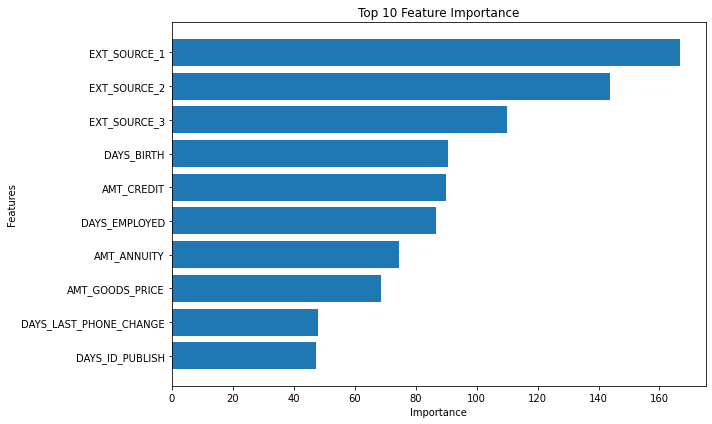

In [396]:
# 特征重要性似乎又回到了baseline的样子
plot_feature_importances(feature_importance.sort_values(by='importance',ascending=False))

In [397]:
# baseline成绩0.74385
# CPU成绩0.76348
submission.to_csv('bureau_GMAE.csv',index=False)

**注意**：如果没有安装lightgbm的GPU版本请不要运行下面的代码

In [398]:
def sigmoid(x):
    """
    Sigmoid函数，用于转换预测结果为概率
    """
    return 1. / (1. + np.exp(-x))

def fit_gpu(train=application_train, valid=application_test):
    """
    使用GPU进行模型训练的函数

    参数:
    - train: 训练集，默认为application_train
    - valid: 验证集，默认为application_test

    返回值:
    - valid_auc: 验证集上的AUC指标
    - feature_importances: 特征重要性 dataframe
    - test_results: 测试集结果 dataframe
    """
    test = valid.copy()

    X_train = train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
    y_train = train['TARGET']

    # 五折交叉验证
    folds = KFold(n_splits=5, shuffle=True, random_state=1412)

    oof_preds = np.zeros(y_train.shape[0])
    test_preds = np.zeros(test.shape[0])

    # 提取特征名
    feature_names = list(X_train.columns)

    # 空数组用于存储特征重要性值
    feature_importance_values = np.zeros(len(feature_names))

    # 实例化LGBMClassifier模型
    lgb = LGBMClassifier(
        n_estimators=10000,  # 为了保证模型的学习能力，我们设置为10000
        early_stopping_round=200,  # 为了节约时间，我们使用提前停止
        random_state=2024,  # 锁定随机数种子
        max_bin=200,  # ightGBMError: bin size 257 cannot run on GPU，这个数字超过252，就会出现这样的错误
        device_type="gpu"
    )

    for fold_idx, (train_idx, valid_idx) in enumerate(folds.split(X_train)):
        X = X_train.iloc[train_idx, :]
        y = y_train.iloc[train_idx]
        valid_X = X_train.iloc[valid_idx, :]
        valid_y = y_train.iloc[valid_idx]

        # 拟合模型
        lgb.fit(X, y, eval_set=[(X, y), (valid_X, valid_y)])

        # 记录特征重要性
        feature_importance_values += lgb.feature_importances_ / folds.n_splits

        # 验证集上的预测结果
        oof_preds[valid_idx] = sigmoid(lgb.predict_proba(valid_X, num_iteration=lgb.best_iteration_)[:, 1])

        # 测试集上的预测结果
        test_preds += sigmoid(lgb.predict_proba(test[feature_names], num_iteration=lgb.best_iteration_)[:, 1]) / folds.n_splits

    # 计算验证集上的AUC指标
    valid_auc = roc_auc_score(y_train, oof_preds)

    # 构建特征重要性的DataFrame
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})

    # 将测试集的预测结果添加到DataFrame中
    test['TARGET'] = test_preds

    return valid_auc, feature_importances, test[['SK_ID_CURR', 'TARGET']]


In [399]:
valid_auc,feature_importance,submission = fit_gpu(train,test)

[1]	training's binary_logloss: 0.275759	valid_1's binary_logloss: 0.271541
[2]	training's binary_logloss: 0.271634	valid_1's binary_logloss: 0.267842
[3]	training's binary_logloss: 0.268299	valid_1's binary_logloss: 0.264829
[4]	training's binary_logloss: 0.265515	valid_1's binary_logloss: 0.262346
[5]	training's binary_logloss: 0.263225	valid_1's binary_logloss: 0.260313
[6]	training's binary_logloss: 0.261217	valid_1's binary_logloss: 0.258603
[7]	training's binary_logloss: 0.259539	valid_1's binary_logloss: 0.257193
[8]	training's binary_logloss: 0.258069	valid_1's binary_logloss: 0.256004
[9]	training's binary_logloss: 0.256789	valid_1's binary_logloss: 0.25496
[10]	training's binary_logloss: 0.25561	valid_1's binary_logloss: 0.254021
[11]	training's binary_logloss: 0.254472	valid_1's binary_logloss: 0.253123
[12]	training's binary_logloss: 0.253477	valid_1's binary_logloss: 0.252311
[13]	training's binary_logloss: 0.252579	valid_1's binary_logloss: 0.251569
[14]	training's binary_

In [400]:
# GPU成绩0.76379
submission.to_csv('bureau_GPUGMAE.csv',index=False)

关于是否使用LightGBM的CPU版本或GPU版本，这是我的一些感想：尽管LightGBM的GPU版本可以显著加速计算过程，这在大多数情况下都是极具价值的，但其存在的问题同样不可忽视。首先，其依赖性较高，安装过程复杂并且错误频发，这对用户来说无疑增加了额外的困扰。而且，你很可能会发现，即使成功安装后，GPU版本仍然比CPU版本在技术实现上存在更多的限制。其一，一个显著的问题是，在使用GPU版本构建直方图时，bin的数量不能超过256。这意味着，如果你设置了max_bin=256，而你的数据分布较为细致，LightGBM可能会尝试构建超过256的bin，从而导致错误。其二，如果max_bin的值设置过小，可能会严重影响LightGBM的性能，表现在以下两个方面：①特征值的精度会降低，②对于细粒度特征的拟合能力会降低。因此，在选择使用LightGBM的版本时，我们需要根据实际情况进行综合考虑。

个人使用心得：如果已经装好了lightgbm的GPU版本，电脑的CPU不太好而GPU又比较强劲的情况下，想要快速跑出结果又对结果的精度要求不高的话，可以先使用GPU版本加速跑baseline，如果对精度要求比较高，而且数据集中又包含了很多细粒度的特征，那么建议使用CPU版本。

|lightgbm_baseline|0.74385|
|---|---|
|主表衍生成绩|0.75923|
|bureau_naiveGMAE|0.74709|
|bureau_GMAE|0.76322|
|bureau_GPUGMAE|0.76379|

注意上述GAME策略并没有加入衍生之后的主表训练

- **把GAME策略应用到apply表中**

In [401]:
# apply是我们衍生之后的主表数据
apply.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_ANOM,AMT_ANNUITY_CREDIT_RATIO,AMT_GOODS_PRICE_CREDIT_RATIO,AMT_ANNUITY_INCOME_RATIO,AMT_CREDIT_INCOME_RATIO,AMT_GOODS_PRICE_INCOME_RATIO,AMT_INCOME_CNT_FEM_RATIO,AMT_INCOME_CNT_CHI_RATIO,AMT_INCOME_EMPLOYED_RATIO,AMT_INCOME_BIRTH_RATIO,DAYS_EMPLOYED_BIRTH_RATIO,OWN_CAR_AGE_BIRTH_RATIO,DAYS_LAST_PHONE_CHANGE_BIRTH_RATIO,OWN_CAR_AGE_EMPLOYED_RATIO,DAYS_LAST_PHONE_CHANGE_EMPLOYED_RATIO,AMT_DPD_DEF30,HAS_SOCIAL_CIRCLE,EXT_SOURCE_sum,EXT_SOURCE_MEAN,EXT_SOURCE_STD,EXT_SOURCE_MEDIAN,EXT_SOURCE_MIN,EXT_SOURCE_MAX,EXT_SOURCE_PROD,EXT_SOURCES_WEIGHTED,DOCUMENT_COUNT,DAYS_BIRTH_YEAR,AGE_BINNED,EXT_SOURCE_MEAN_1_ratio,EXT_SOURCE_MEAN_2_ratio,EXT_SOURCE_MEAN_3_ratio,EXT_SOURCE_AMT_ANNUITY_CREDIT_RATIO_ratio,EXT_SOURCE_DAYS_ID_PUBLISH_ratio,DAYS_BIRTH_AMT_ANNUITY_CREDIT_RATIO_ratio,BIRTH*CREDIT_RATIO*EXT_MEAN,NAME_EDUCATION_TYPE_manual,NAME_FAMILY_STATUS_manual,CNT_CHILDREN_manual,NAME_INCOME_TYPE_manual,NAME_HOUSING_TYPE_manual,AMT_INCOME_TOTAL_manual,REGION_POPULATION_RELATIVE_manual,OWN_CAR_AGE_manual,OCCUPATION_TYPE_manual,CNT_FAM_MEMBERS_manual,HOUR_APPR_PROCESS_START_manual,ORGANIZATION_TYPE_manual,YEARS_BEGINEXPLUATATION_AVG_manual,YEARS_BUILD_AVG_manual,FLOORSMAX_MODE_manual,WALLSMATERIAL_MODE_manual,AMT_REQ_CREDIT_BUREAU_HOUR_manual
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637.0,-3648.0,-2120,0.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0

我们也可以将**相对行为分析**应用到主表中。我们的目标是派生出能够揭示不同**职业类型**和**贷款类型**中的**相对行为特征**。这些特征可以帮助模型更深入地理解和比较不同背景的借款人在信贷行为方面的差异。

In [402]:
# apply分组聚合特征
# 根据不同的职业类型和贷款类型进行分组，并计算各组的一些统计特性。
# 职业分组
apply = cat_groupby_extension(df = apply, 
                    key_col = 'OCCUPATION_TYPE', 
                    # 聚合信贷及收入特征
                    cols = ['AMT_INCOME_TOTAL', 'AMT_CREDIT','AMT_ANNUITY','AMT_ANNUITY_INCOME_RATIO','AMT_ANNUITY_CREDIT_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])
# 贷款类型分组
apply = cat_groupby_extension(df=apply,
                    key_col='NAME_CONTRACT_TYPE',
                            # 聚合信贷,收入,商品价格特征
                    cols = ['AMT_INCOME_TOTAL', 'AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','AMT_ANNUITY_INCOME_RATIO','AMT_ANNUITY_CREDIT_RATIO','AMT_GOODS_PRICE_CREDIT_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

**附录：bureau.csv和bureau_balance.csv特征字段全解**

- SK_ID_CURR: 当前贷款申请的唯一编号，与application_train/test.csv中的相同

- SK_ID_BUREAU：其他信用机构的贷款的唯一编号，这只是一个标识符，没有实际的含义。

- CREDIT_ACTIVE：信贷状态（活跃Avtive，关闭Closed，坏账Sold等），这个特征反映了贷款的当前状态，对于评估客户的信用风险可能很有帮助。

- CREDIT_CURRENCY：贷款的货币类型（currency 1, currency 2等），不同的货币可能对应不同的利率和还款条件，可能影响客户的还款行为。

- DAYS_CREDIT：客户在当前申请之前多少天申请了信用局信贷，这个特征可能反映客户的信用历史的长度。客户申请信贷的间隔时间可能会影响信贷风险评估，但具体影响取决于其他因素。如果客户在较长时间内没有申请过信贷，那么他们的信用历史可能不够完整，这可能会影响信贷风险评估。但是，如果客户在较长时间内没有申请过信贷，也可能意味着他们的财务状况稳定，不需要经常借款。因此，DAYS_CREDIT字段应<font color='red'>与其他信息一起综合考虑</font>，才能更准确地评估客户的信贷风险。

- CREDIT_DAY_OVERDUE：逾期天数，反映了客户过去的还款记录。

- DAYS_CREDIT_ENDDATE: 信用局信用记录到期日距离申请日期的天数（负数表示过去，正数表示未来）。

- DAYS_ENDDATE_FACT: 信用局信用记录实际结束日期距离申请日期的天数（只对已关闭的记录有效）。

- AMT_CREDIT_MAX_OVERDUE：最大逾期金额，同样反映了客户过去的还款行为。

- CNT_CREDIT_PROLONG: 客户延长还款期限的次数。

- AMT_CREDIT_SUM: 信用局信用记录的当前贷款金额。

- AMT_CREDIT_SUM_DEBT: 信用局信用记录的当前贷款余额。

- AMT_CREDIT_SUM_LIMIT: 信用局信用记录的当前贷款限额。

- AMT_CREDIT_SUM_OVERDUE: 信用局信用记录的当前逾期金额。

- CREDIT_TYPE: 信用局信用记录的类型（消费贷款，信用卡等）。

- DAYS_CREDIT_UPDATE: 信用局信用记录最后一次更新距离申请日期的天数。

- AMT_ANNUITY: 信用局信用记录的年金金额。

- SK_ID_BUREAU: 与bureau.csv中相同，表示信用局信用记录的唯一编号。

- MONTHS_BALANCE: 客户在申请日期前多少个月有余额数据（负数表示过去）。

- STATUS: 客户在该月份的还款状态（C表示已结清，X表示没有贷款，0表示按时还款，1-5表示逾期天数等级）。


### 2.2 previous_application.csv

下一步，我们将在previous_application.csv表格中应用之前讨论过的GAME策略。回顾第一部分，我们知道previous_application.csv表格包含了申请人在HomeCredit公司的历史借贷记录。在处理这个表格的过程中，我们主要分为以下三个步骤：

1. 领域特征（Domain features）：根据我们对这个领域的理解，我们将创建新的特征。在这里，我们将利用历史数据来揭示申请人的过去行为。
2. GAME策略：我们将对现有的特征进行统计度量，以便更深入地理解数据的分布情况。
3. 进阶领域特征：我们将计算贷款申请被批准或被拒绝的比例。这可能有助于我们理解申请人的信用历史，并可能对他们未来的信用行为产生预示性的影响。

请注意，在处理previous_application.csv表格时，我们同样可能会遇到一个样本对应多个用户ID和多条贷款申请的情况。在这种情况下，我们将需要进行分组和聚合，以确保我们的数据是准确和有意义的。

In [95]:
# 读取数据
prev_apply = pd.read_csv('./previous_application.csv')
reduce_mem_usage(prev_apply).head()

100%|██████████| 37/37 [00:01<00:00, 23.84it/s]

Mem. usage decreased to 309.01 Mb (34.5% reduction)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.4,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.2,0.9,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.6,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.7,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.3,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.4,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [96]:
prev_apply.shape
# previous_application一共包含了37列特征，这37列特征包含的信息如下：

(1670214, 37)

previous_application.csv表包含了客户过去的信贷申请信息，包括申请的金额、申请的类型、申请的结果、申请的支付方式等等。我们可以把这些特征分为以下几类：

> - **贷款申请基本信息**：这一类包含贷款申请的基本信息，如申请的类型(NAME_CONTRACT_TYPE)、申请的状态(NAME_CONTRACT_STATUS)、申请的支付方式(NAME_PAYMENT_TYPE)、贷款产品组合(NAME_PORTFOLIO)、贷款产品类型(NAME_PRODUCT_TYPE)、贷款销售渠道(CHANNEL_TYPE)、贷款的收益组(NAME_YIELD_GROUP)和贷款产品组合名称(PRODUCT_COMBINATION)。<br><br>
> - **贷款申请详细信息**：这一类特征提供了申请贷款的详细信息，如贷款的金额(AMT_ANNUITY、AMT_APPLICATION、AMT_CREDIT、AMT_DOWN_PAYMENT、AMT_GOODS_PRICE)、首付率(RATE_DOWN_PAYMENT)、利率(RATE_INTEREST_PRIMARY、RATE_INTEREST_PRIVILEGED)、计划的还款期数(CNT_PAYMENT)等。<br><br>
> - **贷款申请的时间信息**：这一类包含申请贷款的时间信息，如申请贷款的日期(WEEKDAY_APPR_PROCESS_START、HOUR_APPR_PROCESS_START)、贷款申请距离当前申请日期的天数(DAYS_DECISION)、客户首次提取资金距离当前申请日期的天数(DAYS_FIRST_DRAWING)、客户首次到期日距离当前申请日期的天数(DAYS_FIRST_DUE)、客户最初计划最后到期日距离当前申请日期的天数(DAYS_LAST_DUE_1ST_VERSION)、客户最后到期日距离当前申请日期的天数(DAYS_LAST_DUE)、客户终止合同距离当前申请日期的天数(DAYS_TERMINATION)等。<br><br>
> - **贷款申请的结果信息**：这一类包含了贷款申请的结果，如是否是同一个合同下最后一次申请(FLAG_LAST_APPL_PER_CONTRACT)、是否是同一天内最后一次申请(NFLAG_LAST_APPL_IN_DAY)、之前贷款申请被拒绝的原因代码(CODE_REJECT_REASON)、是否在批准时获得保险(NFLAG_INSURED_ON_APPROVAL)等。<br><br>
> - **贷款申请的目的和用途**：这一类包含了贷款的目的和用途，如现金贷款的目的(NAME_CASH_LOAN_PURPOSE)、购买商品的类别(NAME_GOODS_CATEGORY)等。<br><br>
> - **其他信息**：这一类包含了其他的信息，如销售地点区域代码(SELLERPLACE_AREA)、销售商行业类型(NAME_SELLER_INDUSTRY)、陪同客户到分行办理业务的人员类型(NAME_TYPE_SUITE)、客户类型(NAME_CLIENT_TYPE)等。

同样的，特征详解会放在最后的附录

- 预处理

根据主办方的[说明](https://www.kaggle.com/c/home-credit-default-risk/discussion/57247)，我们把天数中365243的值全部设为空值

In [97]:
prev_apply['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace=True)
prev_apply['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
prev_apply['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
prev_apply['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
prev_apply['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

- domain features以及GAME策略的综合应用

1. domain features

在贷款申请过程中，贷款机构和申请者的交互行为能够帮助我们深入了解申请者的信用风险。我们会通过计算一些特定的衍生特征来揭示这些信息。这些特征反映了Home Credit在处理贷款申请时的策略，以及申请者自身的支付习惯。

这些信息包括申请者申请的贷款额度与最终实际获得的贷款额度的差值，申请的贷款额度与购买商品价格的差值，贷款金额或商品价格与申请金额的比率，申请者是否有过延迟付款的行为，以及贷款的实际利率。这些衍生特征将为我们的模型提供有用的信号。

In [98]:
# 计算申请者初始申请的贷款金额与实际获批的贷款金额之间的差值(比值)
# 如果差值(比值)大，则说明Home Credit在处理申请时，可能会根据申请者的信用状况进行贷款金额的调整
prev_apply['PREV_CREDIT_DIFF'] = prev_apply['AMT_APPLICATION'] - prev_apply['AMT_CREDIT']
prev_apply['PREV_CREDIT_APPL_RATIO'] = prev_apply['AMT_CREDIT']/ prev_apply['AMT_APPLICATION']

# 计算申请金额与购买商品的价格之间的差异。如果这个值较大，那么可能表示申请者申请的贷款额度超过了他们所购买商品的价格。
# 这可能表示申请者想要借更多的钱用于其他用途，这是一个值得注意的信号，因为这可能表明申请者可能存在更高的贷款违约风险
prev_apply['PREV_GOODS_DIFF'] = prev_apply['AMT_APPLICATION'] - prev_apply['AMT_GOODS_PRICE']
prev_apply['PREV_GOODS_APPL_RATIO'] = prev_apply['AMT_GOODS_PRICE'] / prev_apply['AMT_APPLICATION']

# 判断申请者是否有过延迟付款的行为，这是评估申请者信用风险的重要指标之一
# 计划应还款最后日期-实际还款的日期
prev_apply['PREV_DAYS_LAST_DUE_DIFF'] = prev_apply['DAYS_LAST_DUE_1ST_VERSION'] - prev_apply['DAYS_LAST_DUE']

# 计算实际的贷款利率，即贷款的成本，这可以揭示申请者的还款压力
payment = prev_apply['AMT_ANNUITY'] * prev_apply['CNT_PAYMENT']
prev_apply['PREV_INTERESTS_RATE'] = (payment/prev_apply['AMT_CREDIT'] - 1)/prev_apply['CNT_PAYMENT']

2. GAME策略计算现有特征的统计度量

In [99]:
# GAME策略的应用
# 指定每一个特征需要衍生的统计量
prev_agg = {
        'SK_ID_CURR':['count'],
        'AMT_CREDIT':['mean', 'max', 'sum'],
        'AMT_ANNUITY':['mean', 'max', 'sum'], 
        'AMT_APPLICATION':['mean', 'max', 'sum'],
        'AMT_DOWN_PAYMENT':['mean', 'max', 'sum'],
        'AMT_GOODS_PRICE':['mean', 'max', 'sum'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],

        'PREV_CREDIT_DIFF': ['mean', 'max', 'sum'],
        'PREV_CREDIT_APPL_RATIO':['mean', 'max'],
        'PREV_GOODS_DIFF':['mean', 'max', 'sum'],
        'PREV_GOODS_APPL_RATIO':['mean', 'max'],
        'PREV_DAYS_LAST_DUE_DIFF':['mean', 'max', 'sum'],
        'PREV_INTERESTS_RATE':['mean', 'max'],
}
prev_agg_df = prev_apply.groupby('SK_ID_CURR').agg(prev_agg)
prev_agg_df.columns = ["PREV_"+ "_".join(x) for x in prev_agg_df.columns]

3. 进阶领域特征：计算贷款申请被批准或被拒绝的比例

在我们之前处理bureau表的过程中，我们引入了一个重要的信用评估指标：**违约天数占贷款总次数的比重**。这个指标为金融机构提供了衡量借款人信用行为的有效方式，进而决定是否批准其贷款申请，并设定合适的利率。现在，我们要介绍另一种在金融风控领域广泛使用的指标：**被批准或被拒绝的贷款比例**。

这个指标在我们的数据集中的计算实现如下：

In [100]:
# 在previous表里，被批准或被拒绝被记录在NAME_CONTRACT_STATUS
# Unused offer 则表示贷款申请已经被批准，但借款人并未使用这笔贷款
prev_apply['NAME_CONTRACT_STATUS'].value_counts()

Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64

In [407]:
# 所以我们首先要筛选出被批准和被拒绝的贷款，并且按照ID进行分组
prev_status_group = prev_apply[prev_apply['NAME_CONTRACT_STATUS'].isin(['Approved', 'Refused'])].groupby(['SK_ID_CURR', 'NAME_CONTRACT_STATUS']) 
prev_status_group

In [ ]:
# 然后使用size函数对每个用户ID计数，最后使用unstack函数将计数结果拆开成不同的列
prev_status_group_agg = prev_status_group.size().unstack(fill_value=0) # 如果不太理解这段代码的话请看下面的代码示例
prev_status_group_agg.columns = ['PREV_APPROVED_CNT', 'PREV_REFUSED_CNT'] # 重命名

# 合并上述所有衍生特征
prev_agg_df = prev_agg_df.merge(prev_status_group_agg, on='SK_ID_CURR', how='left')

# 被拒绝或被批准的概率
prev_agg_df['PREV_REFUSED_RATIO'] = prev_agg_df['PREV_REFUSED_CNT'] / (prev_agg_df['PREV_REFUSED_CNT'] + prev_agg_df['PREV_APPROVED_CNT'])
prev_agg_df['PREV_APPROVED_RATIO'] = prev_agg_df['PREV_APPROVED_CNT'] / (prev_agg_df['PREV_REFUSED_CNT'] + prev_agg_df['PREV_APPROVED_CNT'])
prev_agg_df = prev_agg_df.drop(['PREV_REFUSED_CNT', 'PREV_APPROVED_CNT'], axis = 1)
prev_agg_df.reset_index(inplace=True)
prev_agg_df.head()

,SK_ID_CURR,PREV_SK_ID_CURR_count,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_CREDIT_sum,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_APPLICATION_sum,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_DOWN_PAYMENT_sum,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_AMT_GOODS_PRICE_sum,PREV_RATE_DOWN_PAYMENT_min,PREV_RATE_DOWN_PAYMENT_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_DAYS_DECISION_min,PREV_DAYS_DECISION_max,PREV_DAYS_DECISION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_sum,PREV_PREV_CREDIT_DIFF_mean,PREV_PREV_CREDIT_DIFF_max,PREV_PREV_CREDIT_DIFF_sum,PREV_PREV_CREDIT_APPL_RATIO_mean,PREV_PREV_CREDIT_APPL_RATIO_max,PREV_PREV_GOODS_DIFF_mean,PREV_PREV_GOODS_DIFF_max,PREV_PREV_GOODS_DIFF_sum,PREV_PREV_GOODS_APPL_RATIO_mean,PREV_PREV_GOODS_APPL_RATIO_max,PREV_PREV_DAYS_LAST_DUE_DIFF_mean,PREV_PREV_DAYS_LAST_DUE_DIFF_max,PREV_PREV_DAYS_LAST_DUE_DIFF_sum,PREV_PREV_INTERESTS_RATE_mean,PREV_PREV_INTERESTS_RATE_max,PREV_REFUSED_RATIO,PREV_APPROVED_RATIO
0,100001,1,23787.00,23787.0,23787.0,3951.000000,3951.000000,3951.000000,24835.50,24835.5,24835.5,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5,0.104309,0.104309,0.104309,-1740,-1740,-1740.0,8.0,8.0,1048.5,1048.5,1048.5,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.0,120.0,120.0,0.041099,0.041099,0.0,1.0
1,100002,1,179055.00,179055.0,179055.0,9251.775391,9251.775391,9251.775391,179055.00,179055.0,179055.0,0.0,0.0,0.0,179055.0,179055.0,179055.0,0.000000,0.000000,0.000000,-606,-606,-606.0,24.0,24.0,0.0,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.0,150.0,150.0,0.010003,0.010003,0.0,1.0
2,100003,3,484191.00,1035882.0,1452573.0,56553.988281,98356.992188,169661.968750,435436.50,900000.0,1306309.5,3442.5,6885.0,6885.0,435436.5,900000.0,1306309.5,0.000000,0.100037,0.050018,-2341,-746,-1305.0,10.0,30.0,-48754.5,756.0,-146263.5,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.0,150.0,150.0,0.015272,0.018533,0.0,1.0
3,100004,1,20106.00,20106.0,20106.0,5357.250000,5357.250000,5357.250000,24282.00,24282.0,24282.0,4860.0,4860.0,4860.0,24282.0,24282.0,24282.0,0.212036,0.212036,0.212036,-815,-815,-815.0,4.0,4.0,4176.0,4176.0,4176.0,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.0,30.0,30.0,0.016450,0.016450,0.0,1.0
4,100005,2,20076.75,40153.5,40153.5,4813.200195,4813.200195,4813.200195,22308.75,44617.5,44617.5,4464.0,4464.0,4464.0,44617.5,44617.5,44617.5,0.108948,0.108948,0.108948,-757,-315,-536.0,12.0,12.0,2232.0,4464.0,4464.0,0.899950,0.899950,0.0,0.0,0.0,1.0,1.0,90.0,90.0,90.0,0.036537,0.036537,0.0,1.0


代码示例

In [1]:
# 创建一个只有批准和拒绝的数据集
df = pd.DataFrame({'ID': [1, 1, 1, 2, 2, 2],
                   'NAME_CONTRACT_STATUS': ['Approved', 'Refused', 'Approved', 'Approved', 'Refused', 'Refused'],
                   'features': np.random.randn(6)})
df

,ID,NAME_CONTRACT_STATUS,features
0,1,Approved,0.655478
1,1,Refused,-0.374678
2,1,Approved,-0.287246
3,2,Approved,-0.064488
4,2,Refused,-0.746839
5,2,Refused,0.722746


In [110]:
# size函数：用来获取分组后元素的数量，和count类似，但是size会计算缺失值的数量
df.groupby(['ID','NAME_CONTRACT_STATUS']).size()

ID  NAME_CONTRACT_STATUS
1   Approved                2
    Refused                 1
2   Approved                1
    Refused                 2
dtype: int64

In [111]:
# unstack（“取消堆栈”）：将数据的一个层次索引（NAME_CONTRACT_STATUS）“旋转”到列中
df_agg = df.groupby(['ID','NAME_CONTRACT_STATUS']).size().unstack(fill_value=0)
df_agg.columns = ['PREV_APPROVED_CNT', 'PREV_REFUSED_CNT']
df_agg

,PREV_APPROVED_CNT,PREV_REFUSED_CNT
ID,,
1,2,1
2,1,2


In [412]:
# 并入建立baseline的数据中测试previous表的衍生效果
reduce_mem_usage(prev_agg_df)
train = application_train.merge(prev_agg_df, on='SK_ID_CURR', how='left')
test = application_test.merge(prev_agg_df, on='SK_ID_CURR', how='left')

100%|██████████| 42/42 [00:00<00:00, 176.17it/s]


Mem. usage decreased to 52.68 Mb (6.3% reduction)


In [413]:
train.shape

(307505, 285)

In [414]:
# 去除异常的JSON字符
train.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in train.columns]
test.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in test.columns]
valid_auc,feature_importance,submission = fit(train,test)

[1]	training's binary_logloss: 0.275784	valid_1's binary_logloss: 0.271568
[2]	training's binary_logloss: 0.27168	valid_1's binary_logloss: 0.267885
[3]	training's binary_logloss: 0.26845	valid_1's binary_logloss: 0.264945
[4]	training's binary_logloss: 0.265769	valid_1's binary_logloss: 0.262539
[5]	training's binary_logloss: 0.263503	valid_1's binary_logloss: 0.260488
[6]	training's binary_logloss: 0.261593	valid_1's binary_logloss: 0.258816
[7]	training's binary_logloss: 0.259896	valid_1's binary_logloss: 0.257364
[8]	training's binary_logloss: 0.258455	valid_1's binary_logloss: 0.256087
[9]	training's binary_logloss: 0.257204	valid_1's binary_logloss: 0.255053
[10]	training's binary_logloss: 0.256019	valid_1's binary_logloss: 0.254106
[11]	training's binary_logloss: 0.254981	valid_1's binary_logloss: 0.253236
[12]	training's binary_logloss: 0.25402	valid_1's binary_logloss: 0.252492
[13]	training's binary_logloss: 0.253155	valid_1's binary_logloss: 0.251812
[14]	training's binary_l

In [415]:
# 本地验证成绩为0.7668
valid_auc

0.7668404936152046

In [416]:
feature_importance.sort_values(by='importance',ascending=False)

,feature,importance
32,EXT_SOURCE_1,213.8
34,EXT_SOURCE_3,194.8
33,EXT_SOURCE_2,182.8
11,DAYS_BIRTH,134.2
12,DAYS_EMPLOYED,131.6
...,...,...
185,ORGANIZATION_TYPE_Industry_type_12,0.0
225,ORGANIZATION_TYPE_XNA,0.0
183,ORGANIZATION_TYPE_Industry_type_10,0.0
101,FLAG_DOCUMENT_20,0.0


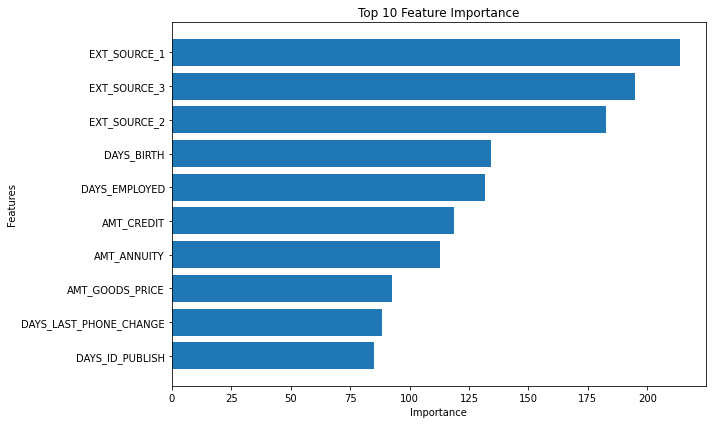

In [417]:
# 特征重要性的前十名相较于baseline同样没有发生变化
plot_feature_importances(feature_importance.sort_values(by='importance',ascending=False))

In [418]:
# CPU成绩0.75556
# 但是我们可以看到相较于baseline还是有些提升的
submission.to_csv('prev_GMAE.csv',index=False)

**注意**：如果没有安装lightgbm的GPU版本请不要运行下面的代码

In [419]:
valid_auc,feature_importance,submission = fit_gpu(train,test)

[1]	training's binary_logloss: 0.275796	valid_1's binary_logloss: 0.271556
[2]	training's binary_logloss: 0.27171	valid_1's binary_logloss: 0.267848
[3]	training's binary_logloss: 0.26844	valid_1's binary_logloss: 0.264849
[4]	training's binary_logloss: 0.265785	valid_1's binary_logloss: 0.262395
[5]	training's binary_logloss: 0.263531	valid_1's binary_logloss: 0.260419
[6]	training's binary_logloss: 0.261653	valid_1's binary_logloss: 0.258794
[7]	training's binary_logloss: 0.259954	valid_1's binary_logloss: 0.257333
[8]	training's binary_logloss: 0.258514	valid_1's binary_logloss: 0.256097
[9]	training's binary_logloss: 0.257229	valid_1's binary_logloss: 0.254952
[10]	training's binary_logloss: 0.256059	valid_1's binary_logloss: 0.253966
[11]	training's binary_logloss: 0.255062	valid_1's binary_logloss: 0.253168
[12]	training's binary_logloss: 0.254085	valid_1's binary_logloss: 0.252365
[13]	training's binary_logloss: 0.253164	valid_1's binary_logloss: 0.251613
[14]	training's binary_

In [420]:
# CPU成绩0.75588
submission.to_csv('pre_GPUGMAE.csv',index=False)

|lightgbm_baseline|0.74385|
|---|---|
|bureau_naiveGMAE|0.74767|
|bureau_GMAE|0.76348|
|bureau_GPUGMAE|0.76426|
|prev_GMAE|0.75556|
|prev_GPUGMAE|0.75588|

**附录：特征字段详解**

- SK_ID_CURR: 当前贷款申请的唯一编号，与application_train/test.csv中的相同
- SK_ID_PREV: 先前的贷款申请的唯一编号，这只是一个标识符，没有实际的含义。

- NAME_CONTRACT_TYPE: 先前贷款的类型（现金贷款cash loans，循环贷款revolving loans，消费贷款consumer loans等），和主表一样，这可能反映客户的借款习惯，但是请注意这里多了一个consumer loans，也就是消费者贷款。这是一种通常用于购买特定的消费品（如汽车、家电等）的贷款，这个新类别可能会给我们提供一些额外的信息。例如，如果一个客户在过去的贷款申请中有很多 Consumer loans，这可能表明他们有一些大的消费需求，或者他们可能更愿意使用贷款来购买消费品，承受的利率也和前二者不同。

- AMT_ANNUITY: 先前贷款的年金，反映了客户每年需要支付的金额，可能影响他们的还款能力。

- AMT_APPLICATION: 客户在先前申请中申请的贷款金额，这可能反映客户的借款需求和还款能力。

- AMT_CREDIT: 先前贷款的信贷金额，这可能反映了客户的借款历史和信用水平。

- AMT_DOWN_PAYMENT: 之前贷款申请的首付金额，若为空则代表没有首付。

- AMT_GOODS_PRICE: 之前贷款申请购买商品的价格。

- HOUR_APPR_PROCESS_START: 之前贷款申请的小时数。

- WEEKDAY_APPR_PROCESS_START：客户申请贷款的日期是星期几

- RATE_DOWN_PAYMENT：客户支付的首付款占总贷款金额的比例。

- RATE_INTEREST_PRIMARY：如果存在，这是客户获得贷款的原始利率。

- RATE_INTEREST_PRIVILEGED：如果存在，这是客户获得贷款的优惠利率。

- FLAG_LAST_APPL_PER_CONTRACT: 是否是同一个合同下最后一次申请（Y/N）。

- NFLAG_LAST_APPL_IN_DAY: 是否是同一天内最后一次申请（1/0）。

- NAME_CASH_LOAN_PURPOSE: 现金贷款的目的（XAP表示不适用，XNA表示不可用）。

- NAME_CONTRACT_STATUS: 之前贷款申请的状态（Approved, Canceled, Refused等）。

- DAYS_DECISION: 之前贷款申请距离当前申请日期的天数（负数表示过去）。

- NAME_PAYMENT_TYPE: 之前贷款申请的付款方式（Cash through the bank, Non-cash from your account等）。

- CODE_REJECT_REASON: 之前贷款申请被拒绝的原因代码（XAP表示不适用，XNA表示不可用，HC表示硬拒绝，LIMIT表示额度不足等）。

- NAME_TYPE_SUITE: 陪同客户到分行办理业务的人员类型（Family, Spouse等）。

- NAME_CLIENT_TYPE: 客户类型（Repeater, New等）。

- NAME_GOODS_CATEGORY: 购买商品的类别（XAP表示不适用，XNA表示不可用，Mobile等）。

- NAME_PORTFOLIO: 贷款产品组合（Cash, POS等）。

- NAME_PRODUCT_TYPE: 贷款产品类型（XNA表示不可用，x-sell表示交叉销售，walk-in表示自主进店等）。

- CHANNEL_TYPE: 贷款销售渠道（Country-wide, Regional等）。

- SELLERPLACE_AREA: 销售地点区域代码（-1表示不可用，其他为正整数）。

- NAME_SELLER_INDUSTRY: 销售商行业类型（XNA表示不可用，Connectivity等）。

- CNT_PAYMENT: 计划还款期数（正整数或空值）。

- NAME_YIELD_GROUP: 贷款的收益组，它是根据贷款的收益率将贷款分组而得到的。这个字段的取值包括：XNA：未知、middle：中等收益、high：高收益、low_normal：低收益，正常、low_action：低收益，行动

- PRODUCT_COMBINATION: 贷款产品组合名称（Cash X-Sell：low, POS household with interest等）。

- DAYS_FIRST_DRAWING: 客户首次提取资金距离当前申请日期的天数（365243表示无限期延迟，空值表示没有提取资金）。

- DAYS_FIRST_DUE: 客户首次到期日距离当前申请日期的天数（365243表示无限期延迟，空值表示没有提取资金）。

- DAYS_LAST_DUE_1ST_VERSION: 表示贷款最初的到期日距离当前申请的天数。这个字段反映了借款人最初应该在何时偿还贷款。（365243表示无限期延迟，空值表示没有提取资金）。

- DAYS_LAST_DUE: 表示贷款最终的到期日距离当前申请的天数。这个字段反映了借款人最终应该在何时偿还贷款。如果借款人未能按时偿还贷款，那么贷款的到期日可能会被延长，因此 DAYS_LAST_DUE 字段的值可能会与 DAYS_LAST_DUE_1ST_VERSION 字段的值不同。（365243表示无限期延迟，空值表示没有提取资金）。

- DAYS_TERMINATION: 客户终止合同距离当前申请日期的天数（365243表示无限期延迟，空值表示没有提取资金）。<br/>

<font color='red'><center>**注：根据比赛主办方的[解释](https://www.kaggle.com/c/home-credit-default-risk/discussion/57247),365243表示无穷值，可以视作空值**</center></font>

- NFLAG_INSURED_ON_APPROVAL: 客户是否在批准时获得保险（0/1/空值）。

### 2.3 现金、信用卡与分期付款记录表单

至此，我们只剩下POS_CASH_balance.csv、instalments_payments.csv和credit_card_balance.csv三个表格还未进行特征衍生。我们在part 1中对这些表格之间的关系进行了探讨：它们分别记录了借款人过去和现在的月度还款数据。由于贷款的金额和类型的不同，这些数据被分别存储在三个不同的表格中。虽然这些表格的特征相似，但它们的衍生方法可以分为三大类（和previous表相似），并将在这三个表格中重复应用。因此，我们决定在同一部分处理这三个表格。对于这三个表格，我们的衍生步骤可以大致分为三类：

1. 领域特征（Domain features）：基于我们对这个领域知识的理解，创建新的特征。
2. GAME策略：对现有特征进行统计度量，这可以提供有关数据分布的更多信息。
3. 进阶GAME策略：分层聚合分析。这包括对不同贷款时间段群体的行为模式进行分析，也就是按贷款时间进行聚合。这可以帮助我们理解在不同贷款时间段中，借款人的行为是否有显著的差异。

#### 2.3.1 POS_CASH_balance

> POS_CASH_balance.csv

- 贷款基本信息: 包括先前贷款的唯一编号(SK_ID_PREV)、当前贷款申请的唯一编号(SK_ID_CURR)、先前贷款的合同状态(NAME_CONTRACT_STATUS)。

- 分期付款信息: 包括先前贷款的分期付款的数量(CNT_INSTALMENT)、未来分期付款的数量(CNT_INSTALMENT_FUTURE)。

- 逾期还款信息: 包括逾期还款的天数(SK_DPD)，及宽限期的天数(SK_DPD_DEF)。

- 时间信息: 包括月份(MONTHS_BALANCE)，反映客户在先前贷款中的每月还款情况。

In [3]:
cash = pd.read_csv('./POS_CASH_balance.csv')
reduce_mem_usage(cash).head()

100%|██████████| 8/8 [00:01<00:00,  6.00it/s]

Mem. usage decreased to 238.45 Mb (60.9% reduction)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


"Amortized debt"这个词来自于“amortization”，在贷款领域，它通常指的是将贷款分期偿还的过程，每一期偿还的款项包括本金和利息的一部分，直到完全偿清贷款。这种方式确保了贷款金额在设定的时间内逐渐减少到零。

In [4]:
# 官方文档里的描述：Contract status during the month
# 每一种取值情况的详解放在最后面的附录中
# 不过全网也找不到有关于这个比赛Amortized debt字段的描述，不过这个词在英文中的本意是分期偿还
# 可是cash表中记录的本就是分期还款记录，为何还有分期偿还？
cash['NAME_CONTRACT_STATUS'].value_counts()

Active                   9151119
Completed                 744883
Signed                     87260
Demand                      7065
Returned to the store       5461
Approved                    4917
Amortized debt               636
Canceled                      15
XNA                            2
Name: NAME_CONTRACT_STATUS, dtype: int64

一个可能的猜想是：这些可能是因为某种原因在还款中途无法执行原定的还款计划，因此和公司制定了新的还款计划

In [5]:
# 为了验证我的想法，我查看了Amortized debt群体的违约情况，一定程度证实了我的猜想
cash[(cash['NAME_CONTRACT_STATUS'] == 'Amortized debt') & (cash['SK_DPD'] > 0)].shape

(592, 8)

遗憾的是，由于POS_CASH_balance字段的特征较少，我们没有办法挖掘大量针对这个群体的行为信息，不过这并不影响我们学习这样一条分析数据的思路：提出疑问-->查找资料-->提出假设-->验证猜想-->特征工程

相信这样分析数据的思维方式对小伙伴们工作和竞赛都一定会有帮助~

- domain features

1. 计算是否逾期

In [6]:
# 创建一个新列，对 'SK_DPD' 列中的每一个值进行判断
# 如果值大于0，那么我们就标记为 1（表示有逾期支付），否则标记为 0（表示没有逾期支付）
cash['CASH_IS_DPD'] = cash['SK_DPD'].apply(lambda x: 1 if x > 0 else 0)

2. 计算还款进度

In [7]:
# 我们将使用CNT_INSTALMENT还款期数
# 为了方便观察，我取出了同一个借款人的同一笔借贷的还款记录，并且按照时间排序
# 最上面的是最近的还款记录，最下面的是最早的还款记录
cash[(cash['SK_ID_CURR']==397406) & (cash['SK_ID_PREV']==2070514)][['SK_ID_CURR','SK_ID_PREV','MONTHS_BALANCE','CNT_INSTALMENT']].sort_values(by=['SK_ID_CURR','MONTHS_BALANCE'], ascending=False) 

,SK_ID_CURR,SK_ID_PREV,MONTHS_BALANCE,CNT_INSTALMENT
271485,397406,2070514,-4,11.0
4296696,397406,2070514,-5,24.0
1878156,397406,2070514,-6,24.0
3148403,397406,2070514,-7,24.0
528346,397406,2070514,-8,24.0
21572,397406,2070514,-9,24.0
4518145,397406,2070514,-10,24.0
328092,397406,2070514,-11,24.0
3639020,397406,2070514,-12,24.0
1793108,397406,2070514,-13,24.0


我们可以通过计算每一笔贷款最早和最近的差值和比值，以此来表示还款进度，具体代码操作如下：

In [8]:
# 使用groupby函数提取记录中每笔贷款 ('SK_ID_PREV') 的初始和最终还款期数
# 看不懂head和tail函数作用的小伙伴请看下面的代码示例
cash.sort_values(by=['SK_ID_CURR','MONTHS_BALANCE'], ascending=False, inplace=True) # 先按照时间顺序进行排列，以保证下面的操作是选取到最初和最终的还款期数
recent_cash = cash.groupby('SK_ID_PREV')[['SK_ID_CURR', 'SK_ID_PREV', 'CNT_INSTALMENT']].head(1) # 提取每个 'SK_ID_PREV' 对应的最近一笔现金还款期数
begin_cash = cash.groupby('SK_ID_PREV')[['SK_ID_CURR', 'SK_ID_PREV', 'CNT_INSTALMENT']].tail(1) # 提取每个 'SK_ID_PREV' 对应的最早一笔现金还款期数
recent_cash.rename(columns={'CNT_INSTALMENT': 'RECENT_CNT_INSTALMENT'}, inplace=True) # 更改列名
begin_cash.rename(columns={'CNT_INSTALMENT': 'BEGIN_CNT_INSTALMENT'}, inplace=True) # 更改列名
recent_cash = pd.merge(recent_cash[['SK_ID_PREV','RECENT_CNT_INSTALMENT']], begin_cash[['SK_ID_PREV','BEGIN_CNT_INSTALMENT']], on='SK_ID_PREV', how='left') # 合并衍生结果

# 计算还款进度
recent_cash['CNT_INSTALMENT_PAY'] = recent_cash['BEGIN_CNT_INSTALMENT'] - recent_cash['RECENT_CNT_INSTALMENT']
recent_cash['CNT_INSTALMENT_PAY_RATIO'] = recent_cash['BEGIN_CNT_INSTALMENT'] / recent_cash['RECENT_CNT_INSTALMENT']
cash = pd.merge(cash, recent_cash, on='SK_ID_PREV', how='left') # 合并衍生结果

还款期数代码示例

In [9]:
# 选择每个分组的第一行数据
cash.sort_values(by=['SK_ID_CURR','MONTHS_BALANCE'], ascending=False, inplace=True)
recent_cash = cash.groupby('SK_ID_PREV')[['SK_ID_CURR', 'SK_ID_PREV', 'CNT_INSTALMENT']].head(1)
# recent_cash表里是每一笔贷款的第一行数据
recent_cash.head()

,SK_ID_CURR,SK_ID_PREV,CNT_INSTALMENT
0,456255,2631384,24.0
6,456255,1179690,16.0
7,456255,1359084,8.0
26,456255,2729207,3.0
38,456255,2073384,3.0


In [10]:
# 可以看到对于2070514这笔贷款来说我们取到了最上面的一行
recent_cash[recent_cash['SK_ID_PREV'] == 2070514]

,SK_ID_CURR,SK_ID_PREV,CNT_INSTALMENT
1629962,397406,2070514,11.0


In [157]:
# 选择每个分组的最后一行数据
begin_cash = cash.groupby('SK_ID_PREV')[['SK_ID_CURR', 'SK_ID_PREV', 'CNT_INSTALMENT']].tail(1)
begin_cash[begin_cash['SK_ID_PREV'] == 2070514]

,SK_ID_CURR,SK_ID_PREV,CNT_INSTALMENT
1629985,397406,2070514,24.0


In [159]:
# 查看衍生结果
del recent_cash, begin_cash
gc.collect()
cash.iloc[:5,-3:]

,BEGIN_CNT_INSTALMENT,CNT_INSTALMENT_PAY,CNT_INSTALMENT_PAY_RATIO
0,36.0,12.0,1.5
1,36.0,12.0,1.5
2,36.0,12.0,1.5
3,36.0,12.0,1.5
4,36.0,12.0,1.5


- GAME策略计算现有特征的统计度量

In [426]:
# GAME策略的应用
# 指定每一个特征需要衍生的统计量
cash_agg = {
    'SK_ID_CURR':['count'], 
    'MONTHS_BALANCE':['min', 'mean', 'max'], 
    'SK_DPD':['min', 'max', 'mean', 'sum'],
    'CNT_INSTALMENT':['min', 'max', 'mean', 'sum'],
    'CNT_INSTALMENT_FUTURE':['min', 'max', 'mean', 'sum'],
    'CASH_IS_DPD':['mean', 'sum'],
    'CNT_INSTALMENT_PAY':['min', 'max', 'mean', 'sum'],
    'CNT_INSTALMENT_PAY_RATIO':['min', 'max', 'mean', 'sum']
}  
cash_agg_df = cash.groupby('SK_ID_CURR').agg(cash_agg)
cash_agg_df.columns = ['CASH_'+'_'.join(column) for column in cash_agg_df.columns]

- 进阶GAME策略：分层聚合分析（分析不同贷款时间段群体的行为模式——按贷款时间进行聚合）

In [427]:
# 可以根据业务需求自由调整月份时间

# 前6月行为聚合
cash_m6_agg_df = cash[cash['MONTHS_BALANCE'] > -6].groupby('SK_ID_CURR').agg(cash_agg)
cash_m6_agg_df.columns = [('CASH_M6')+('_').join(column) for column in cash_m6_agg_df.columns]
# 前12月行为聚合
cash_m12_agg_df = cash[cash['MONTHS_BALANCE'] > -12].groupby('SK_ID_CURR').agg(cash_agg)
cash_m12_agg_df.columns = [('CASH_M12')+('_').join(column) for column in cash_m12_agg_df.columns]
# 前24月行为聚合
cash_m24_agg_df = cash[cash['MONTHS_BALANCE'] > -24].groupby('SK_ID_CURR').agg(cash_agg)
cash_m24_agg_df.columns = [('CASH_M24')+('_').join(column) for column in cash_m24_agg_df.columns]
# 合并所有聚合结果
cash_agg_df = cash_agg_df.merge(cash_m6_agg_df, on='SK_ID_CURR', how='left')
cash_agg_df = cash_agg_df.merge(cash_m12_agg_df, on='SK_ID_CURR', how='left')
cash_agg_df = cash_agg_df.merge(cash_m24_agg_df, on='SK_ID_CURR', how='left')
cash_agg_df.reset_index(inplace=True)
cash_agg_df.head()

,SK_ID_CURR,CASH_SK_ID_CURR_count,CASH_MONTHS_BALANCE_min,CASH_MONTHS_BALANCE_mean,CASH_MONTHS_BALANCE_max,CASH_SK_DPD_min,CASH_SK_DPD_max,CASH_SK_DPD_mean,CASH_SK_DPD_sum,CASH_CNT_INSTALMENT_min,CASH_CNT_INSTALMENT_max,CASH_CNT_INSTALMENT_mean,CASH_CNT_INSTALMENT_sum,CASH_CNT_INSTALMENT_FUTURE_min,CASH_CNT_INSTALMENT_FUTURE_max,CASH_CNT_INSTALMENT_FUTURE_mean,CASH_CNT_INSTALMENT_FUTURE_sum,CASH_CASH_IS_DPD_mean,CASH_CASH_IS_DPD_sum,CASH_CNT_INSTALMENT_PAY_min,CASH_CNT_INSTALMENT_PAY_max,CASH_CNT_INSTALMENT_PAY_mean,CASH_CNT_INSTALMENT_PAY_sum,CASH_CNT_INSTALMENT_PAY_RATIO_min,CASH_CNT_INSTALMENT_PAY_RATIO_max,CASH_CNT_INSTALMENT_PAY_RATIO_mean,CASH_CNT_INSTALMENT_PAY_RATIO_sum,CASH_M6SK_ID_CURR_count,CASH_M6MONTHS_BALANCE_min,CASH_M6MONTHS_BALANCE_mean,CASH_M6MONTHS_BALANCE_max,CASH_M6SK_DPD_min,CASH_M6SK_DPD_max,CASH_M6SK_DPD_mean,CASH_M6SK_DPD_sum,CASH_M6CNT_INSTALMENT_min,CASH_M6CNT_INSTALMENT_max,CASH_M6CNT_INSTALMENT_mean,CASH_M6CNT_INSTALMENT_sum,CASH_M6CNT_INSTALMENT_FUTURE_min,CASH_M6CNT_INSTALMENT_FUTURE_max,CASH_M6CNT_INSTALMENT_FUTURE_mean,CASH_M6CNT_INSTALMENT_FUTURE_sum,CASH_M6CASH_IS_DPD_mean,CASH_M6CASH_IS_DPD_sum,CASH_M6CNT_INSTALMENT_PAY_min,CASH_M6CNT_INSTALMENT_PAY_max,CASH_M6CNT_INSTALMENT_PAY_mean,CASH_M6CNT_INSTALMENT_PAY_sum,CASH_M6CNT_INSTALMENT_PAY_RATIO_min,CASH_M6CNT_INSTALMENT_PAY_RATIO_max,CASH_M6CNT_INSTALMENT_PAY_RATIO_mean,CASH_M6CNT_INSTALMENT_PAY_RATIO_sum,CASH_M12SK_ID_CURR_count,CASH_M12MONTHS_BALANCE_min,CASH_M12MONTHS_BALANCE_mean,CASH_M12MONTHS_BALANCE_max,CASH_M12SK_DPD_min,CASH_M12SK_DPD_max,CASH_M12SK_DPD_mean,CASH_M12SK_DPD_sum,CASH_M12CNT_INSTALMENT_min,CASH_M12CNT_INSTALMENT_max,CASH_M12CNT_INSTALMENT_mean,CASH_M12CNT_INSTALMENT_sum,CASH_M12CNT_INSTALMENT_FUTURE_min,CASH_M12CNT_INSTALMENT_FUTURE_max,CASH_M12CNT_INSTALMENT_FUTURE_mean,CASH_M12CNT_INSTALMENT_FUTURE_sum,CASH_M12CASH_IS_DPD_mean,CASH_M12CASH_IS_DPD_sum,CASH_M12CNT_INSTALMENT_PAY_min,CASH_M12CNT_INSTALMENT_PAY_max,CASH_M12CNT_INSTALMENT_PAY_mean,CASH_M12CNT_INSTALMENT_PAY_sum,CASH_M12CNT_INSTALMENT_PAY_RATIO_min,CASH_M12CNT_INSTALMENT_PAY_RATIO_max,CASH_M12CNT_INSTALMENT_PAY_RATIO_mean,CASH_M12CNT_INSTALMENT_PAY_RATIO_sum,CASH_M24SK_ID_CURR_count,CASH_M24MONTHS_BALANCE_min,CASH_M24MONTHS_BALANCE_mean,CASH_M24MONTHS_BALANCE_max,CASH_M24SK_DPD_min,CASH_M24SK_DPD_max,CASH_M24SK_DPD_mean,CASH_M24SK_DPD_sum,CASH_M24CNT_INSTALMENT_min,CASH_M24CNT_INSTALMENT_max,CASH_M24CNT_INSTALMENT_mean,CASH_M24CNT_INSTALMENT_sum,CASH_M24CNT_INSTALMENT_FUTURE_min,CASH_M24CNT_INSTALMENT_FUTURE_max,CASH_M24CNT_INSTALMENT_FUTURE_mean,CASH_M24CNT_INSTALMENT_FUTURE_sum,CASH_M24CASH_IS_DPD_mean,CASH_M24CASH_IS_DPD_sum,CASH_M24CNT_INSTALMENT_PAY_min,CASH_M24CNT_INSTALMENT_PAY_max,CASH_M24CNT_INSTALMENT_PAY_mean,CASH_M24CNT_INSTALMENT_PAY_sum,CASH_M24CNT_INSTALMENT_PAY_RATIO_min,CASH_M24CNT_INSTALMENT_PAY_RATIO_max,CASH_M24CNT_INSTALMENT_PAY_RATIO_mean,CASH_M24CNT_INSTALMENT_PAY_RATIO_sum
0,100001,9,-96,-72.555556,-53,0,7,0.777778,7.0,4.0,4.0,4.000000,36.0,0.0,4.0,1.444336,13.0,0.111111,1,0.0,0.0,0.000000,0.0,1.000000,1.000000,1.000000,9.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100002,19,-19,-10.000000,-1,0,0,0.000000,0.0,24.0,24.0,24.000000,456.0,6.0,24.0,15.000000,285.0,0.000000,0,0.0,0.0,0.000000,0.0,1.000000,1.000000,1.000000,19.000000,5.0,-5.0,-3.0,-1.0,0.0,0.0,0.0,0.0,24.0,24.0,24.0,120.0,6.0,10.0,8.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,5.0,11.0,-11.0,-6.0,-1.0,0.0,0.0,0.0,0.0,24.0,24.0,24.0,264.0,6.0,16.0,11.0,121.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,11.0,19.0,-19.0,-10.0,-1.0,0.0,0.0,0.0,0.0,24.0,24.0,24.000000,456.0,6.0,24.0,15.000000,285.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.0,1.000000,1.000000,19.00000
2,100003,28,-77,-43.785714,-18,0,0,0.000000,0.0,6.0,12.0,10.

In [428]:
del cash, cash_m12_agg_df, cash_m24_agg_df,cash_m6_agg_df
gc.collect()

7629

#### 2.3.2 instalments_payments


> installments_payments.csv

- 贷款基本信息: 包括先前贷款的唯一编号(SK_ID_PREV)、当前贷款申请的唯一编号(SK_ID_CURR)。

- 还款计划信息: 包括还款计划的版本(NUM_INSTALMENT_VERSION)、还款期数(NUM_INSTALMENT_NUMBER)。

- 还款金额信息: 包括计划还款金额(AMT_INSTALMENT)、实际还款金额(AMT_PAYMENT)。

- 时间信息: 包括计划还款日期距离当前申请日期的天数(DAYS_INSTALMENT)、实际还款日期距离当前申请日期的天数(DAYS_ENTRY_PAYMENT)。

In [429]:
installment = pd.read_csv('./installments_payments.csv')
reduce_mem_usage(installment).head()

100%|██████████| 8/8 [00:01<00:00,  6.03it/s]

Mem. usage decreased to 311.40 Mb (62.5% reduction)


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.359863,6948.359863
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525024,1716.525024
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000000,25425.000000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130859,24350.130859
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040039,2160.584961


- domain features

基于业务理解创建一些能够反映借款人偿债能力和偿债行为的特征

In [430]:
# 和上面类似，顺着上面的思路创建一些和时间与金额相关的domain features
# 实际还款日与应还款日的差距。如果这个差值是正数，说明贷款人逾期还款；如果是负数，说明贷款人提前还款。
installment['DAYS_ENTRY_INSTALMENT_DIFF'] = installment['DAYS_ENTRY_PAYMENT'] - installment['DAYS_INSTALMENT']

# 应还款金额与实际还款金额之间的差异。如果这个差值是正数，说明贷款人少还了一部分款项；如果是负数，说明贷款人多还了一部分款项。
installment['AMT_INSTALMENT_PAYMENT_DIFF'] = installment['AMT_INSTALMENT'] - installment['AMT_PAYMENT']
# 还款金额与应还款金额之间的比例
installment['AMT_PAYMENT_INSTALMENT_RATIO'] =  (installment['AMT_PAYMENT'] + 1 ) / (installment['AMT_INSTALMENT'] + 1)

# 是否存在逾期还款（DAYS_ENTRY_INSTALMENT_DIFF > 0）
installment['INSTALL_IS_DPD'] = installment['DAYS_ENTRY_INSTALMENT_DIFF'].apply(lambda x: 1 if x > 0 else 0)

- GAME策略计算现有特征的统计度量

In [431]:
# GAME策略的应用
# 指定每一个特征需要衍生的统计量
install_agg = {
    'SK_ID_CURR':['count'],
    'DAYS_ENTRY_PAYMENT':['max', 'mean', 'sum'],
    'DAYS_INSTALMENT':['max', 'mean', 'sum'],
    'AMT_INSTALMENT':['max', 'mean', 'sum'],
    'AMT_PAYMENT':['max', 'mean', 'sum'],
    'NUM_INSTALMENT_VERSION':['nunique'],  # 计算同一个借款用户有几个版本的还款计划
    'DAYS_ENTRY_INSTALMENT_DIFF':['min', 'max', 'mean'],
    'AMT_INSTALMENT_PAYMENT_DIFF':['min', 'max', 'mean','sum'],
    'AMT_PAYMENT_INSTALMENT_RATIO':['max', 'mean'],
    'INSTALL_IS_DPD':['mean', 'sum'] 
    }
install_agg_df = installment.groupby('SK_ID_CURR').agg(install_agg)
install_agg_df.columns = ['INSTALL_'+('_').join(col) for col in install_agg_df.columns]

- 进阶GAME策略：分层聚合分析（分析不同贷款时间段群体的行为模式：按贷款时间进行聚合）

In [432]:
# 同样的按照时间进行分层聚合，可以根据业务需求自由调整时间

# 前1年行为聚合
install_y1_agg_df = installment[installment['DAYS_ENTRY_PAYMENT'] >= -365].groupby('SK_ID_CURR').agg(install_agg)
install_y1_agg_df.columns = ['INSTALL_Y1'+('_').join(col) for col in install_y1_agg_df.columns]
# 前半年行为聚合
install_hy_agg_df = installment[installment['DAYS_ENTRY_PAYMENT'] >= -180].groupby('SK_ID_CURR').agg(install_agg)
install_hy_agg_df.columns = ['INSTALL_HY'+('_').join(col) for col in install_hy_agg_df.columns]
# 前90天行为聚合
install_hy_agg_df2 = installment[installment['DAYS_ENTRY_PAYMENT'] >= -90].groupby('SK_ID_CURR').agg(install_agg)
install_hy_agg_df2.columns = ['INSTALL_HY90'+('_').join(col) for col in install_hy_agg_df2.columns]
# 拼接聚合结果
install_agg_df = install_agg_df.merge(install_y1_agg_df, on='SK_ID_CURR', how='left')
install_agg_df = install_agg_df.merge(install_hy_agg_df2, on='SK_ID_CURR', how='left')
install_agg_df = install_agg_df.merge(install_hy_agg_df, on='SK_ID_CURR', how='left')
install_agg_df.reset_index(inplace=True)
install_agg_df.head()

,SK_ID_CURR,INSTALL_SK_ID_CURR_count,INSTALL_DAYS_ENTRY_PAYMENT_max,INSTALL_DAYS_ENTRY_PAYMENT_mean,INSTALL_DAYS_ENTRY_PAYMENT_sum,INSTALL_DAYS_INSTALMENT_max,INSTALL_DAYS_INSTALMENT_mean,INSTALL_DAYS_INSTALMENT_sum,INSTALL_AMT_INSTALMENT_max,INSTALL_AMT_INSTALMENT_mean,INSTALL_AMT_INSTALMENT_sum,INSTALL_AMT_PAYMENT_max,INSTALL_AMT_PAYMENT_mean,INSTALL_AMT_PAYMENT_sum,INSTALL_NUM_INSTALMENT_VERSION_nunique,INSTALL_DAYS_ENTRY_INSTALMENT_DIFF_min,INSTALL_DAYS_ENTRY_INSTALMENT_DIFF_max,INSTALL_DAYS_ENTRY_INSTALMENT_DIFF_mean,INSTALL_AMT_INSTALMENT_PAYMENT_DIFF_min,INSTALL_AMT_INSTALMENT_PAYMENT_DIFF_max,INSTALL_AMT_INSTALMENT_PAYMENT_DIFF_mean,INSTALL_AMT_INSTALMENT_PAYMENT_DIFF_sum,INSTALL_AMT_PAYMENT_INSTALMENT_RATIO_max,INSTALL_AMT_PAYMENT_INSTALMENT_RATIO_mean,INSTALL_INSTALL_IS_DPD_mean,INSTALL_INSTALL_IS_DPD_sum,INSTALL_Y1SK_ID_CURR_count,INSTALL_Y1DAYS_ENTRY_PAYMENT_max,INSTALL_Y1DAYS_ENTRY_PAYMENT_mean,INSTALL_Y1DAYS_ENTRY_PAYMENT_sum,INSTALL_Y1DAYS_INSTALMENT_max,INSTALL_Y1DAYS_INSTALMENT_mean,INSTALL_Y1DAYS_INSTALMENT_sum,INSTALL_Y1AMT_INSTALMENT_max,INSTALL_Y1AMT_INSTALMENT_mean,INSTALL_Y1AMT_INSTALMENT_sum,INSTALL_Y1AMT_PAYMENT_max,INSTALL_Y1AMT_PAYMENT_mean,INSTALL_Y1AMT_PAYMENT_sum,INSTALL_Y1NUM_INSTALMENT_VERSION_nunique,INSTALL_Y1DAYS_ENTRY_INSTALMENT_DIFF_min,INSTALL_Y1DAYS_ENTRY_INSTALMENT_DIFF_max,INSTALL_Y1DAYS_ENTRY_INSTALMENT_DIFF_mean,INSTALL_Y1AMT_INSTALMENT_PAYMENT_DIFF_min,INSTALL_Y1AMT_INSTALMENT_PAYMENT_DIFF_max,INSTALL_Y1AMT_INSTALMENT_PAYMENT_DIFF_mean,INSTALL_Y1AMT_INSTALMENT_PAYMENT_DIFF_sum,INSTALL_Y1AMT_PAYMENT_INSTALMENT_RATIO_max,INSTALL_Y1AMT_PAYMENT_INSTALMENT_RATIO_mean,INSTALL_Y1INSTALL_IS_DPD_mean,INSTALL_Y1INSTALL_IS_DPD_sum,INSTALL_HY90SK_ID_CURR_count,INSTALL_HY90DAYS_ENTRY_PAYMENT_max,INSTALL_HY90DAYS_ENTRY_PAYMENT_mean,INSTALL_HY90DAYS_ENTRY_PAYMENT_sum,INSTALL_HY90DAYS_INSTALMENT_max,INSTALL_HY90DAYS_INSTALMENT_mean,INSTALL_HY90DAYS_INSTALMENT_sum,INSTALL_HY90AMT_INSTALMENT_max,INSTALL_HY90AMT_INSTALMENT_mean,INSTALL_HY90AMT_INSTALMENT_sum,INSTALL_HY90AMT_PAYMENT_max,INSTALL_HY90AMT_PAYMENT_mean,INSTALL_HY90AMT_PAYMENT_sum,INSTALL_HY90NUM_INSTALMENT_VERSION_nunique,INSTALL_HY90DAYS_ENTRY_INSTALMENT_DIFF_min,INSTALL_HY90DAYS_ENTRY_INSTALMENT_DIFF_max,INSTALL_HY90DAYS_ENTRY_INSTALMENT_DIFF_mean,INSTALL_HY90AMT_INSTALMENT_PAYMENT_DIFF_min,INSTALL_HY90AMT_INSTALMENT_PAYMENT_DIFF_max,INSTALL_HY90AMT_INSTALMENT_PAYMENT_DIFF_mean,INSTALL_HY90AMT_INSTALMENT_PAYMENT_DIFF_sum,INSTALL_HY90AMT_PAYMENT_INSTALMENT_RATIO_max,INSTALL_HY90AMT_PAYMENT_INSTALMENT_RATIO_mean,INSTALL_HY90INSTALL_IS_DPD_mean,INSTALL_HY90INSTALL_IS_DPD_sum,INSTALL_HYSK_ID_CURR_count,INSTALL_HYDAYS_ENTRY_PAYMENT_max,INSTALL_HYDAYS_ENTRY_PAYMENT_mean,INSTALL_HYDAYS_ENTRY_PAYMENT_sum,INSTALL_HYDAYS_INSTALMENT_max,INSTALL_HYDAYS_INSTALMENT_mean,INSTALL_HYDAYS_INSTALMENT_sum,INSTALL_HYAMT_INSTALMENT_max,INSTALL_HYAMT_INSTALMENT_mean,INSTALL_HYAMT_INSTALMENT_sum,INSTALL_HYAMT_PAYMENT_max,INSTALL_HYAMT_PAYMENT_mean,INSTALL_HYAMT_PAYMENT_sum,INSTALL_HYNUM_INSTALMENT_VERSION_nunique,INSTALL_HYDAYS_ENTRY_INSTALMENT_DIFF_min,INSTALL_HYDAYS_ENTRY_INSTALMENT_DIFF_max,INSTALL_HYDAYS_ENTRY_INSTALMENT_DIFF_mean,INSTALL_HYAMT_INSTALMENT_PAYMENT_DIFF_min,INSTALL_HYAMT_INSTALMENT_PAYMENT_DIFF_max,INSTALL_HYAMT_INSTALMENT_PAYMENT_DIFF_mean,INSTALL_HYAMT_INSTALMENT_PAYMENT_DIFF_sum,INSTALL_HYAMT_PAYMENT_INSTALMENT_RATIO_max,INSTALL_HYAMT_PAYMENT_INSTALMENT_RATIO_mean,INSTALL_HYINSTALL_IS_DPD_mean,INSTALL_HYINSTALL_IS_DPD_sum
0,100001,7,-1628.0,-2196.0,-15368.0,-1619.0,-2188.0,-15312.0,17397.900391,5885.132324,4.119593e+04,17397.900391,5885.132324,4.119593e+04,2,-36.0,10.0,-7.429688,0.0,0.0,0.0,0.0,1.0,1.0,0.142857,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100002,19,-49.0,-315.5,-5992.0,

In [433]:
del installment, install_y1_agg_df, install_hy_agg_df,install_hy_agg_df2
gc.collect()

21

#### 2.3.3 credit_card_balance


> credit_card_balance.csv

- 贷款基本信息: 包括先前贷款的唯一编号(SK_ID_PREV)、当前贷款申请的唯一编号(SK_ID_CURR)、信用卡合同状态(NAME_CONTRACT_STATUS)。

- 信用卡使用信息: 包括信用卡余额(AMT_BALANCE)、信用卡限额(AMT_CREDIT_LIMIT_ACTUAL)、当月从ATM提取的金额(AMT_DRAWINGS_ATM_CURRENT)、当月提取的总金额(AMT_DRAWINGS_CURRENT)、当月从其他渠道提取的金额(AMT_DRAWINGS_OTHER_CURRENT)、当月从销售点提取的金额(AMT_DRAWINGS_POS_CURRENT)、最低分期付款金额(AMT_INST_MIN_REGULARITY)、当月还款金额(AMT_PAYMENT_CURRENT)、当月还款总额(AMT_PAYMENT_TOTAL_CURRENT)、应收本金(AMT_RECEIVABLE_PRINCIPAL)、应收总额(AMT_RECIVABLE)、应收总额(AMT_TOTAL_RECEIVABLE)。

- 提取次数信息: 包括当月从ATM提取的次数(CNT_DRAWINGS_ATM_CURRENT)、当月提取的总次数(CNT_DRAWINGS_CURRENT)、当月从其他渠道提取的次数(CNT_DRAWINGS_OTHER_CURRENT)、当月从销售点提取的次数(CNT_DRAWINGS_POS_CURRENT)、已到期的分期付款次数(CNT_INSTALMENT_MATURE_CUM)。

- 逾期还款信息: 包括逾期还款的天数(SK_DPD)，及宽限期的天数(SK_DPD_DEF)。

- 时间信息: 包括客户在申请日期前多少个月有信用卡数据(MONTHS_BALANCE)，反映客户信用卡的使用情况。

In [434]:
credit_card = pd.read_csv('./credit_card_balance.csv')
reduce_mem_usage(credit_card).head()

100%|██████████| 23/23 [00:01<00:00, 12.19it/s]

Mem. usage decreased to 289.33 Mb (57.1% reduction)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970001,135000,0.0,877.5,0.0,877.5,1700.324951,1800.0,1800.0,0.000000,0.000000,0.000000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.554688,45000,2250.0,2250.0,0.0,0.0,2250.000000,2250.0,2250.0,60175.078125,64875.554688,64875.554688,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.224609,450000,0.0,0.0,0.0,0.0,2250.000000,2250.0,2250.0,26926.425781,31460.085938,31460.085938,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.109375,225000,2250.0,2250.0,0.0,0.0,11795.759766,11925.0,11925.0,224949.281250,233048.968750,233048.968750,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.468750,450000,0.0,11547.0,0.0,11547.0,22924.890625,27000.0,27000.0,443044.406250,453919.468750,453919.468750,0.0,1,0.0,1.0,101.0,Active,0,0


- domain features

创建一些有关信用卡使用行为的领域特征

In [435]:
# 1.是否存在逾期付款（SK_DPD > 0）
credit_card['CARD_IS_DPD'] = credit_card['SK_DPD'].apply(lambda x: 1 if x > 0 else 0)

# 2.反映出贷款人使用信用卡的习惯的特征
#   余额与信用额度之间的比例，比例一直很高就说明贷款人经常使用到信用卡的极限额度
credit_card['AMT_BALANCE_CREDIT_LIMIT_RATIO'] = credit_card['AMT_BALANCE'] / credit_card['AMT_CREDIT_LIMIT_ACTUAL'] # 信用卡余额/信用卡限额
#   取现金额与信用额度之间的比例，比例一直很高，可能意味着贷款人经常需要借钱来支付日常开销，可能存在较高的信贷风险
credit_card['AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO'] = credit_card['AMT_DRAWINGS_CURRENT'] / credit_card['AMT_CREDIT_LIMIT_ACTUAL'] # 提取总金额/信用卡限额

- GAME策略计算现有特征的统计度量

In [436]:
# GAME策略的应用
# 指定每一个特征需要衍生的统计量
card_agg = {
    'SK_ID_CURR':['count'],
    'AMT_BALANCE':['max'],
    'AMT_CREDIT_LIMIT_ACTUAL':['max'],
    'AMT_DRAWINGS_ATM_CURRENT': ['max', 'sum'],
    'AMT_DRAWINGS_CURRENT': ['max', 'sum'],
    'AMT_DRAWINGS_POS_CURRENT': ['max', 'sum'],
    'AMT_INST_MIN_REGULARITY': ['max', 'mean'],
    'AMT_PAYMENT_TOTAL_CURRENT': ['max','sum'],
    'AMT_TOTAL_RECEIVABLE': ['max', 'mean'],
    'CNT_DRAWINGS_ATM_CURRENT': ['max','sum'],
    'CNT_DRAWINGS_CURRENT': ['max', 'mean', 'sum'],
    'CNT_DRAWINGS_POS_CURRENT': ['mean'],
    'SK_DPD': ['mean', 'max', 'sum'],
    'AMT_BALANCE_CREDIT_LIMIT_RATIO':['min','max'],
    'AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO':['min', 'max'],
    'CARD_IS_DPD':['mean', 'sum'],
    }

card_agg_df = credit_card.groupby('SK_ID_CURR').agg(card_agg)
card_agg_df.columns = ['CARD_'+('_').join(col) for col in card_agg_df.columns]

- 进阶GAME策略：分层聚合分析（分析不同贷款时间段群体的行为模式：按贷款时间进行聚合）

In [437]:
# 同样的按照时间进行分层聚合，可以根据业务需求自由调整时间

# 前3月行为聚合
card_m3_agg_df = credit_card[credit_card['MONTHS_BALANCE'] > -3].groupby('SK_ID_CURR').agg(card_agg)
card_m3_agg_df.columns = [('CARD_M12')+('_').join(column) for column in card_m3_agg_df.columns]
# 前6月行为聚合
card_m6_agg_df = credit_card[credit_card['MONTHS_BALANCE'] > -6].groupby('SK_ID_CURR').agg(card_agg)
card_m6_agg_df.columns = [('CARD_M12')+('_').join(column) for column in card_m6_agg_df.columns]
# 前12月行为聚合
card_m12_agg_df = credit_card[credit_card['MONTHS_BALANCE'] > -12].groupby('SK_ID_CURR').agg(card_agg)
card_m12_agg_df.columns = [('CARD_M12')+('_').join(column) for column in card_m12_agg_df.columns]
# 前24月行为聚合
card_m24_agg_df = credit_card[credit_card['MONTHS_BALANCE'] > -24].groupby('SK_ID_CURR').agg(card_agg)
card_m24_agg_df.columns = [('CARD_M24')+('_').join(column) for column in card_m24_agg_df.columns]
# 合并聚合结果
card_agg_df = card_agg_df.merge(card_m3_agg_df, on='SK_ID_CURR', how='left')
card_agg_df = card_agg_df.merge(card_m6_agg_df, on='SK_ID_CURR', how='left')
card_agg_df = card_agg_df.merge(card_m12_agg_df, on='SK_ID_CURR', how='left')
card_agg_df = card_agg_df.merge(card_m24_agg_df, on='SK_ID_CURR', how='left')
card_agg_df.reset_index(inplace=True)
card_agg_df.head()

,SK_ID_CURR,CARD_SK_ID_CURR_count,CARD_AMT_BALANCE_max,CARD_AMT_CREDIT_LIMIT_ACTUAL_max,CARD_AMT_DRAWINGS_ATM_CURRENT_max,CARD_AMT_DRAWINGS_ATM_CURRENT_sum,CARD_AMT_DRAWINGS_CURRENT_max,CARD_AMT_DRAWINGS_CURRENT_sum,CARD_AMT_DRAWINGS_POS_CURRENT_max,CARD_AMT_DRAWINGS_POS_CURRENT_sum,CARD_AMT_INST_MIN_REGULARITY_max,CARD_AMT_INST_MIN_REGULARITY_mean,CARD_AMT_PAYMENT_TOTAL_CURRENT_max,CARD_AMT_PAYMENT_TOTAL_CURRENT_sum,CARD_AMT_TOTAL_RECEIVABLE_max,CARD_AMT_TOTAL_RECEIVABLE_mean,CARD_CNT_DRAWINGS_ATM_CURRENT_max,CARD_CNT_DRAWINGS_ATM_CURRENT_sum,CARD_CNT_DRAWINGS_CURRENT_max,CARD_CNT_DRAWINGS_CURRENT_mean,CARD_CNT_DRAWINGS_CURRENT_sum,CARD_CNT_DRAWINGS_POS_CURRENT_mean,CARD_SK_DPD_mean,CARD_SK_DPD_max,CARD_SK_DPD_sum,CARD_AMT_BALANCE_CREDIT_LIMIT_RATIO_min,CARD_AMT_BALANCE_CREDIT_LIMIT_RATIO_max,CARD_AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO_min,CARD_AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO_max,CARD_CARD_IS_DPD_mean,CARD_CARD_IS_DPD_sum,CARD_M12SK_ID_CURR_count_x,CARD_M12AMT_BALANCE_max_x,CARD_M12AMT_CREDIT_LIMIT_ACTUAL_max_x,CARD_M12AMT_DRAWINGS_ATM_CURRENT_max_x,CARD_M12AMT_DRAWINGS_ATM_CURRENT_sum_x,CARD_M12AMT_DRAWINGS_CURRENT_max_x,CARD_M12AMT_DRAWINGS_CURRENT_sum_x,CARD_M12AMT_DRAWINGS_POS_CURRENT_max_x,CARD_M12AMT_DRAWINGS_POS_CURRENT_sum_x,CARD_M12AMT_INST_MIN_REGULARITY_max_x,CARD_M12AMT_INST_MIN_REGULARITY_mean_x,CARD_M12AMT_PAYMENT_TOTAL_CURRENT_max_x,CARD_M12AMT_PAYMENT_TOTAL_CURRENT_sum_x,CARD_M12AMT_TOTAL_RECEIVABLE_max_x,CARD_M12AMT_TOTAL_RECEIVABLE_mean_x,CARD_M12CNT_DRAWINGS_ATM_CURRENT_max_x,CARD_M12CNT_DRAWINGS_ATM_CURRENT_sum_x,CARD_M12CNT_DRAWINGS_CURRENT_max_x,CARD_M12CNT_DRAWINGS_CURRENT_mean_x,CARD_M12CNT_DRAWINGS_CURRENT_sum_x,CARD_M12CNT_DRAWINGS_POS_CURRENT_mean_x,CARD_M12SK_DPD_mean_x,CARD_M12SK_DPD_max_x,CARD_M12SK_DPD_sum_x,CARD_M12AMT_BALANCE_CREDIT_LIMIT_RATIO_min_x,CARD_M12AMT_BALANCE_CREDIT_LIMIT_RATIO_max_x,CARD_M12AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO_min_x,CARD_M12AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO_max_x,CARD_M12CARD_IS_DPD_mean_x,CARD_M12CARD_IS_DPD_sum_x,CARD_M12SK_ID_CURR_count_y,CARD_M12AMT_BALANCE_max_y,CARD_M12AMT_CREDIT_LIMIT_ACTUAL_max_y,CARD_M12AMT_DRAWINGS_ATM_CURRENT_max_y,CARD_M12AMT_DRAWINGS_ATM_CURRENT_sum_y,CARD_M12AMT_DRAWINGS_CURRENT_max_y,CARD_M12AMT_DRAWINGS_CURRENT_sum_y,CARD_M12AMT_DRAWINGS_POS_CURRENT_max_y,CARD_M12AMT_DRAWINGS_POS_CURRENT_sum_y,CARD_M12AMT_INST_MIN_REGULARITY_max_y,CARD_M12AMT_INST_MIN_REGULARITY_mean_y,CARD_M12AMT_PAYMENT_TOTAL_CURRENT_max_y,CARD_M12AMT_PAYMENT_TOTAL_CURRENT_sum_y,CARD_M12AMT_TOTAL_RECEIVABLE_max_y,CARD_M12AMT_TOTAL_RECEIVABLE_mean_y,CARD_M12CNT_DRAWINGS_ATM_CURRENT_max_y,CARD_M12CNT_DRAWINGS_ATM_CURRENT_sum_y,CARD_M12CNT_DRAWINGS_CURRENT_max_y,CARD_M12CNT_DRAWINGS_CURRENT_mean_y,CARD_M12CNT_DRAWINGS_CURRENT_sum_y,CARD_M12CNT_DRAWINGS_POS_CURRENT_mean_y,CARD_M12SK_DPD_mean_y,CARD_M12SK_DPD_max_y,CARD_M12SK_DPD_sum_y,CARD_M12AMT_BALANCE_CREDIT_LIMIT_RATIO_min_y,CARD_M12AMT_BALANCE_CREDIT_LIMIT_RATIO_max_y,CARD_M12AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO_min_y,CARD_M12AMT_DRAWINGS_CURRENT_CREDIT_LIMIT_RATIO_max_y,CARD_M12CARD_IS_DPD_mean_y,CARD_M12CARD_IS_DPD_sum_y,CARD_M12SK_ID_CURR_count,CARD_M12AMT_BALANCE_max,CARD_M12AMT_CREDIT_LIMIT_ACTUAL_max,CARD_M12AMT_DRAWINGS_ATM_CURRENT_max,CARD_M12AMT_DRAWINGS_ATM_CURRENT_sum,CARD_M12AMT_DRAWINGS_CURRENT_max,CARD_M12AMT_DRAWINGS_CURRENT_sum,CARD_M12AMT_DRAWINGS_POS_CURRENT_max,CARD_M12AMT_DRAWINGS_POS_CURRENT_sum,CARD_M12AMT_INST_MIN_REGULARITY_max,CARD_M12AMT_INST_MIN_REGULARITY_mean,CARD_M12AMT_PAYMENT_TOTAL_CURRENT_max,CARD_M12AMT_PAYMENT_TOTAL_CURRENT_sum,CARD_M12AMT_TOTAL_RECEIVABLE_max,CARD_M12AMT_TOTAL_RECEIVABLE_mean,CARD_M12CNT_DRAWINGS_ATM_CURRENT_max,CARD_M12CNT_DRAWINGS_ATM_CURRENT_sum,CARD_M12CNT_DRAWINGS_CURRENT_max,CARD_M12CNT_DRAWINGS_CURRENT_mean,CARD_M12CNT_DRAWINGS_CURRENT_sum,CARD_M12CNT_DRAWINGS_POS_CURRENT_mean,CARD_M12SK_DPD_mean,CARD_M12SK_DPD_max,CARD_M12SK_DPD_sum,CARD_M12AMT_BALANCE_CREDIT_LIMIT_RATIO_min,CARD_M12AMT_BALANCE_CREDIT_LIMIT_RATIO_max,CARD_M12AMT_DRA

In [438]:
del credit_card, card_m6_agg_df, card_m12_agg_df, card_m24_agg_df,card_m3_agg_df
gc.collect()

21

**2.3.2 附录：现金与还款记录表单字段详解**

这三张表都包含了客户在Home Credit的每月销售点或现金贷款/还款/信用卡数据，每一行代表客户在申请日期前一个月内的一个月份，每条贷款记录/还款/信用卡可以有多个月份。字段详解如下：

**POS_CASH_balance.csv**

- SK_ID_PREV: 先前的贷款申请的唯一编号，这只是一个标识符，没有实际的含义。

- SK_ID_CURR: 当前贷款申请的唯一编号，与application_train/test.csv中的相同。

- MONTHS_BALANCE: 月份平衡，反映了客户在先前贷款中的每月还款情况，可能反映他们的还款行为和信用水平。

- CNT_INSTALMENT: 先前贷款的分期付款的数量，这可能反映了客户的借款习惯和还款能力。

- CNT_INSTALMENT_FUTURE: 先前贷款的未来分期付款的数量，这可能反映了客户的未来还款计划和信用需求。

- NAME_CONTRACT_STATUS: 示分期付款合同的状态。它是一个类别型变量，可以取以下几个值之一：Active、Amortized debt、Approved、Canceled、Completed、Demand、Returned to the store、Signed 或 XNA。这些值分别表示分期付款合同处于不同的状态：

&emsp;&emsp;&emsp;Active：表示借款人当前正在还款期，贷款合同正在进行中。<br>
&emsp;&emsp;&emsp;Completed：表示借款人已经偿还了全部贷款，贷款合同已经结束。<br>
&emsp;&emsp;&emsp;Signed：表示贷款合同已经签订，但贷款尚未发放。<br>
&emsp;&emsp;&emsp;Demand：表示贷款机构要求借款人立即偿还剩余的贷款。<br>
&emsp;&emsp;&emsp;Returned to the store：表示贷款合同被终止，可能是因为借款人不能按时还款，或者因为其他原因。<br>
&emsp;&emsp;&emsp;Approved：表示贷款申请已经被批准，但贷款尚未发放。

- SK_DPD和SK_DPD_DEF都表示客户在每个月的逾期天数。但是，SK_DPD_DEF是指逾期天数的“容忍”部分，也就是说，银行不会对客户采取任何行动的部分。SK_DPD是指逾期天数的总和，包括容忍部分和非容忍部分。例如，如果一个客户在某个月逾期了10天，其中5天是容忍的，那么SK_DPD_DEF就是5，SK_DPD就是10。

**installments_payments.csv**

- NUM_INSTALMENT_VERSION: 还款计划的版本（正整数）。

- NUM_INSTALMENT_NUMBER: 还款期数（正整数）。

- DAYS_INSTALMENT: 计划还款日期距离当前申请日期的天数（负数表示过去）。

- DAYS_ENTRY_PAYMENT: 实际还款日期距离当前申请日期的天数（负数表示过去）。

- AMT_INSTALMENT: 计划还款金额。

- AMT_PAYMENT: 实际还款金额。

**credit_card_balance.csv**

- MONTHS_BALANCE: 客户在申请日期前多少个月有信用卡数据（负数表示过去）。

- AMT_BALANCE: 信用卡余额。

- AMT_CREDIT_LIMIT_ACTUAL: 信用卡限额。

- AMT_DRAWINGS_ATM_CURRENT: 当月从ATM提取的金额。

- AMT_DRAWINGS_CURRENT: 当月提取的总金额。

- AMT_DRAWINGS_OTHER_CURRENT: 当月从其他渠道提取的金额。

- AMT_DRAWINGS_POS_CURRENT: 当月从销售点提取的金额。

- AMT_INST_MIN_REGULARITY: 最低分期付款金额。

- AMT_PAYMENT_CURRENT: 当月还款金额。

- AMT_PAYMENT_TOTAL_CURRENT: 当月还款总额。

- AMT_RECEIVABLE_PRINCIPAL: 应收本金。

- AMT_RECIVABLE: 应收总额。

- AMT_TOTAL_RECEIVABLE: 应收总额（与上面相同）。

- CNT_DRAWINGS_ATM_CURRENT: 当月从ATM提取的次数。

- CNT_DRAWINGS_CURRENT: 当月提取的总次数。

- CNT_DRAWINGS_OTHER_CURRENT: 当月从其他渠道提取的次数。

- CNT_DRAWINGS_POS_CURRENT: 当月从销售点提取的次数。

- CNT_INSTALMENT_MATURE_CUM: 已到期的分期付款次数。

- NAME_CONTRACT_STATUS: 信用卡合同状态（Active, Completed, Demand等）。

- SK_DPD: 客户逾期还款的天数（正整数或0）。

- SK_DPD_DEF: 客户逾期还款的天数，考虑了宽限期（正整数或0）。

### 2.4 汇总衍生结果以及附表衍生技巧总结

- **汇总附表所有衍生结果**

到现在我们就已经完成了附表的所有手工特征衍生，接下来把附表的所有衍生结果拼到进行了衍生的主表apply当中去，以方便后面建模

In [439]:
# 为了防止爆内存，每次拼接之前都先压缩数据类型，并且每次拼接完之后都及时删掉之前完成拼接的变量
reduce_mem_usage(bureau_agg_df)
apply = apply.merge(bureau_agg_df, on='SK_ID_CURR', how='left')

del bureau_agg_df,train,test
gc.collect()
apply = apply.merge(prev_agg_df, on='SK_ID_CURR', how='left')

del prev_agg_df,prev_apply
gc.collect()
reduce_mem_usage(cash_agg_df)
apply = apply.merge(cash_agg_df, on='SK_ID_CURR', how='left')

del cash_agg_df
gc.collect()
reduce_mem_usage(install_agg_df)
apply = apply.merge(install_agg_df, on='SK_ID_CURR', how='left')

del install_agg_df
gc.collect()
reduce_mem_usage(card_agg_df)
apply = apply.merge(card_agg_df, on='SK_ID_CURR', how='left')

del card_agg_df
gc.collect()
del bureau_12M_agg_df,bureau_6M_agg_df,bureau_agg,bureau_balance_agg,bureau_balance_agg_df,bureau_car_agg_df,card_agg,cash_agg,col,prev_agg,prev_status_group,prev_status_group_agg
gc.collect()

  2%|▏         | 17/804 [00:00<00:05, 154.96it/s]

100%|██████████| 804/804 [00:06<00:00, 130.38it/s]


Mem. usage decreased to 627.91 Mb (0.0% reduction)


100%|██████████| 105/105 [00:00<00:00, 153.77it/s]


Mem. usage decreased to 68.83 Mb (50.2% reduction)


100%|██████████| 101/101 [00:00<00:00, 160.54it/s]


Mem. usage decreased to 102.01 Mb (21.2% reduction)


100%|██████████| 151/151 [00:00<00:00, 683.02it/s]


Mem. usage decreased to 54.61 Mb (32.1% reduction)


0

- **总结**

至此，我们已经完成了所有六张附表的特征衍生工作。在整个过程中，我们主要依赖于领域特征和GAME策略的应用。以下是关于这两个关键策略的更详细的解释：

1. 领域特征：根据我们对业务的深入理解，我们通过基本的数学运算（如加、减、乘、除）创建了一些有助于提升模型性能的特征。这些特征包括但不限于贷款利率的计算、涉及金额（如AMT_XXXX）和日期（如DAYS_XXXX）之间的差值和比率，以及对贷款是否逾期的标记（如XXXX_OVERDUE、XXX_DPD字段）的转换。

2. GAME策略的应用：我们计算了一些基本的统计度量（count/min/max/mean）并创建了cat_groupby_extension函数来进行相对性行为分析，以揭示特定类型用户的行为模式和偏好。我们还进行了分层聚合分析，通过这种方法我们可以精确地识别特定类型的用户群体并进行统计衍生，从而帮助模型理解这些特定用户群体的行为模式和偏好。

**思考**：
特征工程并没有唯一正确的答案。以上仅是我们基于现有数据集和理论进行的一次尝试，并且我们在这个尝试中取得了很好的效果。但这并不意味着这就是唯一的方法，你还可以基于这个框架和理论进行其他特征的衍生尝试。特征工程是一个充满创新和想象的过程，欢迎在群里你分享你的尝试和发现。

- **转换类别变量**

In [440]:
apply.dtypes[apply.dtypes == 'object']

NAME_CONTRACT_TYPE     object
CODE_GENDER            object
FLAG_OWN_CAR           object
FLAG_OWN_REALTY        object
NAME_TYPE_SUITE        object
                        ...  
ORGANIZATION_TYPE      object
FONDKAPREMONT_MODE     object
HOUSETYPE_MODE         object
WALLSMATERIAL_MODE     object
EMERGENCYSTATE_MODE    object
Length: 16, dtype: object

In [441]:
apply.shape

(356249, 1420)

In [442]:
# encoder
object_col = apply.dtypes[apply.dtypes == 'object'].index.to_list()
for col in object_col:
    if len(apply[col].unique()) > 2:
        apply = pd.concat([apply, pd.get_dummies(apply[col], prefix=col)], axis=1)
        apply.drop(columns=[col], inplace=True)
    else:
        apply[col] = pd.factorize(apply[col])[0]
apply.head()

SK_ID_CURR  TARGET  NAME_CONTRACT_TYPE  CODE_GENDER  FLAG_OWN_CAR  \
0      100002     1.0                   0            0             0   
1      100003     0.0                   0            1             0   
2      100004     0.0                   1            0             1   
3      100006     0.0                   0            1             0   
4      100007     0.0                   0            0             0   

   FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                0             0          202500.0    406597.5      24700.5   
1                1             0          270000.0   1293502.5      35698.5   
2                0             0           67500.0    135000.0       6750.0   
3                0             0          135000.0    312682.5      29686.5   
4                0             0          121500.0    513000.0      21865.5   

   AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  \
0         351000.0                    0.018801       -9461         -637.0   
1        1129500.0                    0.003541      -16765        -1188.0   
2         135000.0                    0.010032      -19046         -225.0   
3         297000.0                    0.008019      -19005        -3039.0   
4         513000.0                    0.028663      -19932        -3038.0   

   DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  FLAG_MOBIL  \
0            -3648.0            -2120          0.0           1   
1            -1186.0             -291          0.0           1   
2            -4260.0            -2531         26.0           1   
3            -9833.0            -2437          0.0           1   
4            -4311.0            -3458          0.0           1   

   FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  FLAG_PHONE  FLAG_EMAIL  \
0               1                0                 1           1           0   
1               1                0                 1           1           0   
2               1                1                 1           1           0   
3               1                0                 1           0           0   
4               1                0                 1           0           0   

   CNT_FAM_MEMBERS  REGION_RATING_CLIENT  REGION_RATING_CLIENT_W_CITY  \
0              1.0                     2                            2   
1              2.0                     1                            1   
2              1.0                     2                            2   
3              2.0                     2                            2   
4              1.0                     2                            2   

   HOUR_APPR_PROCESS_START  REG_REGION_NOT_LIVE_REGION  \
0                       10                           0   
1                       11                           0   
2                        9                           0   
3                       17                           0   
4                       11                           0   

   REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION  \
0                           0                            0   
1                           0                            0   
2                           0                            0   
3                           0                            0   
4                           0                            0   

   REG_CITY_NOT_LIVE_CITY  REG_CITY_NOT_WORK_CITY  LIVE_CITY_NOT_WORK_CITY  \
0                       0                       0                        0   
1                       0                       0                        0   
2                       0                       0                        0   
3                       0                       0                        0   
4                       0                       1                        1   

   EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3  APARTMENTS_AVG  BASEMENTAREA_AVG  \
0      0.083037      0.262949      0.139376

## 3 自动化特征衍生

在进行进一步的衍生之前，我们先把之前衍生出来的这些特征进行初步筛选，去除90%以上都是缺失值的列

In [443]:
# 删除缺失过多的列
cols = apply.iloc[:, 2:].columns[(apply.iloc[:, 2:].isnull().sum() > apply.shape[0] * 0.9)]
apply.drop(cols, axis=1, inplace=True)

### 3.1 进阶特征衍生：自动化分组与统计

为了进一步增强模型的泛化能力，我利用之前在附表中定义的cat_groupby_extension函数，进行了更多的特征衍生尝试。这部分主要是为了提高模型性能而进行的，所衍生出来的特征可能难以从业务角度解读其含义，因此我将这部分归类为自动化特征衍生部分。

在这个过程中，我选择的key_col主要是那些对标签分类具有较大区分度的特征，其中一些是在主表的Leaking-proof式目标编码过程中发现的，另一些是Leaking-proof式目标编码的结果。至于cols，我主要选取了在baseline中对特征重要性较高的特征，或者从业务角度推测，对这些特征进行衍生可能会增强模型的泛化性能。

<font color='red'>！！！运行时长警告：40 Min左右

In [444]:
# XXXX_manual都是手动目标编码的特征名字
apply = cat_groupby_extension(df=apply,
                    key_col='NAME_EDUCATION_TYPE_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

# 从业务的角度判断，贷款类型是非常重要的特征，所以我尝试计算不同贷款类型cols的相对情况
apply = cat_groupby_extension(df=apply,
                    key_col='NAME_CONTRACT_TYPE',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

# 和上面类似，进行如下的尝试
apply = cat_groupby_extension(df=apply,
                    key_col='NAME_HOUSING_TYPE_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])               

apply = cat_groupby_extension(df=apply,
                    key_col='NAME_INCOME_TYPE_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='CODE_GENDER',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='FLAG_MOBIL',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='HOUR_APPR_PROCESS_START_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='ORGANIZATION_TYPE_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='OWN_CAR_AGE_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='OCCUPATION_TYPE_manual',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='REGION_RATING_CLIENT',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='REGION_RATING_CLIENT_W_CITY',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

apply = cat_groupby_extension(df=apply,
                    key_col='REG_CITY_NOT_LIVE_CITY',
                    cols = ['EXT_SOURCE_MEAN','EXT_SOURCE_2','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_3','BUREAU_ACT_IS_CREDIT_DAY_OVERDUE_RATIO','AMT_ANNUITY_CREDIT_RATIO','DAYS_ID_PUBLISH','INSTALL_AMT_PAYMENT_sum','INSTALL_INSTALL_IS_DPD_mean','PREV_REFUSED_RATIO'], 
                    agg_list=['sum','mean','min', 'median'], 
                    agg_name=['sum','mean','min', 'median'])

In [ ]:
# 完成所有的衍生之后，一共产生了1719列特征（包含标签和ID）
apply.shape

(356249, 1719)

In [446]:
# 删除缺失过多的列
cols = apply.iloc[:, 2:].columns[(apply.iloc[:, 2:].isnull().sum() > apply.shape[0] * 0.9)]
apply.drop(cols, axis=1, inplace=True)

In [ ]:
# 并没有删掉，说明前面使用cat_groupby_extension自动化衍生的并没有产生很多缺失值
apply.shape

(356249, 1719)

In [448]:
# 保存衍生结果，以便于后面调用
apply.to_csv('apply.csv',index=False)

### 3.2 自动化特征衍生库featuretools

- **featuretools是什么**？

featuretools是一个Python的开源库，它帮助我们**自动创建**和**选择特征**，而不需要我们手动设计和选择。我们可以使用这个库来辅助我们进行自动化特征衍生。它主要基于一种称为深度特征合成（Deep Feature Synthesis）的技术，这个技术可以在一组相关的数据表中自动提取和生成新的特征。

如何理解深度特征合成？

想象一下你在手动设计特征：你可能会进行一些**基本**的数学运算，如加法、减法、平均值、最大值、最小值等，来转换原始数据，然后用这些转换后的结果生成新的特征，而在featuretools中，这些“**基本的运算**”是“转换”和“聚合”（具体是哪些聚合和转化后面我们会介绍），这些“转换”和“聚合”在featuretools里面被称为特征原语（Feature Primitives）。**深度**特征合成会生成一个特征金字塔，每一层的特征都是基于前一层的特征进行转换和聚合得到的。

#### 3.2.1 featuretools的基本流程

介绍完featurestools库的基本概念之后，我们尝试了解一下featuretools使用的基本流程：

- **读取数据**

In [94]:
# 读取数据集，并且重置索引
app_train = pd.read_csv('./application_train.csv').sort_values('SK_ID_CURR').reset_index().drop(columns = ['index'])
app_test = pd.read_csv('./application_test.csv').sort_values('SK_ID_CURR').reset_index().drop(columns = ['index'])
previous = pd.read_csv('./previous_application.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index().drop(columns = ['index'])

bureau = pd.read_csv('./bureau.csv').sort_values(['SK_ID_CURR', 'SK_ID_BUREAU']).reset_index().drop(columns = ['index'])
bureau_balance = pd.read_csv('./bureau_balance.csv').sort_values('SK_ID_BUREAU').reset_index().drop(columns = ['index'])

cash = pd.read_csv('./POS_CASH_balance.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index().drop(columns = ['index'])
credit = pd.read_csv('./credit_card_balance.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index().drop(columns = ['index'])
installments = pd.read_csv('./installments_payments.csv').sort_values(['SK_ID_CURR', 'SK_ID_PREV']).reset_index().drop(columns = ['index'])

In [450]:
# 为了不爆内存，我们压缩数据类型
from tqdm import tqdm
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in tqdm(df.columns):
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df
reduce_mem_usage(app_train)
reduce_mem_usage(app_test)
reduce_mem_usage(previous)
reduce_mem_usage(bureau)
reduce_mem_usage(bureau_balance)
reduce_mem_usage(cash)
reduce_mem_usage(credit)
installments = reduce_mem_usage(installments)

  0%|          | 0/122 [00:00<?, ?it/s]

100%|██████████| 122/122 [00:02<00:00, 48.37it/s]


Mem. usage decreased to 92.38 Mb (67.7% reduction)


100%|██████████| 121/121 [00:00<00:00, 286.15it/s]


Mem. usage decreased to 14.60 Mb (67.6% reduction)


100%|██████████| 37/37 [00:00<00:00, 39.47it/s]


Mem. usage decreased to 309.01 Mb (34.5% reduction)


100%|██████████| 17/17 [00:00<00:00, 39.32it/s]


Mem. usage decreased to 112.95 Mb (49.3% reduction)


100%|██████████| 3/3 [00:00<00:00, 11.70it/s]


Mem. usage decreased to 338.46 Mb (45.8% reduction)


100%|██████████| 8/8 [00:00<00:00, 11.17it/s]


Mem. usage decreased to 238.45 Mb (60.9% reduction)


100%|██████████| 23/23 [00:01<00:00, 12.50it/s]


Mem. usage decreased to 289.33 Mb (57.1% reduction)


100%|██████████| 8/8 [00:01<00:00,  6.24it/s]

Mem. usage decreased to 311.40 Mb (62.5% reduction)


在继续代码之前，我们需要先对featuretools库的一些特殊术语有一个基本的认识

> featuretools中的基本概念<br>

在featuretools中，数据需要被组织成实体-关系图（Entity-Relationship Diagram，简称ER图）的形式。以下是一些重要的基本概念：

实体（Entity）：在Featuretools中，实体就是一个单独的数据表。例如，'app_train'、'bureau'、'previous'等每个表都可以被看作是一个实体。

关系（Relationship）：关系定义了实体之间的连接方式。例如，'app_train'和'bureau'这两个实体之间通过'SK_ID_CURR'这个字段进行连接，这就形成了一个关系。

实体集（EntitySet）：顾名思义，就是实体的集合，但是在添加实体进入集合的时候，还需要告诉featuretools新加进来的实体

特征原语（Feature Primitives）：特征原始形态是对数据的一些基本操作，包括转换（如取对数）和聚合（如求和）。

深度特征合成（Deep Feature Synthesis，DFS）：这是Featuretools的核心功能，它可以自动构建新的特征。DFS的过程是基于实体之间的关系和预定义的特征计算原语进行的。

- **定义实体集**

实体集是所有实体（表）的集合，可以想象成一个数据库。首先，我们需要创建一个空的实体集：

In [451]:
# ! pip install featuretools

In [177]:
# 导入featuretools库
import featuretools as ft

# 调用featuretools的EntitySet接口创建空的实体集，并指定唯一的id列名字为home_credit_clients
es = ft.EntitySet(id="home_credit_clients")

In [174]:
# 可以看到此时的实体集里面并没有任何的dataframe和关系
es

Entityset: home_credit_clients
  DataFrames:
  Relationships:
    No relationships

在 featuretools 中，数据是以 EntitySet 对象的形式进行处理的。EntitySet 是一个包含多个数据表（或 dataframe）的集合，这些数据表之间通过关系（relationship）链接在一起。

- **添加实体**

接下来我们尝试往刚刚创建的实体集里面添加数据集（实体）。实体通常是一个表格，每行是一个示例，每列是一个特征。在当前的情况下，HomeCredit数据集中的每一个表格都是一个实体。添加实体时，我们需要指定哪个列是该实体的唯一标识符：

In [175]:
# 将主表app_train添加到实体集中，并且指定在实体集中这张表的名字
# 同时，我们需要指定唯一的索引列SK_ID_CURR
es = es.add_dataframe(dataframe_name="app_train",
                      dataframe=app_train,
                      index="SK_ID_CURR")

In [176]:
# 我们可以通过这种方法来查看实体集中的某一个实体（表格数据）
es['app_train'].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
100002,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.1,0.3,0.1,0.0,0.0,1.0,0.6,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.6,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.6,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,reg oper account,block of flats,0.0,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
100003,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.0,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.3,0.6,NaN,0.1,0.1,1.0,0.8,0.1,0.1,0.0,0.3,0.3,0.0,0.1,0.1,0.0,0.0,0.1,0.1,1.0,0.8,0.0,0.1,0.0,0.3,0.3,0.0,0.1,0.1,0.0,0.0,0.1,0.1,1.0,0.8,0.1,0.1,0.0,0.3,0.3,0.0,0.1,0.1,0.0,0.0,reg oper account,block of flats,0.1,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
100004,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.6,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
100006,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary sp

In [456]:
# 再添加新实体bureau
es = es.add_dataframe(dataframe_name="bureau",
                      dataframe=bureau,
                      index="SK_ID_BUREAU")

In [457]:
# 这个时候我们可以看到主表和bureau都已经被添加进来了
# 不过实体与实体之间还是没有任何关系
es

Entityset: home_credit_clients
  DataFrames:
    app_train [Rows: 307511, Columns: 122]
    bureau [Rows: 1716428, Columns: 17]
  Relationships:
    No relationships

- **定义实体之间的关系**：实体之间的关系是通过共享变量来定义的。例如，"app_train"和"bureau"这两个实体之间就存在一个关系，通过"SK_ID_CURR"这个共享的键来连接：

1. 添加relationship方法一：

In [458]:
# 我们可以通过esa的dd_relationship接口直接添加实体间的关系
es.add_relationship(parent_dataframe_name='app_train', #共享键的主表
                    parent_column_name='SK_ID_CURR',
                    child_dataframe_name='bureau',
                    child_column_name='SK_ID_CURR')
# 查看是否添加成功
es

Entityset: home_credit_clients
  DataFrames:
    app_train [Rows: 307511, Columns: 122]
    bureau [Rows: 1716428, Columns: 17]
  Relationships:
    bureau.SK_ID_CURR -> app_train.SK_ID_CURR

2. 添加relationship方法二：

In [459]:
# 也可以将表格之间的关系保存在中间变量中，后续一起添加进实体集
relationship = ft.Relationship (entityset=es,
                                parent_dataframe_name='app_train',
                                parent_column_name='SK_ID_CURR',
                                child_dataframe_name='bureau',
                                child_column_name='SK_ID_CURR')

# 使用add_relationships批量添加关系
es = es.add_relationships([relationship])
es

Entityset: home_credit_clients
  DataFrames:
    app_train [Rows: 307511, Columns: 122]
    bureau [Rows: 1716428, Columns: 17]
  Relationships:
    bureau.SK_ID_CURR -> app_train.SK_ID_CURR

- **进行深度特征合成**：有了实体集和定义的关系（ER图），我们就可以进行深度特征合成了。这一步是自动完成的，Featuretools会自动根据定义的实体和关系生成新的特征，我们只需要告诉它要进行何种衍生就可以。

dfs重点参数说明：

&emsp;&emsp;agg_primitives（聚合）：Feature Primitives的一种，需要输入一个列表，包含要用于生成聚合特征的聚合函数的名称或函数本身。聚合特征是根据父实体中的相关实体的值的统计数据生成的。例如，一个客户可能有多个贷款，我们可以为这个客户生成一个特征，表示他所有贷款的平均金额。常见的聚合函数包括sum、mean、max、min等。

&emsp;&emsp;trans_primitives（转换）：这也是Feature Primitives的一种，输入一个列表，包含要用于生成转换特征的转换函数的名称或函数本身。转换特征是根据一个实体中的已有特征的值生成的。例如，我们可以对日期特征应用year转换，生成一个表示年份的新特征。

<font color='red'>**运行时长警告**

In [ ]:
import time
start_time = time.time()
features, feature_defs = ft.dfs(entityset=es,
                                target_dataframe_name="app_train",
                                agg_primitives=["mean","trend"],
                                trans_primitives=["add_numeric"],
                                max_depth=1)
end_time = time.time()

print("Time taken: {:.6f}s".format(end_time - start_time))

c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\featuretools\synthesis\dfs.py:321: UnusedPrimitiveWarning: Some specified primitives were not used during DFS:
  agg_primitives: ['trend']
This may be caused by a using a value of max_depth that is too small, not setting interesting values, or it may indicate no compatible columns for the primitive were found in the data. If the DFS call contained multiple instances of a primitive in the list above, none of them were used.
  warnings.warn(warning_msg, UnusedPrimitiveWarning)
c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\pandas\core\frame.py:4486: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  data[k] = com.apply_if_callable(v, data)


Time taken: 1414.432589s


趋势特征能反映数据随时间变化的规律，这种特征对我们的预测和决策极为关键，尤其适用于需要分析时间序列的数据集，例如股价走势预测、市场需求走势预测、搜索热度流行度预测等。

使用Featuretools计算趋势特征，需要设置agg_primitives参数为["trend"]，同时提供一列数值和一列对应的时间。如果Featuretools无法检测到时间字段，就会发出警告“it may indicate no compatible columns”，意味着它无法衍生趋势特征。为解决此问题，我们需要在创建实体集时指定时间索引，或者使用时间戳原语。下文将详细讨论这些进阶方法。

In [461]:
# 查看前十个列名，发现都是原始特征
feature_defs[:10]

[<Feature: TARGET>,
 <Feature: NAME_CONTRACT_TYPE>,
 <Feature: CODE_GENDER>,
 <Feature: FLAG_OWN_CAR>,
 <Feature: FLAG_OWN_REALTY>,
 <Feature: CNT_CHILDREN>,
 <Feature: AMT_INCOME_TOTAL>,
 <Feature: AMT_CREDIT>,
 <Feature: AMT_ANNUITY>,
 <Feature: AMT_GOODS_PRICE>]

In [462]:
# 因为新衍生出来的特征被添加到了主表后面，而且并没有生成趋势特征
features.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,MEAN(bureau.AMT_ANNUITY),MEAN(bureau.AMT_CREDIT_MAX_OVERDUE),MEAN(bureau.AMT_CREDIT_SUM),MEAN(bureau.AMT_CREDIT_SUM_DEBT),MEAN(bureau.AMT_CREDIT_SUM_LIMIT),MEAN(bureau.AMT_CREDIT_SUM_OVERDUE),MEAN(bureau.CNT_CREDIT_PROLONG),MEAN(bureau.CREDIT_DAY_OVERDUE),MEAN(bureau.DAYS_CREDIT),MEAN(bureau.DAYS_CREDIT_ENDDATE),MEAN(bureau.DAYS_CREDIT_UPDATE),MEAN(bureau.DAYS_ENDDATE_FACT),AMT_ANNUITY + AMT_CREDIT,AMT_ANNUITY + AMT_GOODS_PRICE,AMT_ANNUITY + AMT_INCOME_TOTAL,AMT_ANNUITY + AMT_REQ_CREDIT_BUREAU_DAY,AMT_ANNUITY + AMT_REQ_CREDIT_BUREAU_HOUR,AMT_ANNUITY + AMT_REQ_CREDIT_BUREAU_MON,AMT_ANNUITY + AMT_REQ_CREDIT_BUREAU_QRT,AMT_ANNUITY + AMT_REQ_CREDIT_BUREAU_WEEK,AMT_ANNUITY + AMT_REQ_CREDIT_BUREAU_YEAR,AMT_ANNUITY + APARTMENTS_AVG,AMT_ANNUITY + APARTMENTS_MEDI,AMT_ANNUITY + APARTMENTS_MODE,AMT_ANNUITY + BASEMENTAREA_AVG,AMT_ANNUITY + BASEMENTAREA_MEDI,AMT_ANNUITY + BASEMENTAREA_MODE,AMT_ANNUITY + CNT_CHILDREN,AMT_ANNUITY + CNT_FAM_MEMBERS,AMT_ANNUITY + COMMONAREA_AVG,AMT_ANNUITY + COMMONAREA_MEDI,AMT_ANNUITY + COMMONAREA_MODE,AMT_ANNUITY + DAYS_BIRTH,AMT_ANNUITY + DAYS_EMPLOYED,AMT_ANNUITY + DAYS_ID_PUBLISH,AMT_ANNUITY + DAYS_LAST_PHONE_CHANGE,AMT_ANNUITY + DAYS_REGISTRATION,AMT_ANNUITY + DEF_30_CNT_SOCIAL_CIRCLE,AMT_ANNUITY + DEF_60_CNT_SOCIAL_CIRCLE,AMT_ANNUITY + ELEVATORS_AVG,AMT_ANNUITY + ELEVATORS_MEDI,AMT_ANNUITY + ELEVATORS_MODE,AMT_ANNUITY + ENTRANCES_AVG,AMT_ANNUITY + ENTRANCES_MEDI,AMT_ANNUITY + ENTRANCES_MODE,AMT_ANNUITY + EXT_SOURCE_1,AMT_ANNUITY + EXT_SOURCE_2,AMT_ANNUITY + EXT_SOURCE_3,AMT_ANNUITY + FLAG_CONT_MOBILE,AMT_ANNUITY + FLAG_DOCUMENT_10,AMT_ANNUITY + FLAG_DOCUMENT_11,AMT_ANNUITY + FLAG_DOCUMENT_12,AMT_ANNUITY + FLAG_DOCUMENT_13,AMT_ANNUITY + FLAG_DOCUMENT_14,AMT_ANNUITY + FLAG_DOCUMENT_15,AMT_ANNUITY + FLAG_DOCUMENT_16,AMT_ANNUITY + FLAG_DOCUMENT_17,AMT_ANNUITY

>上面我们已经展示了featuretools的基本流程：

a. 定义实体和关系：首先，你需要将数据中的表定义为实体，并定义它们之间的关系。

b. 定义实体的索引和时间：对于每个实体，你需要指定一个唯一的索引列和一个时间列（如果有）。

c. 运行深度特征合成：然后，你可以使用featuretools的深度特征合成方法来自动生成新的特征。

上面我们在深度合成的时候设置了基础操作(Feature Primitives)为：agg_primitives=["mean","trend"]，trans_primitives=["add_numeric"]

但是如果我们需要进行别的基础操作，featuretools也给我们提供了丰富的选择。
除此之外，后续我们还可能需要**特征选择和过滤**，这部分我们将在进阶部分介绍到。

In [179]:
pd.set_option('display.max_columns', None) # 显示所有列
pd.set_option('display.max_rows', None) # 显示所有行
pd.set_option('max_colwidth', 100) # 设置value的显示长度为100，默认为50

# 列出 featuretools 包提供的所有预定义的聚合和转化特征原语（primitives）
ft.primitives.list_primitives().head()

# dask_compatible：表示该特征原语是否与 Dask 兼容(Dask 是一个用于并行计算的 Python 库)
# spark_compatible：表示该特征原语是否与 Apache Spark 兼容

# 例如：entropy：这是一个聚合特征原语，用于计算一组值的熵。
# 在信息理论中，熵用于度量信息的不确定性。
# 如果一组值的所有可能取值都大致等概率出现，那么这组值的熵就会很高；
# 如果一组值中某些取值的出现概率远高于其他取值，那么这组值的熵就会较低。
# 在数据分析中，熵常常用来度量类别变量的分散程度。

,name,type,dask_compatible,spark_compatible,description,valid_inputs,return_type
0,entropy,aggregation,False,False,Calculates the entropy for a categorical column,<ColumnSchema (Semantic Tags = ['category'])>,<ColumnSchema (Semantic Tags = ['numeric'])>
1,sum,aggregation,True,True,"Calculates the total addition, ignoring `NaN`.",<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Semantic Tags = ['numeric'])>
2,median,aggregation,False,False,Determines the middlemost number in a list of values.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Semantic Tags = ['numeric'])>
3,num_true,aggregation,True,False,Counts the number of `True` values.,"<ColumnSchema (Logical Type = BooleanNullable)>, <ColumnSchema (Logical Type = Boolean)>",<ColumnSchema (Logical Type = IntegerNullable) (Semantic Tags = ['numeric'])>
4,mode,aggregation,False,False,Determines the most commonly repeated value.,<ColumnSchema (Semantic Tags = ['category'])>,None


In [180]:
# dataframe是按照type来排序的，后面是transform
ft.primitives.list_primitives().tail()

,name,type,dask_compatible,spark_compatible,description,valid_inputs,return_type
108,is_year_end,transform,True,True,Determines if a date falls on the end of a year.,<ColumnSchema (Logical Type = Datetime)>,<ColumnSchema (Logical Type = BooleanNullable)>
109,divide_numeric,transform,True,True,Element-wise division of two lists.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Semantic Tags = ['numeric'])>
110,greater_than_equal_to,transform,True,True,Determines if values in one list are greater than or equal to another list.,"<ColumnSchema (Logical Type = Datetime)>, <ColumnSchema (Logical Type = Ordinal: None)>, <Column...",<ColumnSchema (Logical Type = BooleanNullable)>
111,sine,transform,True,True,Computes the sine of a number.,<ColumnSchema (Semantic Tags = ['numeric'])>,<ColumnSchema (Logical Type = Double) (Semantic Tags = ['numeric'])>
112,num_words,transform,True,True,Determines the number of words in a string by counting the spaces.,<ColumnSchema (Logical Type = NaturalLanguage)>,<ColumnSchema (Semantic Tags = ['numeric'])>


In [181]:
# 一共有113种基础操作
ft.primitives.list_primitives().shape

(113, 7)

看到这里，相信小伙伴们应该对featuretools库的用法以及一些基本概念有了初步的认识，接下来我们要讨论featuretools库的一些更进阶的用法：

#### 3.2.2 Featuretools的进阶应用：时间变量处理与特征类型的正确表达

在掌握了Featuretools的基本操作流程后，我们可能在实践中遇到一些挑战，如在计算趋势特征trend时可能因为未设置正确的时间索引而遇到困难。在本节中，我们将专门解答如何在处理HomeCredit数据集时对时间变量进行处理，以及如何正确表达各个特征的类型。

##### 3.2.2.1 正确表示特征类型

在添加数据集到EntitySet时，Featuretools会自动推断每个字段的数据类型。并且，字段的类型直接影响Featuretools衍生特征的策略。因此，为了确保Featuretools可以正确识别字段类型，我们可以手动设定特定字段的数据类型。

在使用featuretools进行特征衍生时，我们通常会考虑将数值型取值情况2种以下的特征（二元数值特征）转换为布尔（Boolean）类型。这样做的原因主要有两个：

1. 存储优化：对于计算机来说，布尔值只需要一位（0或1）来表示，因此使用布尔类型存储这些数据可以有效节省存储空间，并提高数据处理效率。对于处理大型数据集，这一优势尤为重要。
2. 特征理解：将二元数值特征转换为布尔类型，可以帮助featuretools更好地理解这些特征，并据此生成更具业务价值的新特征。

&emsp;&emsp;综上，使用布尔类型来处理二元数值特征在大多数情况下都是有益的。但是，特别注意，这并不是一个一刀切的规则。在实际操作中，我们应根据具体情况进行选择。如果某个特征的业务含义并不是对应于True和False关系，那么可能就不适合将其转换为布尔类型。所以，作为数据科学家，理解数据的业务含义并据此作出合适的决策是非常重要的。

In [95]:
# HomeCredit的二元数值特征都是True和False关系

# 遍历数据集中的每一列
for col in app_train:
    # 如果某一列是数值类型，并且其唯一值的数量不超过2，那么就将其认定为布尔类型
    if (app_train[col].dtype != 'category') and (len(app_train[col].unique()) <= 2):
        print(col)

TARGET
NAME_CONTRACT_TYPE
FLAG_OWN_CAR
FLAG_OWN_REALTY
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
FLAG_DOCUMENT_2
FLAG_DOCUMENT_3
FLAG_DOCUMENT_4
FLAG_DOCUMENT_5
FLAG_DOCUMENT_6
FLAG_DOCUMENT_7
FLAG_DOCUMENT_8
FLAG_DOCUMENT_9
FLAG_DOCUMENT_10
FLAG_DOCUMENT_11
FLAG_DOCUMENT_12
FLAG_DOCUMENT_13
FLAG_DOCUMENT_14
FLAG_DOCUMENT_15
FLAG_DOCUMENT_16
FLAG_DOCUMENT_17
FLAG_DOCUMENT_18
FLAG_DOCUMENT_19
FLAG_DOCUMENT_20
FLAG_DOCUMENT_21


In [96]:
pd.__version__

'1.3.5'

In [98]:
# 初始化一个空字典，用于存储将要改变的数据类型
app_types = {}

# 遍历数据集中的每一列
for col in app_train:
    # 如果某一列是数值类型，并且其唯一值的数量不超过2，那么就将其认定为布尔类型
    # if (app_train[col].dtype != 'category') and (len(app_train[col].unique()) <= 2):
    if (app_train[col].dtype != 'object') and (len(app_train[col].unique()) <= 2):
    # 如果打印出来的数量不是33，运行上面这行代码
        app_types[col] = 'Boolean'  # 在字典中为这一列设定'Boolean'类型

# 打印出被认定为布尔类型的变量的数量
print('Number of boolean variables: ', len(app_types))

Number of boolean variables:  33


在以上的步骤中，我们创建了一个字典，字典的键是特征名称，值是对应的特征类型。在这里，我们将'Boolean'作为字符串类型进行设置。

然后，在添加实体的过程中，我们将app_types作为参数直接传递给add_dataframe函数。这种方法可以快速且有效地设定数据类型。

In [5]:
# 查看前四个键值对
list(app_types.items())[:4]

[('TARGET', 'Boolean'),
 ('NAME_CONTRACT_TYPE', 'Boolean'),
 ('FLAG_OWN_CAR', 'Boolean'),
 ('FLAG_OWN_REALTY', 'Boolean')]

但是，我们也可以选择使用featuretools的内置模块woodwork.logical_types来设置数据类型。这是因为featuretools库内部是通过woodwork模块来处理和管理数据类型的。

下面，我们将要看到在处理'previous'数据集时如何使用woodwork.logical_types：

In [6]:
# 使用woodwork.logical_types模块，为序数类型的变量设定正确的类型
from woodwork.logical_types import Ordinal,Boolean

# 在之前的数据中记录布尔变量
# 这里我们假设'NFLAG_LAST_APPL_IN_DAY'和'NFLAG_INSURED_ON_APPROVAL'是布尔类型的变量
previous_types= {'NFLAG_LAST_APPL_IN_DAY': Boolean,
                 'NFLAG_INSURED_ON_APPROVAL': Boolean}

c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\woodwork\__init__.py:23: FutureWarning: Woodwork may not support Python 3.7 in next non-bugfix release.
  "Woodwork may not support Python 3.7 in next non-bugfix release.", FutureWarning


In [7]:
previous_types

{'NFLAG_LAST_APPL_IN_DAY': Boolean, 'NFLAG_INSURED_ON_APPROVAL': Boolean}

这里，我们使用woodwork.logical_types模块中的Boolean类型，而不是字符串'Boolean'，来设定变量类型。这种方法更为灵活，允许我们使用woodwork.logical_types中的各种数据类型和它们的特性。

除此之外，woodwork.logical_types里面还包含其他很多数据类型，常见的例如：

1. Address：表示包含地址值的逻辑类型。
2. Age：表示包含表示人的年龄的整数的逻辑类型。
3. Categorical：表示包含无序离散值的逻辑类型，这些值属于一组可能的值。<br>
4. CountryCode：表示包含国家代码的逻辑类型。<br>
5. CurrencyCode：表示包含货币代码的逻辑类型。<br>
6. Datetime：表示包含日期时间值的逻辑类型。<br>
7. NaturalLanguage：表示自然语言的逻辑类型。<br>
8. Unknown：例如：["ax23n9ck23l",
             "1,28&*_%*&&xejc",
             "xnmvz@@Dcmeods-0"]。

更多数据类型请查看[源代码](https://woodwork.alteryx.com/en/stable/_modules/woodwork/logical_types.html)，源码中每一个class类别都是一个数据类型，注释中和很清楚的给了类别的示例。

对于REGION_RATING_CLIENT字段，其实质为对客户所在地区的评级，因此应被视作序数类型变量。

In [8]:
# 'REGION_RATING_CLIENT'和'REGION_RATING_CLIENT_W_CITY'是序数类型的变量
# 这里我们为这两个变量设定Ordinal类型，并指定其序数大小的顺序
app_types['REGION_RATING_CLIENT'] = Ordinal(order=[1,2,3])
app_types['REGION_RATING_CLIENT_W_CITY'] = Ordinal(order=[-1,1,2,3])

# 将处理好的数据类型字典复制一份，用于处理测试集数据
# 这里假设测试集和训练集有相同的数据类型分布
app_test_types = app_types.copy()

# 从测试集的数据类型字典中删除'TARGET'，因为这是训练集特有的目标变量
del app_test_types['TARGET']

##### 3.2.2.2 时间变量处理方法

通过上述方法，我们就可以将某一列特征指定为某种特定的逻辑类型。回顾在featuretools示例代码中我们计算trend趋势特征的时候报的警告“it may indicate no compatible columns”

这是因为在HomeCredit数据集中，许多时间相关的字段都被表示为整数类型，通常是表示天数的负数。在这一节中，我将展示如何将这些整数类型的时间字段转换为Featuretools能理解的timestamp类型，以便Featuretools能够在时间维度上进行大量的特征衍生。

首先，我们处理一下数据中的异常值：

In [9]:
def replace_day_outliers(df):
    """用np.nan替换所有包含"DAYS"的列中的365243这一异常值"""
    for col in df.columns:
        if "DAYS" in col:
            df[col] = df[col].replace({365243: np.nan})

    return df

# 对所有数据集进行异常值处理
app_train = replace_day_outliers(app_train)
app_test = replace_day_outliers(app_test)
bureau = replace_day_outliers(bureau)
bureau_balance = replace_day_outliers(bureau_balance)
credit = replace_day_outliers(credit)
cash = replace_day_outliers(cash)
previous = replace_day_outliers(previous)
installments = replace_day_outliers(installments)

接下来，定义一个起始日期，这个日期并不重要，我们只是想为其他日期提供一个参照标准。然后，我们将整数天数转换为时间差，以此计算出实际日期，并储存在新的列中：

In [10]:
start_date = pd.Timestamp("2016-01-01")
start_date

Timestamp('2016-01-01 00:00:00')

将bureau表里面所有和日期有关的列都转化为Timedelta类型，也就是时间差，单位为天

In [11]:
# 循环遍历bureau表里的相对时间字段，并将时间差转换为timedelta对象
for col in ['DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'DAYS_CREDIT_UPDATE']:
    bureau[col] = pd.to_timedelta(bureau[col], 'D')
    
# 这个时候原bureau表中的时间字段就变成了时间差类型timedelta
bureau[['DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'DAYS_CREDIT_UPDATE']].head()

,DAYS_CREDIT,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,DAYS_CREDIT_UPDATE
0,-857 days,-492 days,-553 days,-155 days
1,-909 days,-179 days,-877 days,-155 days
2,-879 days,-514 days,-544 days,-155 days
3,-1572 days,-1329 days,-1328 days,-155 days
4,-559 days,902 days,NaT,-6 days


根据上面的时间差计算出实际日期，并储存在新的列中

In [12]:
# 计算实际日期，并储存在新的列中
bureau['bureau_credit_application_date'] = start_date + bureau['DAYS_CREDIT']  # 贷款申请的实际日期
bureau['bureau_credit_end_date'] = start_date + bureau['DAYS_CREDIT_ENDDATE']  # 贷款计划结束的日期
bureau['bureau_credit_close_date'] = start_date + bureau['DAYS_ENDDATE_FACT']  # 贷款实际结束的日期
bureau['bureau_credit_update_date'] = start_date + bureau['DAYS_CREDIT_UPDATE']# 最近一次贷款信息更新的日期

c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\ipykernel_launcher.py:14: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  


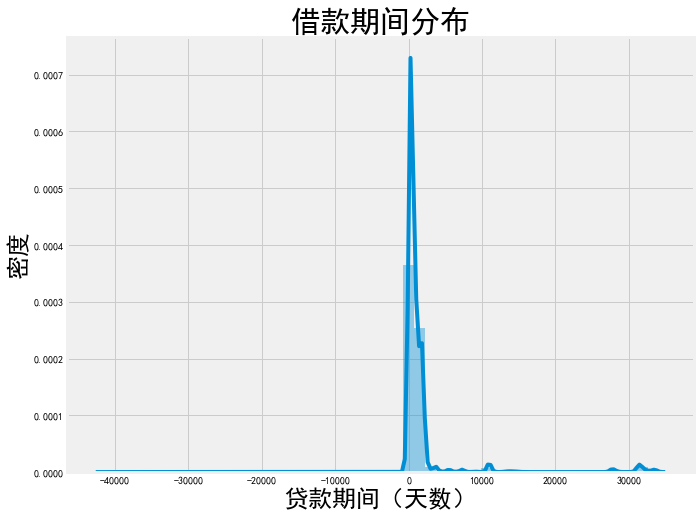

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
# 设置一些默认参数
plt.rcParams['font.size'] = 26 # 默认的字体大小
plt.style.use('fivethirtyeight') # 使用的样式

# 计算出了实际日期之后，需要删除时间差列
bureau = bureau.drop(columns = ['DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'DAYS_CREDIT_UPDATE'])

# 展示借款期间的分布
plt.figure(figsize = (10, 8))
# 使用distplot函数将绘制一个直方图，并拟合一个核密度估计曲线
# 计算贷款天数的差值
sns.distplot((bureau['bureau_credit_end_date'] - bureau['bureau_credit_application_date']).dropna().dt.days)
plt.rcParams['font.sans-serif'] = ['SimHei'] # 显示中文
plt.rcParams['axes.unicode_minus'] = False # 显示负号
plt.xlabel('贷款期间（天数）', size=24)
plt.ylabel('密度', size=24)
plt.title('借款期间分布', size=30)
plt.show()

观察图像，我们发现大部分人的贷款时间都比较短

In [14]:
# 接下来，我们需要对bureau_balance的时间字段也进行相同的转换
# 但是我们注意到区别于bureau表的字段，MONTHS_BALANCE的时间单位是月
bureau_balance['MONTHS_BALANCE']

0           -7
1           -3
2           -4
3           -5
4           -6
            ..
27299920   -26
27299921   -27
27299922   -29
27299923   -14
27299924   -23
Name: MONTHS_BALANCE, Length: 27299925, dtype: int64

我们还需要对'MONTHS_BALANCE'字段进行转化。因为pd.to_timedelta并没有月份单位，所以我们将此列的数字都乘以30，以天数来表示。

In [15]:
# 查看pd.to_timedelta的字段说明
pd.to_timedelta?

Signature: pd.to_timedelta(arg, unit=None, errors='raise')
Docstring:
Convert argument to timedelta.

Timedeltas are absolute differences in times, expressed in difference
units (e.g. days, hours, minutes, seconds). This method converts
an argument from a recognized timedelta format / value into
a Timedelta type.

Parameters
----------
arg : str, timedelta, list-like or Series
    The data to be converted to timedelta.

    .. deprecated:: 1.2
        Strings with units 'M', 'Y' and 'y' do not represent
        unambiguous timedelta values and will be removed in a future version

unit : str, optional
    Denotes the unit of the arg for numeric `arg`. Defaults to ``"ns"``.

    Possible values:

    * 'W'
    * 'D' / 'days' / 'day'
    * 'hours' / 'hour' / 'hr' / 'h'
    * 'm' / 'minute' / 'min' / 'minutes' / 'T'
    * 'S' / 'seconds' / 'sec' / 'second'
    * 'ms' / 'milliseconds' / 'millisecond' / 'milli' / 'millis' / 'L'
    * 'us' / 'microseconds' / 'microsecond' / 'micro' / 'micros'

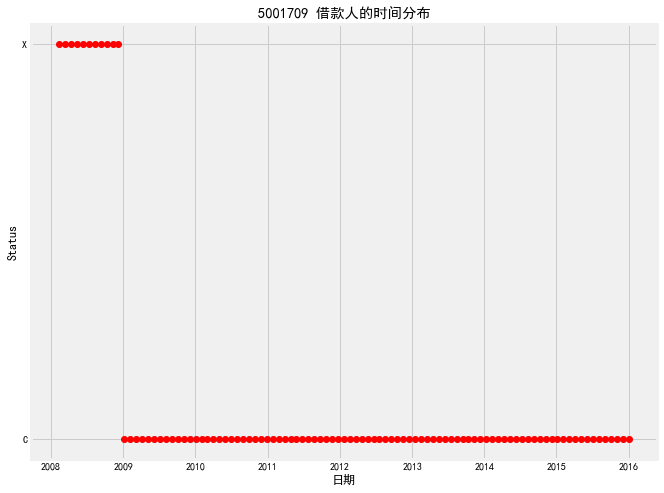

In [18]:
# 将月份转化为天数，并转换为timedelta对象
bureau_balance['MONTHS_BALANCE'] = pd.to_timedelta(bureau_balance['MONTHS_BALANCE']*30, 'D')

# 计算实际日期，并删除月份列
bureau_balance['bureau_balance_date'] = start_date + bureau_balance['MONTHS_BALANCE']
bureau_balance = bureau_balance.drop(columns = ['MONTHS_BALANCE'])

# 选择一笔贷款进行可视化展示
plt.figure(figsize = (10, 8))
example_credit = bureau_balance[bureau_balance['SK_ID_BUREAU'] == 5001709]
plt.plot(example_credit['bureau_balance_date'], example_credit['STATUS'], 'ro')
plt.title('5001709 借款人的时间分布')
plt.xlabel('日期')
plt.ylabel('Status')
plt.show()

下面我们对previous_application表也进行相同的操作

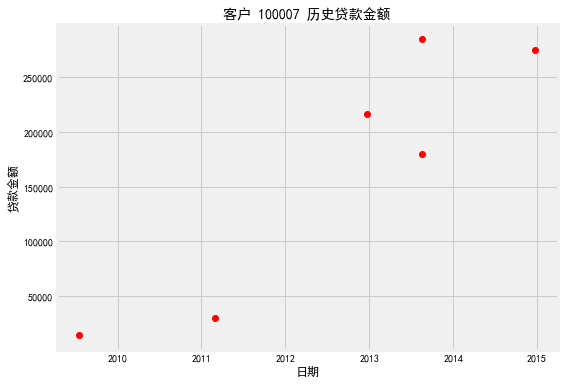

In [19]:
# 转换为timedelta对象
for col in ['DAYS_DECISION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']:
    previous[col] = pd.to_timedelta(previous[col], 'D')
    
# 计算实际日期，并删除时间差列
previous['previous_decision_date'] = start_date + previous['DAYS_DECISION']
previous['previous_drawing_date'] = start_date + previous['DAYS_FIRST_DRAWING']
previous['previous_first_due_date'] = start_date + previous['DAYS_FIRST_DUE']
previous['previous_last_duefirst_date'] = start_date + previous['DAYS_LAST_DUE_1ST_VERSION']
previous['previous_last_due_date'] = start_date + previous['DAYS_LAST_DUE']
previous['previous_termination_date'] = start_date + previous['DAYS_TERMINATION']
previous = previous.drop(columns = ['DAYS_DECISION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION'])

# 选择一客户，绘制其历史贷款金额变化
plt.figure(figsize = (8, 6))
example_client = previous[previous['SK_ID_CURR'] == 100007]
plt.plot(example_client['previous_decision_date'], example_client['AMT_CREDIT'], 'ro')
plt.title('客户 100007 历史贷款金额', fontproperties='SimHei', fontsize=14)
plt.xlabel('日期', fontproperties='SimHei', fontsize=12)
plt.ylabel('贷款金额', fontproperties='SimHei', fontsize=12)
plt.show()

对剩下的表也进行相同的操作

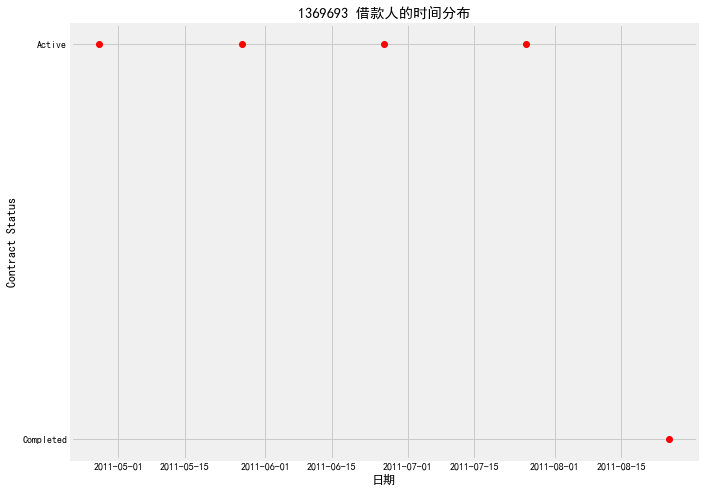

In [22]:
# 转换为timedelta对象
credit['MONTHS_BALANCE'] = pd.to_timedelta(credit['MONTHS_BALANCE']*30, 'D')
cash['MONTHS_BALANCE'] = pd.to_timedelta(cash['MONTHS_BALANCE']*30, 'D')

# 计算实际日期，并删除时间差列
credit['credit_balance_date'] = start_date + credit['MONTHS_BALANCE']
credit = credit.drop(columns = ['MONTHS_BALANCE'])
cash['cash_balance_date'] = start_date + cash['MONTHS_BALANCE']
cash = cash.drop(columns = ['MONTHS_BALANCE'])

# 选择一笔贷款进行可视化展示
example_credit = cash[cash['SK_ID_PREV'] == 1369693]
plt.figure(figsize = (10, 8))
plt.plot(example_credit['cash_balance_date'], example_credit['NAME_CONTRACT_STATUS'], 'ro')
plt.title('1369693 借款的时间分布')
plt.xlabel('日期')
plt.ylabel('Contract Status')
plt.show()

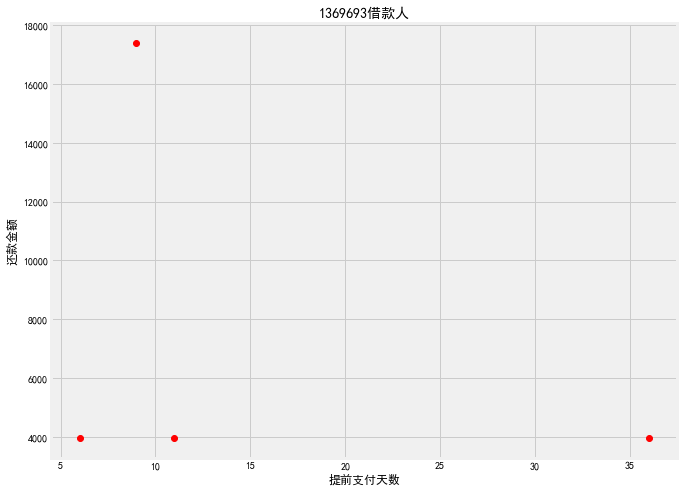

In [25]:
# 转换为timedelta对象
installments['DAYS_INSTALMENT'] = pd.to_timedelta(installments['DAYS_INSTALMENT'], 'D')
installments['DAYS_ENTRY_PAYMENT'] = pd.to_timedelta(installments['DAYS_ENTRY_PAYMENT'], 'D')

# 计算实际日期，并删除时间差列
installments['installments_due_date'] = start_date + installments['DAYS_INSTALMENT']
installments = installments.drop(columns = ['DAYS_INSTALMENT'])     # 计划还款日
installments['installments_paid_date'] = start_date + installments['DAYS_ENTRY_PAYMENT']
installments = installments.drop(columns = ['DAYS_ENTRY_PAYMENT'])  # 实际还款日

# 选择一笔贷款进行可视化展示
example_credit = installments[installments['SK_ID_PREV'] == 1369693]
plt.figure(figsize = (10, 8))
plt.plot((example_credit['installments_due_date'] - example_credit['installments_paid_date']).dt.days, example_credit['AMT_INSTALMENT'], 'ro')
plt.title('1369693借款人', fontproperties='SimHei', fontsize=14)
plt.xlabel('提前支付天数', fontproperties='SimHei', fontsize=12)
plt.ylabel('还款金额', fontproperties='SimHei', fontsize=12)
plt.show()

通过上述步骤，我们将原始数据集中的整数类型时间变量转化为了timestamp类型，这为我们进行基于时间的特征工程打下了基础。

#### 3.2.3 Featuretools落地应用细节

##### 3.2.3.1 构建ER图

回顾之前的知识，featuretools是通过EntitySet来管理数据集和数据集之间关系的结构

因此理解了如何处理时间变量和正确表示特征类型后，我们可以开始将Featuretools应用到实践中。下面的代码示例展示了如何创建实体集的同时指定数据类型和时间索引。

In [31]:
# 创建实体集
es = ft.EntitySet(id = 'clients')

In [103]:
list(app_types.items())[:4]

[('TARGET', 'Boolean'),
 ('FLAG_MOBIL', 'Boolean'),
 ('FLAG_EMP_PHONE', 'Boolean'),
 ('FLAG_WORK_PHONE', 'Boolean')]

In [37]:
# 添加具有唯一索引的实体
es = es.add_dataframe(dataframe_name = 'app_train', dataframe = app_train, 
                      index = 'SK_ID_CURR', logical_types = app_types)

es = es.add_dataframe(dataframe_name = 'app_test', dataframe = app_test, 
                      index = 'SK_ID_CURR', logical_types = app_test_types)

es = es.add_dataframe(dataframe_name = 'bureau', dataframe = bureau, 
                      index = 'SK_ID_BUREAU', time_index='bureau_credit_application_date')
                                                            # 贷款开始的日期
es = es.add_dataframe(dataframe_name = 'previous', dataframe = previous, 
                      index = 'SK_ID_PREV', time_index = 'previous_decision_date',
                      logical_types = previous_types)

c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\featuretools\entityset\entityset.py:749: UserWarning: A Woodwork-initialized DataFrame was provided, so the following parameters were ignored: index, logical_types
  + ", ".join(extra_params)


**思考**：time_index如何选择？

time_index是DataFrame中的一个时间戳列，由Featuretools用来区分在预测时间点之前（即可以用于特征生成）和之后（即不应用于特征生成）的数据。以'bureau'表为例，每一条贷款记录的“贷款申请日期”都应视为生成该条记录所对应特征的“预测时间点”。在这个“预测时间点”之前的信息（如贷款金额，贷款种类等）可以用于特征生成，因为这些信息在实际中会在贷款申请时就已知。然而，在贷款申请日期之后的事件（如贷款结束日期，最后一次更新日期等）在实际中不应被用于预测贷款申请行为，所以应排除在特征生成之外。

1. 因此，我们通常会将time_index设置为某项任务的开始日期。

2. 关于选择哪个字段作为time_index，这还取决于你的预测目标和哪个特征对预测任务更有价值。以'installments'表为例，表中有两个时间字段：计划还款日期和实际还款日期。如果我们更关注的是用户的实际还款行为，而不是计划的还款日期，那么实际的还款日期应作为time_index

In [38]:
# 添加没有唯一索引的实体
es = es.add_dataframe(dataframe_name = 'bureau_balance', dataframe = bureau_balance, 
                      make_index = True, index = 'bb_index',
                      time_index = 'bureau_balance_date')

es = es.add_dataframe(dataframe_name = 'cash', dataframe = cash, 
                      make_index = True, index = 'cash_index',
                      time_index = 'cash_balance_date')

es = es.add_dataframe(dataframe_name = 'installments', dataframe = installments,
                      make_index = True, index = 'installments_index',
                      time_index = 'installments_paid_date') # 实际还款日

es = es.add_dataframe(dataframe_name = 'credit', dataframe = credit,
                      make_index = True, index = 'credit_index',
                      time_index = 'credit_balance_date')

c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\featuretools\entityset\entityset.py:749: UserWarning: A Woodwork-initialized DataFrame was provided, so the following parameters were ignored: index, time_index, make_index
  + ", ".join(extra_params)


In [39]:
# 定义各个实体之间的关系
r_app_bureau = ft.Relationship (entityset=es,
                                parent_dataframe_name='app_train',
                                parent_column_name='SK_ID_CURR',
                                child_dataframe_name='bureau',
                                child_column_name='SK_ID_CURR')

r_test_app_bureau = ft.Relationship(entityset=es,
                                    parent_dataframe_name='app_test',
                                    parent_column_name='SK_ID_CURR',
                                    child_dataframe_name='bureau',
                                    child_column_name='SK_ID_CURR')

r_bureau_balance = ft.Relationship (entityset=es,
                                    parent_dataframe_name='bureau',
                                    parent_column_name='SK_ID_BUREAU',
                                    child_dataframe_name='bureau_balance',
                                    child_column_name='SK_ID_BUREAU')

r_app_previous= ft.Relationship(entityset=es,
                                parent_dataframe_name='app_train',
                                parent_column_name='SK_ID_CURR',
                                child_dataframe_name='previous',
                                child_column_name='SK_ID_CURR')

r_test_app_previous=ft.Relationship(entityset=es,
                                    parent_dataframe_name='app_test',
                                    parent_column_name='SK_ID_CURR',
                                    child_dataframe_name='previous',
                                    child_column_name='SK_ID_CURR')

r_previous_cash = ft.Relationship(entityset=es,
                                  parent_dataframe_name='previous',
                                  parent_column_name='SK_ID_PREV',
                                  child_dataframe_name='cash',
                                  child_column_name='SK_ID_PREV')

r_previous_installments = ft.Relationship(entityset=es,
                                          parent_dataframe_name='previous',
                                          parent_column_name='SK_ID_PREV',
                                          child_dataframe_name='installments',
                                          child_column_name='SK_ID_PREV')

r_previous_credit = ft.Relationship(entityset=es,
                                    parent_dataframe_name='previous',
                                    parent_column_name='SK_ID_PREV',
                                    child_dataframe_name='credit',
                                    child_column_name='SK_ID_PREV')

# 将定义的关系添加到实体集中
es = es.add_relationships([r_app_bureau, r_test_app_bureau, r_bureau_balance, r_app_previous, r_test_app_previous,
                           r_previous_cash, r_previous_installments, r_previous_credit])
# 打印出实体集
es

Entityset: clients
  DataFrames:
    bureau_balance [Rows: 27299925, Columns: 4]
    cash [Rows: 10001358, Columns: 9]
    installments [Rows: 13605401, Columns: 9]
    app_train [Rows: 307511, Columns: 122]
    app_test [Rows: 48744, Columns: 121]
    bureau [Rows: 1716428, Columns: 17]
    previous [Rows: 1670214, Columns: 37]
    credit [Rows: 3840312, Columns: 24]
  Relationships:
    bureau.SK_ID_CURR -> app_train.SK_ID_CURR
    bureau.SK_ID_CURR -> app_test.SK_ID_CURR
    bureau_balance.SK_ID_BUREAU -> bureau.SK_ID_BUREAU
    previous.SK_ID_CURR -> app_train.SK_ID_CURR
    previous.SK_ID_CURR -> app_test.SK_ID_CURR
    cash.SK_ID_PREV -> previous.SK_ID_PREV
    installments.SK_ID_PREV -> previous.SK_ID_PREV
    credit.SK_ID_PREV -> previous.SK_ID_PREV

以上的步骤构建了一个Featuretools的实体集（EntitySet），实体集中包含多个实体（Entity），每个实体代表一个数据表。这些实体之间通过关系（Relationship）链接起来，以此构建了一个关系数据库模型。这种模型能够为我们进行深度特征合成提供了基础，同时也让我们能更好地利用多个相关联的数据表。

In [ ]:
# ! pip install graphviz

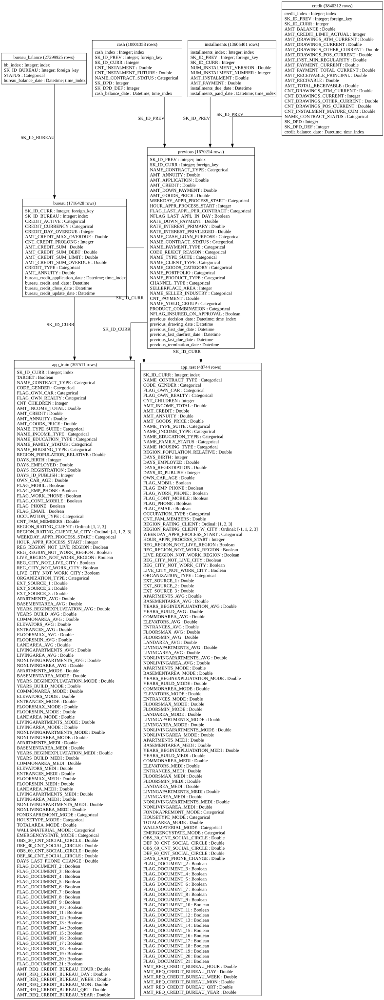

In [ ]:
# 打印关系图需要已经安装graphviz
es.plot()

##### 3.2.3.2 处理时间序列变量

在已经构建了ER图之后，我们就可以进行深度特征合成了，在这一部分，我们先对时间序列变量进行衍生。在Featuretools中，处理时间序列变量的方式是通过dfs函数（即Deep Feature Synthesis函数）生成特征。

我们将指定trans_primitives参数为['cum_sum', 'time_since_previous']，表示我们要生成的时间序列特征类型为累计求和和自上次事件以来的时间。

max_depth参数为2，表示要考虑的关系链的最大深度。

agg_primitives参数为['trend']，表示我们要生成的聚合特征类型为趋势。

我们将features_only参数设为False，表示我们同时要生成特征矩阵和特征列表。

最后，chunk_size参数被设置为训练集的长度，这意味着我们一次性计算所有特征，而不是分块计算。同样，我们会忽略测试集数据，避免数据泄露。我们使用相同的方式处理测试集的时间序列变量。

In [ ]:
import time

# 记录开始时间
start_time = time.time()

# 通过Featuretools生成特征
time_features, time_feature_names = ft.dfs(entityset = es, target_dataframe_name = 'app_train', 
                                           trans_primitives = ['cum_sum', 'time_since_previous'], 
                                           max_depth = 2,
                                           agg_primitives = ['trend'] ,
                                           features_only = False, verbose = True,
                                           chunk_size = len(app_train),
                                           ignore_dataframes = ['app_test'])

# 记录结束时间
end_time = time.time()

# 输出运行时间
print("Time taken: {:.6f}s".format(end_time - start_time))

Built 452 features
Elapsed: 15:47:17 | Progress: 100%|██████████
Time taken: 56837.669440s


In [1]:
# 15.7小时运行时长
56837/60/60

15.788055555555555

In [ ]:
# 可以看到新衍生的特征进行了两次基础操作
time_features.iloc[:, -10:].head()

,"CUM_SUM(TREND(previous.AMT_APPLICATION, previous_decision_date))","CUM_SUM(TREND(previous.AMT_CREDIT, previous_decision_date))","CUM_SUM(TREND(previous.AMT_DOWN_PAYMENT, previous_decision_date))","CUM_SUM(TREND(previous.AMT_GOODS_PRICE, previous_decision_date))","CUM_SUM(TREND(previous.CNT_PAYMENT, previous_decision_date))","CUM_SUM(TREND(previous.HOUR_APPR_PROCESS_START, previous_decision_date))","CUM_SUM(TREND(previous.RATE_DOWN_PAYMENT, previous_decision_date))","CUM_SUM(TREND(previous.RATE_INTEREST_PRIMARY, previous_decision_date))","CUM_SUM(TREND(previous.RATE_INTEREST_PRIVILEGED, previous_decision_date))","CUM_SUM(TREND(previous.SELLERPLACE_AREA, previous_decision_date))"
SK_ID_CURR,,,,,,,,,,
100002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100003,367.444774,418.305454,NaN,367.444774,-0.001774,-0.000448,NaN,NaN,NaN,0.285154
100004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100006,630.070715,776.928357,NaN,1391.162781,0.045124,0.002063,NaN,NaN,NaN,-1.333402
100007,762.957307,928.679814,NaN,1524.049373,0.055780,0.000891,NaN,NaN,NaN,-1.706613


In [ ]:
# 导入Featuretools的特征选择模块
from featuretools import selection

# 移除低信息特征
# 低信息特征是指在特征矩阵中只有一个唯一值或所有值都为空的特征
time_features2 = selection.remove_low_information_features(time_features)

featuretools.selection模块还支持其他的特征筛选：

1. remove_highly_null_features：删除具有高空值（95%）的特征。

2. remove_single_value_features：删除只有单一值的特征，默认不会计算缺失值。

3. remove_highly_correlated_features：删除高度相关（皮尔逊系数大于0.95）的特征。

trend趋势特征是什么含义？

以TREND(bureau.AMT_CREDIT_SUM, bureau_credit_application_date)这个特征为例

Featuretools使用线性模型（线性回归）对每个用户的AMT_CREDIT_SUM随bureau_credit_application_date变化的趋势进行拟合，并用这个模型的斜率来表示这个趋势。这个斜率就是特征TREND(bureau.AMT_CREDIT_SUM, bureau_credit_application_date)的值。

Text(0.5, 1.0, '信贷金额趋势分布')

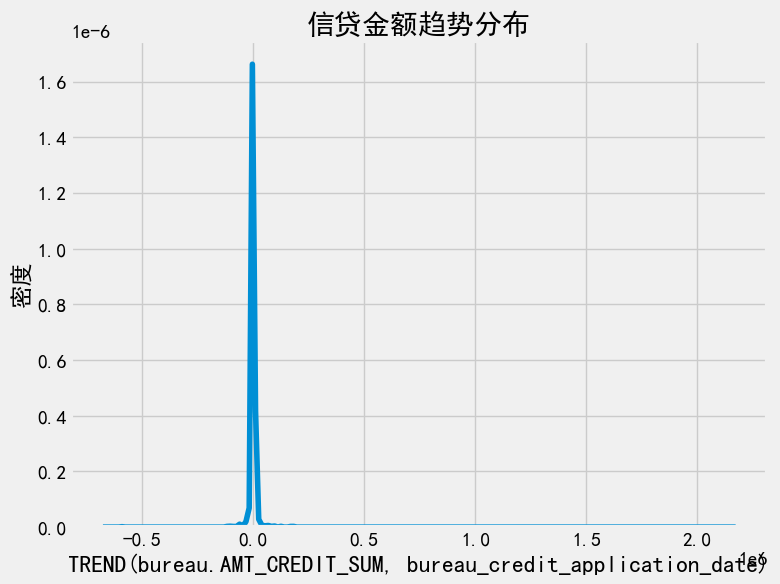

In [ ]:
# 绘制特征分布图
plt.figure(figsize=(8, 6))
sns.kdeplot(time_features['TREND(bureau.AMT_CREDIT_SUM, bureau_credit_application_date)'].dropna())
plt.xlabel('TREND(bureau.AMT_CREDIT_SUM, bureau_credit_application_date)')
plt.ylabel('密度')
plt.title('信贷金额趋势分布') # 大部分都分布在-0.1左右，说明大部分人的借款需求是在下降的

In [ ]:
# 处理测试集的时间序列变量
start_time = time.time()
time_features_test, time_feature_names_test = ft.dfs(entityset = es, target_dataframe_name = 'app_test', 
                                           trans_primitives = ['cum_sum', 'time_since_previous'], 
                                           max_depth = 2,
                                           agg_primitives = ['trend'] ,
                                           features_only = False, verbose = True,
                                           chunk_size = len(app_test),
                                           ignore_dataframes = ['app_train'])
end_time = time.time()
print("Time taken: {:.6f}s".format(end_time - start_time))

Built 451 features
Elapsed: 5:50:37 | Progress: 100%|██████████
Time taken: 21037.180009s


In [4]:
# 测试集衍生也花了大概6小时的时间
21037/60/60

5.8436111111111115

In [ ]:
time_features_test2 = selection.remove_low_information_features(time_features_test)

In [ ]:
# 使用align函数对齐训练集和测试集的特征
train_labels = time_features['TARGET']
feature_matrix, feature_matrix_test = time_features2.align(time_features_test2, join = 'inner', axis = 1)
time_features['TARGET'] = train_labels

In [ ]:
# 保存衍生好的数据集，以便于后面训练
feature_matrix.to_csv('timefeatures_train.csv')
feature_matrix_test.to_csv('timefeatures_test.csv')

##### 3.2.3.3 使用where_primitives生成条件聚合特征

&emsp;&emsp;上面我们已经完成了时序变量的衍生，下一部分，我们将生成条件聚合特征。在Featuretools中，生成条件聚合特征的方式是通过where_primitives参数指定条件聚合函数。同样，我们会忽略测试集数据，避免数据泄露。我们使用相同的方式处理测试集的条件聚合特征。

执行下面的代码之前，先确保自己已经安装heapdict库

In [ ]:
# ! pip install heapdict

In [ ]:
from heapdict import heapdict

In [ ]:
# 为'previous'数据表中的'NAME_CONTRACT_STATUS'列指定感兴趣的值
# 只有当'NAME_CONTRACT_STATUS'列的值为这三个值中的一个时，才会进行条件聚合计算。
es['previous']['NAME_CONTRACT_STATUS'].interesting_values = ['Approved', 'Refused', 'Canceled']
# 和分层聚合分析非常相似

# 记录开始时间
start_time = time.time()

# 通过Featuretools生成特征
interesting_features, interesting_feature_names = ft.dfs(entityset=es, target_dataframe_name='app_train', max_depth = 1, 
                                                         where_primitives = ['mean', 'mode'], # 要进行何种衍生
                                                                            # 计算均值和众数
                                                         trans_primitives=[], features_only = False, verbose = True,
                                                         chunk_size = len(app_train),
                                                         ignore_dataframes = ['app_test'])

# 记录结束时间
end_time = time.time()

# 输出运行时间
print("Time taken: {:.6f}s".format(end_time - start_time))

Built 277 features
Elapsed: 00:13 | Progress:  49%|████▊     

In [ ]:
# 使用filter函数查看含有'MEAN'字符串的列
interesting_features.filter(like='MEAN').tail()

,MEAN(bureau.AMT_ANNUITY),MEAN(bureau.AMT_CREDIT_MAX_OVERDUE),MEAN(bureau.AMT_CREDIT_SUM),MEAN(bureau.AMT_CREDIT_SUM_DEBT),MEAN(bureau.AMT_CREDIT_SUM_LIMIT),MEAN(bureau.AMT_CREDIT_SUM_OVERDUE),MEAN(bureau.CNT_CREDIT_PROLONG),MEAN(bureau.CREDIT_DAY_OVERDUE),MEAN(previous.AMT_ANNUITY),MEAN(previous.AMT_APPLICATION),MEAN(previous.AMT_CREDIT),MEAN(previous.AMT_DOWN_PAYMENT),MEAN(previous.AMT_GOODS_PRICE),MEAN(previous.CNT_PAYMENT),MEAN(previous.HOUR_APPR_PROCESS_START),MEAN(previous.RATE_DOWN_PAYMENT),MEAN(previous.RATE_INTEREST_PRIMARY),MEAN(previous.RATE_INTEREST_PRIVILEGED),MEAN(previous.SELLERPLACE_AREA)
SK_ID_CURR,,,,,,,,,,,,,,,,,,,
456251,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6605.910156,40455.000,40455.00,0.00,40455.000,8.00,17.000,0.000000,NaN,NaN,30.000
456252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10074.464844,57595.500,56821.50,3456.00,57595.500,6.00,10.000,0.062439,NaN,NaN,190.000
456253,58369.5,NaN,990000.000000,448958.250,0.0,0.0,0.000000,0.0,4770.404907,24162.750,20625.75,4403.25,24162.750,5.00,11.500,0.214294,NaN,NaN,22.000
456254,0.0,NaN,45000.000000,0.000,NaN,0.0,0.000000,0.0,10681.132080,121317.750,134439.75,0.00,121317.750,15.00,15.000,0.000000,NaN,NaN,1578.000
456255,1081.5,12056.481055,345629.045455,191864.125,0.0,0.0,0.090909,0.0,20775.391724,362770.875,424431.00,4941.00,362770.875,21.75,14.625,0.064779,NaN,NaN,74.125


In [ ]:
# 查看最后6列
# 可以发现，就算我们没有指定求和，featuretools还是自动帮我们计算了
# 类似的还有MAX,MIN
interesting_features.iloc[:, -6:, ].head()

,SUM(previous.CNT_PAYMENT),SUM(previous.HOUR_APPR_PROCESS_START),SUM(previous.RATE_DOWN_PAYMENT),SUM(previous.RATE_INTEREST_PRIMARY),SUM(previous.RATE_INTEREST_PRIVILEGED),SUM(previous.SELLERPLACE_AREA)
SK_ID_CURR,,,,,,
100002,24.0,9.0,0.000000,0.0,0.0,500.0
100003,30.0,44.0,0.100037,0.0,0.0,1599.0
100004,4.0,5.0,0.212036,0.0,0.0,30.0
100006,138.0,132.0,0.326782,0.0,0.0,8048.0
100007,124.0,74.0,0.319031,0.0,0.0,2455.0


In [ ]:
# 处理测试集的条件聚合特征
es['previous']['NAME_CONTRACT_STATUS'].interesting_values = ['Approved', 'Refused', 'Canceled']

start_time = time.time()
interesting_features_test, interesting_feature_names_test = ft.dfs(entityset=es, target_dataframe_name='app_test', max_depth = 1, 
                                                         where_primitives = ['mean', 'mode'], 
                                                         trans_primitives=[], features_only = False, verbose = True,
                                                         chunk_size = len(app_test),
                                                         ignore_dataframes = ['app_train'])
end_time = time.time()
print("Time taken: {:.6f}s".format(end_time - start_time))

In [ ]:
interesting_features_test2 = selection.remove_low_information_features(interesting_features_test)

In [ ]:
# 对齐训练集和测试集的特征
train_labels = interesting_features['TARGET']
feature_matrix, feature_matrix_test = interesting_features.align(interesting_features_test, join = 'inner', axis = 1)
interesting_features['TARGET'] = train_labels

In [ ]:
feature_matrix.to_csv('interesting_features_train.csv')
feature_matrix_test.to_csv('interesting_features_test.csv')

Featuretools是一个非常强大的自动化特征工程库，它的强大在于能够自动地从原始数据中衍生出大量的有效特征。这种自动化的过程在很大程度上减少了人工挖掘特征的难度，节省了大量的时间，也避免了因为经验不足或者疏忽而忽略重要特征的可能性。

在这次的案例中，我们已经充分利用了Featuretools的深度特征合成(Deep Feature Synthesis)功能，进行了丰富多样的特征衍生。我们也尝试了基于条件的聚合特征以及对时间序列数据的处理，从而获取到了更深层次的数据信息。经过Featuretools处理的数据，不仅特征数量大大增加，而且特征的复杂度和信息量也有所提升，有助于提高我们模型的预测性能。

尽管在这次案例中我们已经使用了Featuretools的许多功能，但这仅仅是冰山一角。在实际应用中，你还可以进行更多的尝试和探索。例如，可以针对不同的业务场景，自定义feature primitives，这样就可以创建出更具业务含义的特征。你也可以通过设置不同的参数，例如max_depth，agg_primitives等，来控制特征生成的复杂度和种类，从而获取到更适合你的任务的特征。

总的来说，Featuretools是一把非常有力的工具，能够帮助我们更高效、更深入地进行特征工程。当然，虽然它能够自动化地进行大量的特征衍生，但这并不意味着我们可以完全忽视特征工程的过程。相反，我们需要深入理解和掌握Featuretools的功能，以便更好地使用它。同时，也需要根据我们的任务和数据，进行必要的特征筛选和优化，以避免特征过多导致的过拟合问题。通过这种方式，我们才能最大限度地利用Featuretools，发挥其自动化特征工程的优势。

# 第四部分：高级竞赛策略与融合策略

## 1 特征工程成果

首先，我们回顾一下我们进行的特征工程工作。在前面的内容中，我们针对信贷数据，进行了多角度、深度的特征工程。我们创建了一系列领域特征以及基于目标编码和GAME策略的统计特征衍生。这些新衍生的特征，包含了比原始数据更深层次的信息，能够帮助模型更好地抓住数据的特性。

特征工程是机器学习中的一个重要环节，好的特征工程能够极大地提升模型的性能。我们的目标是让你认知到特征工程带来的巨大威力。那么，我们的特征工程工作带来了多大的提升呢？

为了展示特征工程的成果，接下来我们将用逻辑回归、随机森林、以及lightgbm三种模型，以默认参数在衍生特征上进行建模。我们会将每个模型在特征工程之后的表现，与之前的baseline进行对比。这样，我们就能清晰地看到，特征工程为我们带来了多大的性能提升。

通过这种方式，我们将直接看到特征工程对模型效果的影响，也就是特征工程相对于baseline模型的效果提升。如果我们的特征工程工作有效，那么新模型的效果应该会比baseline模型有显著的提升。反之，如果效果没有明显提升，那么说明我们的特征工程可能还有改进的空间。

In [8]:
import numpy as np
import pandas as pd
import gc
import features_creation as fc
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

from sklearn.model_selection import KFold, train_test_split, GridSearchCV, cross_val_score
from scipy.misc import derivative
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer
from lightgbm import LGBMClassifier
from sklearn.preprocessing import KBinsDiscretizer, StandardScaler

In [20]:
# 导入手工衍生完毕的训练集和测试集数据
apply = pd.read_csv('apply.csv')

In [21]:
# 分割训练集和测试集
application_test = apply[apply['TARGET'].isnull()]
application_test = application_test.drop('TARGET', axis = 1)
application_train = apply[~apply['TARGET'].isnull()]

In [ ]:
application_train.shape

(307505, 1719)

In [ ]:
application_test.shape

(48744, 1718)

- **逻辑回归**

In [468]:
application_train.head()

SK_ID_CURR  TARGET  NAME_CONTRACT_TYPE  CODE_GENDER  FLAG_OWN_CAR  \
0      100002     1.0                   0            0             0   
1      100003     0.0                   0            1             0   
2      100004     0.0                   1            0             1   
3      100006     0.0                   0            1             0   
4      100007     0.0                   0            0             0   

   FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0                0             0          202500.0    406597.5      24700.5   
1                1             0          270000.0   1293502.5      35698.5   
2                0             0           67500.0    135000.0       6750.0   
3                0             0          135000.0    312682.5      29686.5   
4                0             0          121500.0    513000.0      21865.5   

   AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  \
0         351000.0                    0.018801       -9461         -637.0   
1        1129500.0                    0.003541      -16765        -1188.0   
2         135000.0                    0.010032      -19046         -225.0   
3         297000.0                    0.008019      -19005        -3039.0   
4         513000.0                    0.028663      -19932        -3038.0   

   DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  FLAG_MOBIL  \
0            -3648.0            -2120          0.0           1   
1            -1186.0             -291          0.0           1   
2            -4260.0            -2531         26.0           1   
3            -9833.0            -2437          0.0           1   
4            -4311.0            -3458          0.0           1   

   FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  FLAG_PHONE  FLAG_EMAIL  \
0               1                0                 1           1           0   
1               1                0                 1           1           0   
2               1                1                 1           1           0   
3               1                0                 1           0           0   
4               1                0                 1           0           0   

   CNT_FAM_MEMBERS  REGION_RATING_CLIENT  REGION_RATING_CLIENT_W_CITY  \
0              1.0                     2                            2   
1              2.0                     1                            1   
2              1.0                     2                            2   
3              2.0                     2                            2   
4              1.0                     2                            2   

   HOUR_APPR_PROCESS_START  REG_REGION_NOT_LIVE_REGION  \
0                       10                           0   
1                       11                           0   
2                        9                           0   
3                       17                           0   
4                       11                           0   

   REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION  \
0                           0                            0   
1                           0                            0   
2                           0                            0   
3                           0                            0   
4                           0                            0   

   REG_CITY_NOT_LIVE_CITY  REG_CITY_NOT_WORK_CITY  LIVE_CITY_NOT_WORK_CITY  \
0                       0                       0                        0   
1                       0                       0                        0   
2                       0                       0                        0   
3                       0                       0                        0   
4                       0                       1                        1   

   EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3  APARTMENTS_AVG  BASEMENTAREA_AVG  \
0      0.083037      0.262949      0.139376

In [469]:
application_test.head()

SK_ID_CURR  NAME_CONTRACT_TYPE  CODE_GENDER  FLAG_OWN_CAR  \
307505      100001                   0            1             0   
307506      100005                   0            0             0   
307507      100013                   0            0             1   
307508      100028                   0            1             0   
307509      100038                   0            0             1   

        FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
307505                0             0          135000.0    568800.0   
307506                0             0           99000.0    222768.0   
307507                0             0          202500.0    663264.0   
307508                0             2          315000.0   1575000.0   
307509                1             1          180000.0    625500.0   

        AMT_ANNUITY  AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  \
307505      20560.5         450000.0                    0.018850      -19241   
307506      17370.0         180000.0                    0.035792      -18064   
307507      69777.0         630000.0                    0.019101      -20038   
307508      49018.5        1575000.0                    0.026392      -13976   
307509      32067.0         625500.0                    0.010032      -13040   

        DAYS_EMPLOYED  DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  \
307505        -2329.0            -5170.0             -812          0.0   
307506        -4469.0            -9118.0            -1623          0.0   
307507        -4458.0            -2175.0            -3503          5.0   
307508        -1866.0            -2000.0            -4208          0.0   
307509        -2191.0            -4000.0            -4262         16.0   

        FLAG_MOBIL  FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  \
307505           1               1                0                 1   
307506           1               1                0                 1   
307507           1               1                0                 1   
307508           1               1                0                 1   
307509           1               1                1                 1   

        FLAG_PHONE  FLAG_EMAIL  CNT_FAM_MEMBERS  REGION_RATING_CLIENT  \
307505           0           1              2.0                     2   
307506           0           0              2.0                     2   
307507           0           0              2.0                     2   
307508           1           0              4.0                     2   
307509           0           0              3.0                     2   

        REGION_RATING_CLIENT_W_CITY  HOUR_APPR_PROCESS_START  \
307505                            2                       18   
307506                            2                        9   
307507                            2                       14   
307508                            2                       11   
307509                            2                        5   

        REG_REGION_NOT_LIVE_REGION  REG_REGION_NOT_WORK_REGION  \
307505                           0                           0   
307506                           0                           0   
307507                           0                           0   
307508                           0                           0   
307509                           0                           0   

        LIVE_REGION_NOT_WORK_REGION  REG_CITY_NOT_LIVE_CITY  \
307505                            0                       0   
307506                            0                       0   
307507                            0                       0   
307508                            0                       0   
307509                            0                       0   

        REG_CITY_NOT_WORK_CITY  LIVE_CITY_NOT_WORK_CITY  EXT_SOURCE_1  \
307505                       0                        0      0.752614   
307506                       0                        0

In [470]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

# 定义一个用于给逻辑回归和随机森林建模的变量train
train = application_train.drop(columns = ['TARGET','SK_ID_CURR'])

# 检查是否存在无穷大值
if np.isinf(train).any().any():
    print('数据包含无穷大值')
    
# 检查是否存在负无穷大值
if np.isneginf(train).any().any():
    print('数据包含负无穷大值')

数据包含无穷大值
数据包含负无穷大值


In [471]:
# 记录特征的名称
features = list(train.columns)

# 定义一个用于给逻辑回归和随机森林建模的变量test
test = application_test.copy()[features]

# 用NaN替换正无穷大值
train[train == np.inf] = np.nan
test[test == np.inf] = np.nan

# 用NaN替换负无穷大值
train[train == -np.inf] = np.nan
test[test == -np.inf] = np.nan

In [ ]:
# 缺失值的中位数填充
imputer = SimpleImputer(strategy='median')

# 将每个特征缩放到0-1之间
scaler = MinMaxScaler(feature_range=(0, 1))

# 将训练集和测试集合并在一起进行fit，最大程度利用比赛数据
to_fit = train.append(test)

# 在训练数据上进行填充
imputer.fit(to_fit)

# 对训练和测试数据进行转换
train = imputer.transform(train)
test = imputer.transform(test)

# 使用相同的缩放器对数据进行缩放
scaler.fit(to_fit)
train = scaler.transform(train)
test = scaler.transform(test)

print('训练数据形状:', train.shape)
print('测试数据形状:', test.shape)

训练数据形状: (307505, 1717)
测试数据形状: (48744, 1717)


In [473]:
from sklearn.linear_model import LogisticRegression

# 使用指定的正则化参数创建模型
log_reg = LogisticRegression(C=0.0001)

# 在训练数据上训练模型
log_reg.fit(train, application_train['TARGET'])

# 进行预测
# 确保只选择第二列
log_reg_pred = log_reg.predict_proba(test)[:, 1]

In [ ]:
# 获取特征的系数
coefficients = log_reg.coef_[0]

# 获取特征的重要性排序
feature_importance = np.abs(coefficients)  # 取系数的绝对值
sorted_indices = np.argsort(feature_importance)[::-1]  # 按重要性降序排序的索引

# 打印特征的重要性排序结果
for idx in sorted_indices:
    print(f"Feature: {features[idx]}, Importance: {feature_importance[idx]}")
# 观察特征重要性，前几名没有发生变化，后面主要是主表的特征衍生结果

Feature: CODE_GENDER, Importance: 0.09084842024397664
Feature: NAME_EDUCATION_TYPE_Secondary / secondary special, Importance: 0.07670793062576482
Feature: NAME_EDUCATION_TYPE_Higher education, Importance: 0.07453400229993909
Feature: FLAG_DOCUMENT_3, Importance: 0.06574305538276908
Feature: FLAG_OWN_CAR, Importance: 0.0637640264364389
Feature: CASH_MONTHS_BALANCE_min, Importance: 0.05443666125305465
Feature: OCCUPATION_TYPE_manual, Importance: 0.05442978116570454
Feature: NAME_INCOME_TYPE_Working, Importance: 0.05360477018849423
Feature: PREV_DAYS_DECISION_min, Importance: 0.05106813294961279
Feature: ORGANIZATION_TYPE_manual, Importance: 0.048409607866240704
Feature: EXT_SOURCE_MEAN_CODE_GENDER_min_ratio, Importance: 0.046935502427630685
Feature: AMT_REQ_CREDIT_BUREAU_HOUR_manual, Importance: 0.04643655514526002
Feature: NAME_CONTRACT_TYPE, Importance: 0.043259783264500064
Feature: DAYS_EMPLOYED_BIRTH_RATIO, Importance: 0.04213326308706428
Feature: EXT_SOURCE_MEAN_NAME_HOUSING_TYPE_ma

In [ ]:
# Submission dataframe
pd.set_option('display.float_format', '{:.3f}'.format) # 只显示小数点后一位数
submit = application_test[['SK_ID_CURR']]
submit['TARGET'] = log_reg_pred

submit.head()

,SK_ID_CURR,TARGET
307505,100001,0.055
307506,100005,0.139
307507,100013,0.030
307508,100028,0.049
307509,100038,0.122


In [476]:
# 0.73414
submit.to_csv('default_model_log_reg.csv', index = False) 
# baseline 0.68495

- **随机森林**

In [480]:
from sklearn.ensemble import RandomForestClassifier

# 创建随机森林分类器
random_forest = RandomForestClassifier(n_estimators = 1000, random_state = 2024, verbose = 1, n_jobs = -1)

In [ ]:
# 在训练数据上训练模型
random_forest.fit(train, application_train['TARGET'])

# 提取特征重要性
feature_importance_values = random_forest.feature_importances_
feature_importances = pd.DataFrame({'feature': features, 'importance': feature_importance_values})

# 对测试数据进行预测
predictions = random_forest.predict_proba(test)[:, 1]

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed: 16.2min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 29.3min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 37.7min finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    1.8s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    4.9s
[Parallel(n_jobs=16)]: Done 768 tasks      | elapsed:    9.1s
[Parallel(n_jobs=16)]: Done 1000 out of 1000 | elapsed:   11.8s finished


In [ ]:
df = feature_importances.sort_values(by='importance',ascending=False)
df['importance'] = df['importance']*1000
df.head()

,feature,importance
1193,EXT_SOURCE_MEAN_NAME_CONTRACT_TYPE_sum_ratio,2.728
1410,EXT_SOURCE_MEAN_HOUR_APPR_PROCESS_START_manual...,2.554
1194,EXT_SOURCE_MEAN_NAME_CONTRACT_TYPE_mean_ratio,2.500
1412,EXT_SOURCE_MEAN_HOUR_APPR_PROCESS_START_manual...,2.467
1280,EXT_SOURCE_MEAN_NAME_INCOME_TYPE_manual_median...,2.428


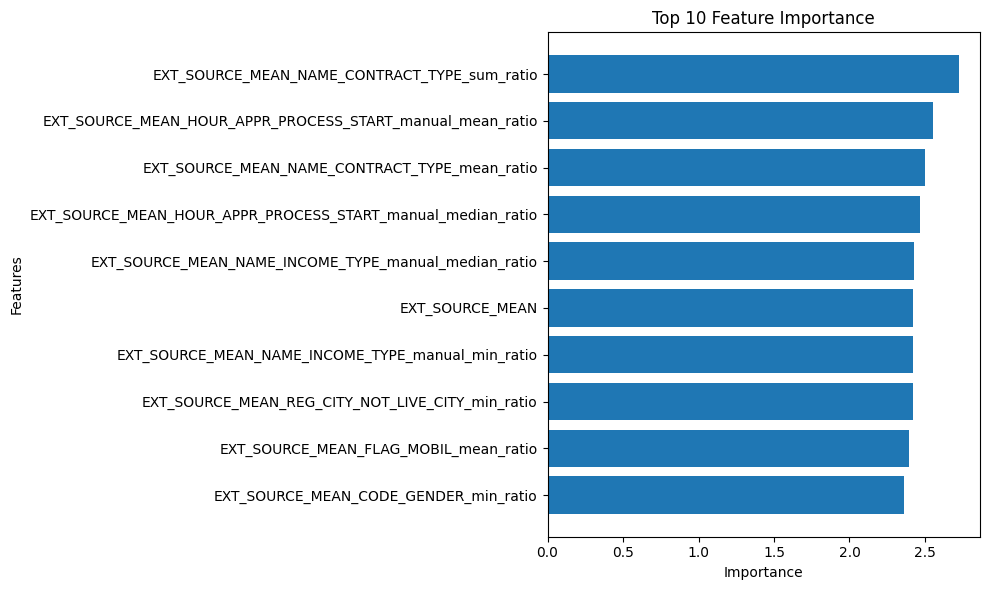

In [ ]:
# 随机森林的重要特征都是外部文件均值相关的特征，说明很有可能过拟合很严重
plot_feature_importances(df)

In [484]:
submit = application_test[['SK_ID_CURR']]
submit['TARGET'] = predictions

# 0.73521
submit.to_csv('default_model_random_forest.csv', index = False) 
# 0.71262

相较之下，逻辑回归的上升明显很多

- **lightgbm**

In [ ]:
application_train.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in application_train.columns]
application_test.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in application_test.columns]
valid_auc,feature_importance,submission = fit(application_train,application_test)

[1]	training's binary_logloss: 0.274609	valid_1's binary_logloss: 0.270725
[2]	training's binary_logloss: 0.269558	valid_1's binary_logloss: 0.266155
[3]	training's binary_logloss: 0.265609	valid_1's binary_logloss: 0.262632
[4]	training's binary_logloss: 0.262356	valid_1's binary_logloss: 0.259728
[5]	training's binary_logloss: 0.259639	valid_1's binary_logloss: 0.25737
[6]	training's binary_logloss: 0.257307	valid_1's binary_logloss: 0.255307
[7]	training's binary_logloss: 0.255312	valid_1's binary_logloss: 0.253572
[8]	training's binary_logloss: 0.25355	valid_1's binary_logloss: 0.252143
[9]	training's binary_logloss: 0.252034	valid_1's binary_logloss: 0.250834
[10]	training's binary_logloss: 0.250681	valid_1's binary_logloss: 0.249774
[11]	training's binary_logloss: 0.249398	valid_1's binary_logloss: 0.248836
[12]	training's binary_logloss: 0.248196	valid_1's binary_logloss: 0.247841
[13]	training's binary_logloss: 0.247134	valid_1's binary_logloss: 0.247039
[14]	training's binary_

In [ ]:
# 本地验证成绩为0.7906
valid_auc

0.7906236016627501

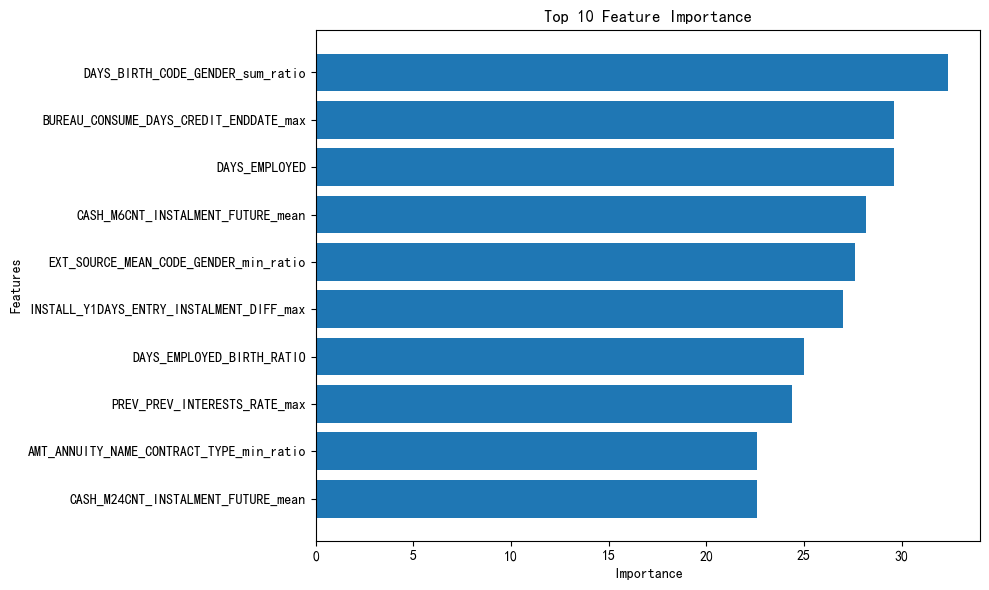

In [ ]:
plot_feature_importances(feature_importance.sort_values(by='importance',ascending=False))

In [488]:
# CPU成绩0.79192
submission.to_csv('default_model_lightgbm.csv',index=False)

|lightgbm_baseline|0.74385|
|---|---|
|bureau_naiveGMAE|0.74767|
|bureau_GMAE|0.76348|
|prev_GMAE|0.75556|
|defaultlightgbm|0.79192|

通过对比我们特征工程前后的模型性能，我们可以看到明显的提升。使用LightGBM模型并结合我们的特征工程，模型的性能从baseline的0.74385提升到了0.79192。这几乎达到了6%的成绩提升，而我们这期间并未进行任何模型参数的调优。

这个显著的提升显示出，我们在特征工程方面所做的工作是有效的，且这还只是初步的成果。特征工程是模型优化的基础，有了高质量的特征，我们接下来将有更大的空间去优化模型，应用高级策略和技术，来进一步提升模型的性能。我们的目标是将这个分数持续提升，直至达到金牌的成绩。

接下来，我们将利用更多的竞赛策略和技术，包括处理样本不均衡问题、利用数据漏洞、模型参数的贝叶斯优化调参，以及模型融合等方法，我们期待在这些策略的支持下，我们的模型将能达到更高的准确度。

In [489]:
del application_train,application_test
gc.collect()

7179

## 2 对抗极端样本不均衡：Focal loss

在实际的机器学习应用中，我们经常会遇到样本不均衡问题。这是指在分类问题中，不同类别的样本数量差异巨大。例如，在信用卡欺诈检测或者医疗诊断等场景中，我们往往会遇到正样本（例如欺诈交易、疾病存在等）数量远小于负样本的情况。当我们训练模型的时候，如果简单地将所有样本看作等权重，往往会导致模型倾向于预测数量多的类别，从而忽视了我们更关心的少数类别。这对于我们的应用来说，是不可接受的。

对于这个问题，业界已经提出了很多解决方法，例如过采样、欠采样、类别权重调整等方法。然而，这些方法都有各自的局限性。其中，过采样可能导致模型过拟合，欠采样可能丢失重要信息，类别权重调整可能导致模型偏向于预测少数类别。

于是，我们需要一个更好的方法来解决样本不均衡问题。这就是Focal Loss的由来。Focal Loss最早在计算机视觉领域的目标检测和语义分割任务中被提出，用于解决分类问题中的类别不平衡问题。而现在，它也被广泛应用在各种不同的机器学习任务中。

对于二分类问题来说，普通交叉熵损失函数：

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$CE = - (y \log (p) + (1-y) \log (1 - p))$

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$即\begin {cases} − log(p) && ,y = 1 \\ − log(1 − p)&&,y = 0\end{cases}$


&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$若p_t=\begin {cases} p && ,y = 1 \\ 1-p&&,y = 0\end{cases}$

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$则CE=-log(p_t)$

也就是说，在二分类项目中，每个样本的交叉熵损失函数为CE=-log($p_t$)，其中$p_t$为模型预测正确的概率。由于标准的交叉熵损失函数对于每个样本来说都是一样的，所以在使整体损失值最小化的过程中，模型将会“一视同仁”。

因此，在类别不平衡的情况下，只要模型能够预测准确数量较多的类别便可以较快的降低损失值。然而，这样做往往会忽视那些数量较少，但可能更重要的类别。

为了解决这个问题，业界提出了α-平衡的交叉熵损失函数(balanced_cross_entropy)：

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$CE(pt) = -α_tlog(pt)$

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$其中α_t=\begin {cases} α && ,y = 1 \\ 1-α&&,y = 0\end{cases}$

这样通过引入了一个权重参数α来解决这个问题。具体来说，对于正样本（少数类样本），我们使用α作为权重，对于负样本（多数类样本），我们使用1-α作为权重。这样，即使正样本的数量较少，但由于其权重较大，因此在计算损失值时，正样本的影响会被放大，而负样本的影响会被减小。这样可以使模型在训练过程中可以更加关注那些数量较少的类别。

然而，[Focal Loss论文](https://arxiv.org/pdf/1708.02002.pdf)的作者认为，这种方法并没有考虑到样本分类的难易程度，模型不会关注不容易分类的负样本。因为在论文研究的目标检测任务当中，大部分负样本都是容易分类的，在计算损失函数和梯度时占据了主导地位。为了解决这个问题，作者提出了Focal Loss

Focal Loss的主要思想是在损失函数中引入一个调节因子，这个调节因子可以使模型在训练过程中更加关注难以正确分类的样本。具体而言，在二分类问题中每个样本的Focal Loss损失值如下：

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$FL(p_t) = -\alpha_t (1 - p_t)^\gamma \log(p_t)$

其中，${p_t}$是模型对样本的预测概率，$α_t$ 是类别权重，γ是调节难易样本权重的指数。当模型对某个样本的预测越不准确，$p_t$就越小，$(1 - p_t)^\gamma$就越大，从而使得这个样本对应的损失更大。这就使得模型在训练过程中会更加关注这些难以正确预测的样本。


&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;若γ=0，则$ FL(p_t) = -α_t * log(p_t) $

因此，focal loss可以看做是对α-平衡的交叉熵损失函数(balanced_cross_entropy)的一种改进版本，它通过调节权重参数来让模型更加关注少数类的同时还关注难以分类的样本。在类别不平衡时，使用focal loss或许可以起到非常好的效果。在原论文中，$\alpha_t = 0.25,\gamma = 2$取得的效果最好。

$\alpha$是一个平衡系数，用于控制正负样本的权重。如果正负样本比例差异很大，可以尝试调整$\alpha$参数。

$ \gamma $参数用于调整损失函数对错误分类样本的关注程度。较高的$ \gamma $值会使模型更关注难以分类的样本 

### 2.1 Focal loss在二分类Lgbm上的实现

因为focal loss是在α-平衡的交叉熵损失函数(balanced_cross_entropy)上改进的，因此，我们先实现α-平衡的交叉熵损失函数：

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$CE(pt) = -α_tlog(pt)$

其中，${p_t}$是模型对样本预测(正确)的概率

在二分类问题中，对于每个样本，我们有一个预测概率 $p$ 和一个真实标签 $y_{true}$。$p$ 可以看作是模型预测该样本为正类的概率。因此，$1 - p$ 就是模型预测该样本为负类的概率。如果 $y_{true}$ = 1，那么模型预测正确的概率就是 $p$；如果 $y_{true} = 0$，那么模型预测正确的概率就是 $1 - p$。

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;于是 $p_t = p * y_{true} + (1 - p) * (1 - y_{true})$

在标准的Focal Loss定义中，$p_t$代表了模型对正样本或负样本的预测值。也就是说，它是一个条件值：如果真实标签y_true是1（正样本），那么$p_t$就是模型对正样本的预测概率；如果y_true是0（负样本），那么$p_t$就是模型对负样本的预测概率，即1减去模型对正样本的预测概率。这样定义的好处是，无论样本是正是负，$p_t$都表示了模型对该样本分类正确的预测概率。

这就是为什么我们会看到pt = p * y_true + (1 - p) * (1 - y_true)这样的形式。这个表达式实际上就是在做上述的条件判断和赋值。当t=1（正样本）时，$p_t$等于p（模型对正样本的预测概率）；当t=0（负样本）时，$p_t$等于1-p（模型对负样本的预测概率）。这个$p_t$就是Focal Loss定义中的$p_t$。

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;同理，$α_t = α * y_{true} + (1 - α) * (1 - y_{true})$

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;
$log(pt) = log(p) * y_{true} + log((1-p)) * (1 - y_{true})$

了解了公式和模型输出概率与标签之间的关系之后，我们就可以来实现具体的代码了，首先来查看lightgbm的参数

In [12]:
import lightgbm
lightgbm.LGBMClassifier? # 查看lightgbm的参数
# 其中 objective参数是用来控制损失函数的

Init signature:
lightgbm.LGBMClassifier(
    boosting_type: str = 'gbdt',
    num_leaves: int = 31,
    max_depth: int = -1,
    learning_rate: float = 0.1,
    n_estimators: int = 100,
    subsample_for_bin: int = 200000,
    objective: Union[str, Callable, NoneType] = None,
    class_weight: Union[Dict, str, NoneType] = None,
    min_split_gain: float = 0.0,
    min_child_weight: float = 0.001,
    min_child_samples: int = 20,
    subsample: float = 1.0,
    subsample_freq: int = 0,
    colsample_bytree: float = 1.0,
    reg_alpha: float = 0.0,
    reg_lambda: float = 0.0,
    random_state: Union[int, numpy.random.mtrand.RandomState, NoneType] = None,
    n_jobs: int = -1,
    silent: Union[bool, str] = 'warn',
    importance_type: str = 'split',
    **kwargs,
)
Docstring:      LightGBM classifier.
Init docstring:
Construct a gradient boosting model.

Parameters
----------
boosting_type : str, optional (default='gbdt')
    'gbdt', traditional Gradient Boosting Decision Tree.
    'dar

- objective参数介绍：该参数可以接受一个内置损失函数的字符串名称，也可以接受一个自定义损失函数。有关 LightGBM 内置损失函数的完整列表，可以查阅其[官方文档](https://lightgbm.readthedocs.io/en/latest/Parameters.html#objective)。
> 同时，也可以对objective输入任何自定义的损失函数，自定义损失函数要求返回：<br>
> - ①损失函数的一阶导数grad（梯度）<br>
> - ②损失函数的二阶导数hess

$CE(pt) = -α_tlog(pt)$

$α_t = α * y_{true} + (1 - α) * (1 - y_{true})$

$log(pt) = log(p) * y_{true} + log((1-p)) * (1 - y_{true})$

In [ ]:
# 定义α-平衡的交叉熵损失
def alpha_balanced_cross_entropy_lgb_sk(y_true, y_pred, alpha):# 模型会给我们标签y_true和预测值y_pred
    a = alpha   # 为了方便表示，将alpha赋值给a和
    # α-平衡的交叉熵损失函数
    def fl(x, y_true):# x为模型的原始输出，y_true为真实目标值
        p = 1 / (1 + np.exp(-x)) # x为模型的原始输出，y_true为真实目标值
        return -(a * y_true + (1 - a) * (1 - y_true)) * (y_true * np.log(p) + (1 - y_true) * np.log(1 - p))
                                            #a_balanced_cross_entropy = at * CE
                                            #二分类交叉熵损失函数CE = y_true * np.log(p) + (1 - y_true) * np.log(1 - p)
                                            #at = a * y_true + (1 - a) * (1 - y_true)
    
    partial_fl = lambda x: fl(x, y_true)  
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)# derivative函数只能对含有一个变量的函数求导
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    return grad, hess

# 这个损失函数在单模上的表现也不错，和focal loss成绩接近，但是模型融合成绩差一些（也是金牌成绩）

接下来定义focal loss

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$FL(p_t) = -\alpha_t (1 - p_t)^\gamma \log(p_t)$

&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$p_t = p * y_{true} + (1 - p) * (1 - y_{true})$

In [1]:
# 定义修改版本的 Focal Loss
def focal_loss_lgb_sk(y_true, y_pred, alpha, gamma):
    a, g = alpha, gamma 
    # Focal Loss 函数
    def fl(x, y_true):# x为模型的原始输出，y_true为真实目标值
        p = 1 / (1 + np.exp(-x))
        return -(a * y_true + (1 - a) * (1 - y_true)) * ((1 - (y_true * p + (1 - y_true) * (1 - p))) ** g) * (y_true * np.log(p) + (1 - y_true) * np.log(1 - p))
                                            # FL = at * ((1-pt)**g) * CE
                                            # at = a * y_true + (1 - a) * (1 - y_true)
                                            #预测正确的概率pt = y_true * p + (1 - y_true) * (1 - p)
                                            #二分类交叉熵损失函数CE = y_true * np.log(p) + (1 - y_true) * np.log(1 - p)
                                            #at = a * y_true + (1 - a) * (1 - y_true)
    partial_fl = lambda x: fl(x, y_true)  
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    return grad, hess

上面这段代码首先是定义了二分类问题的 α-平衡的交叉熵损失和Focal Loss。

一般如果我们重新定义了损失函数，很有可能我们也需要重新定义评估指标，下面我们将介绍如何重新定义评估指标。

In [ ]:
# lightgbm支持自定义评估指标，需要把函数传递给eval_metric参数
lightgbm.LGBMClassifier.fit?

Signature:
lightgbm.LGBMClassifier.fit(
    self,
    X,
    y,
    sample_weight=None,
    init_score=None,
    eval_set=None,
    eval_names=None,
    eval_sample_weight=None,
    eval_class_weight=None,
    eval_init_score=None,
    eval_metric=None,
    early_stopping_rounds=None,
    verbose='warn',
    feature_name='auto',
    categorical_feature='auto',
    callbacks=None,
    init_model=None,
)
Docstring:
Build a gradient boosting model from the training set (X, y).

Parameters
----------
X : array-like or sparse matrix of shape = [n_samples, n_features]
    Input feature matrix.
y : array-like of shape = [n_samples]
    The target values (class labels in classification, real numbers in regression).
sample_weight : array-like of shape = [n_samples] or None, optional (default=None)
    Weights of training data.
init_score : array-like of shape = [n_samples] or shape = [n_samples * n_classes] (for multi-class task) or shape = [n_samples, n_classes] (for multi-class task) or None,

In [27]:
# 定义 AUC 评估指标，传给lightgbm的eval_metric
# 因为lightgbm自带有AUC指标，其实并不一定需要自定义，这里只是给小伙伴们展示一下代码的编写和调用
def focal_loss_lgb_eval_auc_sk(y_true, y_pred):
    preds = 1 / (1 + np.exp(-y_pred)) # 将模型的原始输出转化为概率
    return 'focal_auc', roc_auc_score(y_true, preds), True # True表示越大越好
    # return 评估指标的名字，计算得到的指标值，迭代方向(越大越好（True）还是越小越好（False）)

# 定义 Focal Loss 评估指标(损失值)
def focal_loss_lgb_eval_error_sk(y_true, y_pred, alpha, gamma):
    a, g = alpha, gamma
    p = 1 / (1 + np.exp(-y_pred))
    # 计算每一个样本的损失值：损失值的计算结果是一个数组，每一个元素对应一个样本的损失
    loss = -(a * y_true + (1 - a) * (1 - y_true)) * ((1 - (y_true * p + (1 - y_true) * (1 - p))) ** g) * (y_true * np.log(p) + (1 - y_true) * np.log(1 - p))
    return 'focal_loss', np.mean(loss), False # False表示越小越好
    # np.mean(loss)这一行代码的目的是计算所有样本的平均损失。
    # 在机器学习中，我们通常对所有样本的损失取平均，作为模型在整个数据集上的表现。
    # 取平均的原因是这样可以消除样本数量对损失值的影响，使得损失值更加稳定。
    # 如果不取平均，样本数量的变化可能会导致损失值的变化，这样就不能准确地反映模型的性能了。

In [28]:
# 初始化 Focal Loss 函数和评估指标
# 传入参数alpha、gamma
# 这种做法被称为函数的柯里化（Currying）
focal_loss = lambda x, y: focal_loss_lgb_sk(x, y, 0.25, 2.)

In [3]:
apply = pd.read_csv('apply.csv')

In [4]:
# 划分训练集和测试集
test_df = apply[apply['TARGET'].isnull()]
test_df = test_df.drop('TARGET', axis = 1)
train_df = apply[~apply['TARGET'].isnull()]

In [5]:
train_df.shape

(307505, 1759)

In [ ]:
# 自定义损失函数会让模型输出原始值，必须要经过sigmoid转化为概率
def sigmoid(x):
    """
    Sigmoid函数，用于转换预测结果为概率
    """
    return 1. / (1. + np.exp(-x))

# 对特征列名进行预处理
train_df.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in train_df.columns]
test_df.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in test_df.columns]

# 分离特征和目标
X_train = train_df.drop(['SK_ID_CURR', 'TARGET'], axis=1)
y_train = train_df['TARGET']

# 初始化 K-Fold
folds = KFold(n_splits=5, shuffle=True, random_state=666)

# 初始化用于存储预测结果的数组
oof_preds = np.zeros(y_train.shape[0])
test_preds = np.zeros(test_df.shape[0])

# 提取特征名
feature_names = list(X_train.columns)

# 创建用于记录特征重要性的空数组
feature_importance_values = np.zeros(len(feature_names))

# 创建 LGBM 模型
# 这个参数是一套适用于focal loss的开源参数，并未精调参
focal_loss_model = LGBMClassifier(
    objective=focal_loss,
    n_estimators=10000,
    learning_rate=0.02,
    num_leaves=30,
    max_depth=-1,
    colsample_bytree=1.0,
    subsample=1,
    subsample_freq=1,
    reg_alpha=0.0,
    reg_lambda=100,
    min_child_samples=70,
    verbose=-1,
    early_stopping_round=200
)

# 使用五折交叉验证训练模型
for fold_idx, (train_idx, valid_idx) in enumerate(folds.split(X_train)):
    # 提取训练和验证数据
    X = X_train.iloc[train_idx, :]
    y = y_train.iloc[train_idx]
    valid_X = X_train.iloc[valid_idx, :]
    valid_y = y_train.iloc[valid_idx]
    # 在训练集上训练模型
    # focal_loss_model.fit(X, y, eval_set=[(X, y), (valid_X, valid_y)], eval_metric='auc')
    focal_loss_model.fit(X, y, eval_set=[(X, y), (valid_X, valid_y)], eval_metric=focal_loss_lgb_eval_auc_sk)
    # 记录特征重要性
    feature_importance_values += focal_loss_model.feature_importances_ / folds.n_splits
    # 在验证集上进行预测
    # 由于我们自定义了损失函数，所以并不能保证模型输出的值为概率值
    oof_preds[valid_idx] = sigmoid(focal_loss_model.predict_proba(valid_X, num_iteration=focal_loss_model.best_iteration_))
    # 在测试集上进行预测
    test_preds += sigmoid(focal_loss_model.predict_proba(test_df.drop('SK_ID_CURR', axis=1), num_iteration=focal_loss_model.best_iteration_)) / folds.n_splits

# 计算验证集的 AUC 分数
valid_auc = roc_auc_score(y_train, oof_preds)

# 创建特征重要性数据框
feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})

[1]	training's binary_logloss: 2.77998	training's focal_auc: 0.617332	valid_1's binary_logloss: 2.75751	valid_1's focal_auc: 0.614433
[2]	training's binary_logloss: 2.76744	training's focal_auc: 0.617453	valid_1's binary_logloss: 2.74496	valid_1's focal_auc: 0.614568
[3]	training's binary_logloss: 2.7552	training's focal_auc: 0.617453	valid_1's binary_logloss: 2.73272	valid_1's focal_auc: 0.614568
[4]	training's binary_logloss: 2.74324	training's focal_auc: 0.617922	valid_1's binary_logloss: 2.72075	valid_1's focal_auc: 0.615028
[5]	training's binary_logloss: 2.73155	training's focal_auc: 0.623918	valid_1's binary_logloss: 2.70905	valid_1's focal_auc: 0.622334
[6]	training's binary_logloss: 2.72012	training's focal_auc: 0.636354	valid_1's binary_logloss: 2.69762	valid_1's focal_auc: 0.636192
[7]	training's binary_logloss: 2.70894	training's focal_auc: 0.636337	valid_1's binary_logloss: 2.68643	valid_1's focal_auc: 0.636204
[8]	training's binary_logloss: 2.698	training's focal_auc: 0.63

In [530]:
test_df['TARGET'] = test_preds
test_df[['SK_ID_CURR','TARGET']].to_csv('focal_lgb.csv',index=False)
# 默认损失函数成绩： 0.79192
# focal loss成绩：  0.79957

In [ ]:
# 本地交叉验证成绩比私榜成绩还低，说明模型没有过拟合
valid_auc

0.7987603296658041

|lightgbm_baseline|0.74385|
|---|---|
|默认参数的LightGBM|0.79178|
|Focal Loss的LightGBM|0.79957|

以上列出的 Focal Loss 模型使用的超参数并不是经过精确调优的结果，而是我们在以往的比赛中发现可以适用于当前数据集，并且不会导致 AUC 持续为 0.5 的一组参数。需要指出的是，由于当前特征工程和之前比赛时的差异较大，如果我们对 Focal Loss 进行精细调参，其性能有望进一步提升。但即使在没有经过精确调参的情况下，Focal Loss 仍在我们当前的不平衡数据集上展现出了优异的性能，这值得我们进一步探索和研究。

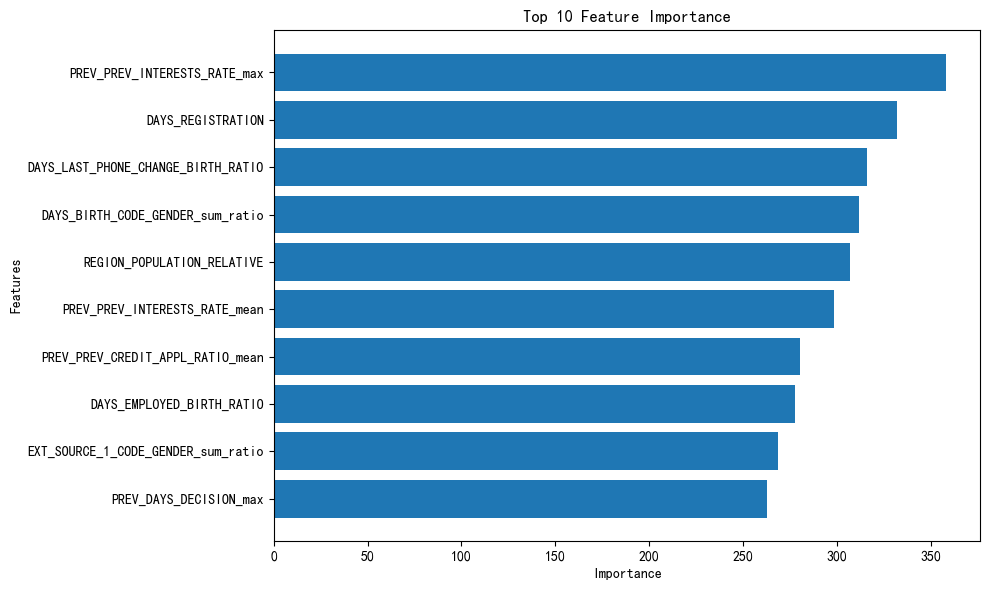

In [ ]:
df = feature_importances.sort_values(by='importance',ascending=False)
plot_feature_importances(df)

注意：
- 不是所有数据都适合使用focal loss，盲目的使用效果不一定就会更好
- focal loss 是出了名的不稳定，难调参，在当前的数据下，如果参数没调好，非常容易出现AUC一直是0.5的情况
- gamma和alpha参数需要根据数据的情况去进行调整，我这里使用的是论文里的建议初始参数
- 如果数据是多分类怎么办？多分类请参考下面的代码

### 2.2 Focal loss多分类Lgbm上的实现

In [56]:
import lightgbm as lgb
# 前面我们在自定义二分类损失函数时调用了sklearn的fit接口进行训练
# 接下来在实现多分类的时候，为了避免【不必要】的bug，我们使用lightgbm的原生接口train
# 在原生接口中，我们需要把自定义损失函数传给fobj，自定义评估指标传给feval
lgb.train?

Signature:
lightgbm.train(
    params: Dict[str, Any],
    train_set: lightgbm.basic.Dataset,
    num_boost_round: int = 100,
    valid_sets: Union[List[lightgbm.basic.Dataset], NoneType] = None,
    valid_names: Union[List[str], NoneType] = None,
    fobj: Union[Callable[[Union[List, numpy.ndarray], lightgbm.basic.Dataset], Tuple[Union[List, numpy.ndarray], Union[List, numpy.ndarray]]], NoneType] = None,
    feval: Union[Callable[[Union[List, numpy.ndarray], lightgbm.basic.Dataset], Tuple[str, float, bool]], List[Callable[[Union[List, numpy.ndarray], lightgbm.basic.Dataset], Tuple[str, float, bool]]], NoneType] = None,
    init_model: Union[str, pathlib.Path, lightgbm.basic.Booster, NoneType] = None,
    feature_name: Union[List[str], str] = 'auto',
    categorical_feature: Union[List[str], List[int], str] = 'auto',
    early_stopping_rounds: Union[int, NoneType] = None,
    evals_result: Union[Dict[str, Any], NoneType] = None,
    verbose_eval: Union[bool, int, str] = 'warn',
    lea

In [63]:
# 定义多分类问题的Focal Loss
# 由于我们使用的是train接口
# 所以之前模型传给函数的第二个参数y_ture会由之前的numpy数组变成lgb.Dataset实例
def focal_loss_lgb(y_pred, dtrain, alpha, gamma, num_class):
    """
    为lightgbm定义的Focal Loss

    参数：
    ------
    y_pred: numpy.ndarray
        预测值数组
    dtrain: lightgbm.Dataset
    alpha, gamma: float
        参见原始论文 https://arxiv.org/pdf/1708.02002.pdf
    num_class: int
        类别数量
    """
    a,g = alpha, gamma
    y_true = dtrain.label # 对于lightgbm.Dataset实例，我们需要使用这种方式才能获得真实标签
    # y_true = dtrain # 如果使用fit接口训练的话dtrain就是y_ture真实标签


    # 将y_true进行one-hot编码，得到N个观测值×num_class维度的数组
    y_true = np.eye(num_class)[y_true.astype('int')]# 使用花式索引从单位矩阵中选择与y_ture对应的行
                                # astype('int')：将y_true转换为整数类型
                                # y_true = [0,1,2,1,0]--->[0 1 2 1 0]
    # 花式索引示例：
    # np.eye(num_class)：(生成单位矩阵)  --->   np.eye(num_class)[0]:
                # [[1. 0. 0.]           --->                [[1. 0. 0.]]
                #  [0. 1. 0.]
                #  [0. 0. 1.]]

    # 将y_pred reshape为N个观测值×num_class维度的数组
    # order='F'表示列优先，这是为了兼容lightgbm的内部数据表示
    y_pred = y_pred.reshape(-1,num_class, order='F')
    # [[ 0  1  2  3]    ---> 1.列优先 [[0,8,1,9,2,10,3,11],
    #  [ 4  5  6  7]    --->          [4,12,5,13,6,14,7,15]]
    #  [ 8  9 10 11]    ---> 2.行优先 [[0,1,2,3,4,5,6,7],
    # [12 13 14 15]]    --->          [8,9,10,11,12,13,14,15]]


    # alpha和gamma的乘性因子与BCEWithLogitsLoss
    def fl(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * (( 1 - ( t*p + (1-t)*(1-p)) )**g) * ( t*np.log(p)+(1-t)*np.log(1-p) )
    partial_fl = lambda x: fl(x, y_true)
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    # 将结果转化为列优先（Fortran样式）顺序，兼容lightgbm的内部数据表示
    return grad.flatten('F'), hess.flatten('F')

以三分类为例的花式索引代码示例

In [85]:
num_class = 3
y_true = np.array([0,1,2,1,0])

# 生成一个3x3的单位矩阵
a = np.eye(num_class)
print(a)

[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


In [86]:
# 将y_true转换为整数类型
b = y_true.astype('int')
print(b)

[0 1 2 1 0]


In [87]:
# 利用花式索引从单位矩阵中选择与y_true相对应的行
c = a[b]
print(c)

[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]


In [ ]:
# 定义 Focal Loss 评估指标（损失值）
def focal_loss_lgb_eval_error(y_pred, dtrain, alpha, gamma, num_class):
    """
    为lightgbm定义的Focal Loss

    参数：
    ------
    y_pred: numpy.ndarray
        预测值数组
    dtrain: lightgbm.Dataset
    alpha, gamma: float
        参见原始论文 https://arxiv.org/pdf/1708.02002.pdf
    num_class: int
        类别数量
    """
    a,g = alpha, gamma
    y_true = dtrain.label
    # y_ture = dtrain
    # 将y_true进行one-hot编码
    y_true = np.eye(num_class)[y_true.astype('int')]
    # 将y_pred reshape为N个观测值×num_class维度的数组
    y_pred = y_pred.reshape(-1, num_class, order='F')
    p = 1/(1+np.exp(-y_pred))
    loss = -( a*y_true + (1-a)*(1-y_true) ) * (( 1 - ( y_true*p + (1-y_true)*(1-p)) )**g) * ( y_true*np.log(p)+(1-y_true)*np.log(1-p) )
    # 对损失进行平均
    return 'focal_loss', np.mean(loss), False

1. 在focal_loss_lgb和focal_loss_lgb_eval_error_sk函数中，增加了一个参数num_class，表示类别的数量。

2. 对y_true进行了one-hot编码，将其转化为一个N个观测值×num_class维度的数组，其中N表示观测值的数量，num_class表示类别的数量。

3. 对y_pred进行了reshape，将其转化为一个N个观测值×num_class维度的数组。

接下来，我们测试这个自定义损失函数的有效性：

In [59]:
# 导入一个4分类的数据集
# 手机价格范围price_range为标签
train_df = pd.read_csv("mobile_train.csv")
train_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [60]:
# 预处理
train_df.fillna(train_df.median(), inplace=True)
X = train_df
y = train_df['price_range']

In [64]:
num_class = 4
# 柯里化Currying
focal_loss = lambda preds, dtrain: focal_loss_lgb(preds, dtrain, 0.25, 2., num_class)
focal_loss_eval = lambda preds, dtrain: focal_loss_lgb_eval_error_sk(preds, dtrain, 0.25, 2., num_class)
# 定义5折交叉验证
kf = KFold(n_splits=5, shuffle=True, random_state=666)

# 使用5折交叉验证训练模型
for fold_idx, (train_idx, valid_idx) in enumerate(kf.split(X)):
    # 提取训练和验证数据
    X_train = X.iloc[train_idx, :]
    y_train = y.iloc[train_idx]
    X_valid = X.iloc[valid_idx, :]
    y_valid = y.iloc[valid_idx]
    
    # 封装数据集
    lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=True)
    lgb_eval = lgb.Dataset(X_valid, y_valid)

    # 设置弱学习器的数量num_boost_round，等价于n_estimators
    # 自定义损失函数和评估指标fobj=focal_loss, feval=focal_loss_eval
    params  = {'learning_rate':0.1, 'num_boost_round':1000, 'num_class':4}
    model = lgb.train(params, lgb_train, valid_sets=[lgb_eval], fobj=focal_loss, feval=focal_loss_eval,early_stopping_rounds=10)

[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1365
[LightGBM] [Info] Number of data points in the train set: 1600, number of used features: 21
[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's focal_loss: 0.0950566
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 


[36]	valid_0's focal_loss: 0.00186322
[37]	valid_0's focal_loss: 0.00167789
[38]	valid_0's focal_loss: 0.00151128
[39]	valid_0's focal_loss: 0.00136144
[40]	valid_0's focal_loss: 0.00122666
[41]	valid_0's focal_loss: 0.0011054
[42]	valid_0's focal_loss: 0.000996281
[43]	valid_0's focal_loss: 0.000898074
[44]	valid_0's focal_loss: 0.000809661
[45]	valid_0's focal_loss: 0.00073005
[46]	valid_0's focal_loss: 0.000658358
[47]	valid_0's focal_loss: 0.000593775
[48]	valid_0's focal_loss: 0.000535594
[49]	valid_0's focal_loss: 0.000483168
[50]	valid_0's focal_loss: 0.000435918
[51]	valid_0's focal_loss: 0.000393334
[52]	valid_0's focal_loss: 0.000354947
[53]	valid_0's focal_loss: 0.000320339
[54]	valid_0's focal_loss: 0.000289128
[55]	valid_0's focal_loss: 0.000260982
[56]	valid_0's focal_loss: 0.000235598
[57]	valid_0's focal_loss: 0.000212699
[58]	valid_0's focal_loss: 0.000192042
[59]	valid_0's focal_loss: 0.000173403
[60]	valid_0's focal_loss: 0.000156587
[61]	valid_0's focal_loss: 0.000

注意观察上述信息：[Info] Number of data points in the train set: 1600, number of used features: 21

这是因为我们使用了y_pred = y_pred.reshape(-1, num_class, order='F')。在每次交叉验证的折中，如果y_pred的元素数量不能被num_class整除，那么就会有剩余的样本没有被利用到，这意味着我们并没有充分使用整个数据集。因此，在进行多分类任务时，我们可以考虑使用train_test_split方法来确保所有的样本都被充分利用，同时我们也能得到一个独立的验证集用于评估模型性能。

**值得注意的是**，在上述情况下，如果使用sklearn的fit接口进行训练会直接报错，而不仅仅是警告。这也体现了LightGBM原生接口lgb.train的灵活性和包容性。相比之下，使用lgb.train，我们可以自定义损失函数和评估函数，并能更灵活地处理数据和模型训练的细节。

In [66]:
from sklearn.model_selection import train_test_split


X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=1)

# 多分类实现自定义损失函数需要调用lightgbm的原生接口train
# 因此我们需要封装数据集
lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=True)
lgb_eval = lgb.Dataset(X_valid, y_valid)

# 设置弱学习器的数量num_boost_round，等价于n_estimators
params  = {'learning_rate':0.1, 'num_boost_round':1000, 'num_class':num_class}
model = lgb.train(params, lgb_train, valid_sets=[lgb_eval], fobj=focal_loss, feval=focal_loss_eval,early_stopping_rounds=10)

c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
c:\ProgramData\Anaconda3\envs\ai\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1365
[LightGBM] [Info] Number of data points in the train set: 1600, number of used features: 21
[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's focal_loss: 0.0950566
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

### 2.3 利用 Focal Loss 对 Featuretools 衍生特征进行训练

In [89]:
# 读取数据
extra1_train = pd.read_csv('interesting_features_train.csv')
extra1_test = pd.read_csv('interesting_features_test.csv')

# 减少内存使用
reduce_mem_usage(extra1_train)
reduce_mem_usage(extra1_test).head()

In [90]:
extra2_train = pd.read_csv('timefeatures_train.csv')
extra2_test = pd.read_csv('timefeatures_test.csv')

reduce_mem_usage(extra2_train)
reduce_mem_usage(extra2_test).head()

可以看到featuretools衍生出来的特征里面是包含原始特征的，所以我们需要去除这些重复的特征，以便于后面加入模型进行训练

In [91]:
# Featuretools衍生的特征包含原始特征，需要去除重复的特征
# 因为两个表里面都包含了原始特征，所以读取原始文件，以便于更好的去除重复特征
original_train = pd.read_csv('application_train.csv')
original_test = pd.read_csv('application_test.csv')

In [92]:
extra1_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,SUM(previous.AMT_APPLICATION),SUM(previous.AMT_CREDIT),SUM(previous.AMT_DOWN_PAYMENT),SUM(previous.AMT_GOODS_PRICE),SUM(previous.CNT_PAYMENT),SUM(previous.HOUR_APPR_PROCESS_START),SUM(previous.RATE_DOWN_PAYMENT),SUM(previous.RATE_INTEREST_PRIMARY),SUM(previous.RATE_INTEREST_PRIVILEGED),SUM(previous.SELLERPLACE_AREA)
0,100002,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,1.790550e+05,179055.0,0.000000,1.790550e+05,24.0,9.0,0.000000,0.0,0.0,500.0
1,100003,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,1.306310e+06,1452573.0,6885.000000,1.306310e+06,30.0,44.0,0.100037,0.0,0.0,1599.0
2,100004,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,2.428200e+04,20106.0,4860.000000,2.428200e+04,4.0,5.0,0.212036,0.0,0.0,30.0
3,100006,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,2.449829e+06,2625259.5,69680.340088,2.449829e+06,138.0,132.0,0.326782,0.0,0.0,8048.0
4,100007,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,9.031815e+05,999832.5,6781.500000,9.031815e+05,124.0,74.0,0.319031,0.0,0.0,2455.0


用这种方法可以筛选出新衍生出来的特征，也就是原始特征里面没有的特征

In [93]:
# 从extra1_train中选择出那些不在original_train中的列
extra1_train.loc[:, ~extra1_train.columns.isin(original_train.columns)].head()

,COUNT(bureau),MAX(bureau.AMT_ANNUITY),MAX(bureau.AMT_CREDIT_MAX_OVERDUE),MAX(bureau.AMT_CREDIT_SUM),MAX(bureau.AMT_CREDIT_SUM_DEBT),MAX(bureau.AMT_CREDIT_SUM_LIMIT),MAX(bureau.AMT_CREDIT_SUM_OVERDUE),MAX(bureau.CNT_CREDIT_PROLONG),MAX(bureau.CREDIT_DAY_OVERDUE),MEAN(bureau.AMT_ANNUITY),...,SUM(previous.AMT_APPLICATION),SUM(previous.AMT_CREDIT),SUM(previous.AMT_DOWN_PAYMENT),SUM(previous.AMT_GOODS_PRICE),SUM(previous.CNT_PAYMENT),SUM(previous.HOUR_APPR_PROCESS_START),SUM(previous.RATE_DOWN_PAYMENT),SUM(previous.RATE_INTEREST_PRIMARY),SUM(previous.RATE_INTEREST_PRIVILEGED),SUM(previous.SELLERPLACE_AREA)
0,8,0.0,5043.64502,450000.000000,245781.0,31988.564453,0.0,0.0,0.0,0.0,...,1.790550e+05,179055.0,0.000000,1.790550e+05,24.0,9.0,0.000000,0.0,0.0,500.0
1,4,NaN,0.00000,810000.000000,0.0,810000.000000,0.0,0.0,0.0,NaN,...,1.306310e+06,1452573.0,6885.000000,1.306310e+06,30.0,44.0,0.100037,0.0,0.0,1599.0
2,2,NaN,0.00000,94537.796875,0.0,0.000000,0.0,0.0,0.0,NaN,...,2.428200e+04,20106.0,4860.000000,2.428200e+04,4.0,5.0,0.212036,0.0,0.0,30.0
3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.449829e+06,2625259.5,69680.340088,2.449829e+06,138.0,132.0,0.326782,0.0,0.0,8048.0
4,1,NaN,0.00000,146250.000000,0.0,0.000000,0.0,0.0,0.0,NaN,...,9.031815e+05,999832.5,6781.500000,9.031815e+05,124.0,74.0,0.319031,0.0,0.0,2455.0


In [32]:
# 筛选出新衍生的特征，即原始特征中没有的特征
extra1_train = extra1_train.loc[:, ~extra1_train.columns.isin(original_train.columns)]
extra1_test = extra1_test[extra1_train.columns.tolist()]

extra2_train = extra2_train.loc[:, ~extra2_train.columns.isin(original_train.columns)]
extra2_test = extra2_test[extra2_train.columns.tolist()]
extra2_train.head()

,"TREND(bureau.AMT_ANNUITY, bureau_credit_application_date)","TREND(bureau.AMT_CREDIT_MAX_OVERDUE, bureau_credit_application_date)","TREND(bureau.AMT_CREDIT_SUM, bureau_credit_application_date)","TREND(bureau.AMT_CREDIT_SUM_DEBT, bureau_credit_application_date)","TREND(bureau.AMT_CREDIT_SUM_LIMIT, bureau_credit_application_date)","TREND(bureau.AMT_CREDIT_SUM_OVERDUE, bureau_credit_application_date)","TREND(bureau.CNT_CREDIT_PROLONG, bureau_credit_application_date)","TREND(bureau.CREDIT_DAY_OVERDUE, bureau_credit_application_date)","TREND(previous.AMT_ANNUITY, previous_decision_date)","TREND(previous.AMT_APPLICATION, previous_decision_date)",...,"CUM_SUM(TREND(previous.AMT_APPLICATION, previous_decision_date))","CUM_SUM(TREND(previous.AMT_CREDIT, previous_decision_date))","CUM_SUM(TREND(previous.AMT_DOWN_PAYMENT, previous_decision_date))","CUM_SUM(TREND(previous.AMT_GOODS_PRICE, previous_decision_date))","CUM_SUM(TREND(previous.CNT_PAYMENT, previous_decision_date))","CUM_SUM(TREND(previous.HOUR_APPR_PROCESS_START, previous_decision_date))","CUM_SUM(TREND(previous.RATE_DOWN_PAYMENT, previous_decision_date))","CUM_SUM(TREND(previous.RATE_INTEREST_PRIMARY, previous_decision_date))","CUM_SUM(TREND(previous.RATE_INTEREST_PRIVILEGED, previous_decision_date))","CUM_SUM(TREND(previous.SELLERPLACE_AREA, previous_decision_date))"
0,0.0,0.313965,-96.421898,-69.786446,23.113249,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,0.000000,256.256500,0.000000,259.225372,0.0,0.0,0.0,48.84375,367.444763,...,367.444763,418.305450,NaN,367.444763,-0.001774,-0.000448,NaN,NaN,NaN,0.285154
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.09375,262.625946,...,630.070740,776.928345,NaN,1391.162842,0.045135,0.002064,NaN,NaN,NaN,-1.333402
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.84375,132.886597,...,762.957336,928.679810,NaN,1524.049316,0.055786,0.000891,NaN,NaN,NaN,-1.706613


这个时候我们就已经从featuretools衍生出来的数据中删除了原始特征，但是我们并不能保证extra1_train和extra2_train中没有重复的列，因此，为了保险起见，我们需要再进行一次筛选。

In [33]:
# 记录特征的名字
feature_names = list(set(original_train.columns) | set(extra1_train.columns) | set(extra2_train.columns))
len(feature_names)

598

In [34]:
# 将所有表拼接在一起
# 拼接的时候如果发现有重复的列，我们使用suffixes参数指定重复的列名拼接之后加上后缀'_RIGHT'
train_df = pd.merge(original_train,extra1_train,left_index=True,right_index=True,how='left', suffixes=('', '_RIGHT'))
train_df = pd.merge(train_df,extra2_train,left_index=True,right_index=True,how='left', suffixes=('', '_RIGHT'))

test_df = pd.merge(original_test,extra1_test,left_index=True,right_index=True,how='left', suffixes=('', '_RIGHT'))
test_df = pd.merge(test_df,extra2_test,left_index=True,right_index=True,how='left', suffixes=('', '_RIGHT'))

del extra1_train,extra1_test,extra2_train,extra2_test
gc.collect()

251

In [35]:
# 筛选出不重复的列
train_df = train_df[feature_names]
feature_names.remove('TARGET')
test_df = test_df[feature_names]

In [36]:
# 对object类型的特征进行编码
object_col = train_df.dtypes[train_df.dtypes == 'object'].index.to_list()
for col in object_col:
    if len(train_df[col].unique()) > 2:
        train_df = pd.concat([train_df, pd.get_dummies(train_df[col], prefix=col)], axis=1)
        train_df.drop(columns=[col], inplace=True)
    else:
        train_df[col] = pd.factorize(train_df[col])[0]

In [37]:
object_col = test_df.dtypes[test_df.dtypes == 'object'].index.to_list()
for col in object_col:
    if len(test_df[col].unique()) > 2:
        test_df = pd.concat([test_df, pd.get_dummies(test_df[col], prefix=col)], axis=1)
        test_df.drop(columns=[col], inplace=True)
    else:
        test_df[col] = pd.factorize(test_df[col])[0]

In [38]:
# 对齐训练集和测试集
train_labels = train_df['TARGET']
train_df, test_df = train_df.align(test_df, join = 'inner', axis = 1)
train_df['TARGET'] = train_labels

In [39]:
train_df.head()

,FLOORSMAX_AVG,EXT_SOURCE_1,STD(previous.AMT_GOODS_PRICE),CUM_SUM(LANDAREA_MEDI),STD(previous.RATE_INTEREST_PRIVILEGED),"CUM_SUM(TREND(bureau.AMT_CREDIT_SUM_DEBT, bureau_credit_application_date))",NONLIVINGAREA_MODE,"TREND(previous.AMT_DOWN_PAYMENT, previous_decision_date)",CUM_SUM(LIVINGAPARTMENTS_MEDI),"TREND(previous.TREND(credit.AMT_TOTAL_RECEIVABLE, credit_balance_date), previous_decision_date)",...,MODE(previous.NAME_CASH_LOAN_PURPOSE)_XAP,MODE(previous.NAME_CASH_LOAN_PURPOSE)_XNA,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,TARGET
0,0.0833,0.083037,NaN,0.037506,NaN,-69.786446,0.0,NaN,0.020493,NaN,...,1,0,0,0,0,0,0,0,1,1
1,0.2917,0.311267,424161.625000,0.050720,NaN,-69.786446,0.0,NaN,0.099182,NaN,...,1,0,0,1,0,0,0,0,0,0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0,0,1,0,0,0,0,0,0
3,NaN,NaN,253670.609375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,1,0,0,0,0,0,0,1,0
4,NaN,NaN,100585.984375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,1,0,0,0,0,1,0,0,0


In [42]:
def sigmoid(x):
    """
    Sigmoid函数，用于转换预测结果为概率
    """
    return 1. / (1. + np.exp(-x))
def focal_fit(train_df=train_df, test_df=test_df):
    # 清洗列名，去除可能导致错误的特殊字符
    train_df.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in train_df.columns]
    test_df.columns = [feature.replace(':', '').replace('"', '').replace('\\', '').replace(' ', '_').replace(',','_') for feature in test_df.columns]
    
    # 划分训练集的特征和标签
    X_train = train_df.drop(['SK_ID_CURR', 'TARGET'], axis=1)
    y_train = train_df['TARGET']

    # 初始化交叉验证策略
    folds = KFold(n_splits=5, shuffle=True, random_state=666)
    
    # 创建用于存储预测结果的数组
    oof_preds = np.zeros(y_train.shape[0])
    test_preds = np.zeros(test_df.shape[0])

    # 提取特征名称
    feature_names = list(X_train.columns)

    # 创建一个数组用于存储特征的重要性
    feature_importance_values = np.zeros(len(feature_names))

    # 初始化 LGBM 模型
    focal_loss_model = LGBMClassifier(
        objective=focal_loss,
        n_estimators=10000,
        learning_rate=0.02,
        max_depth=-1,
        num_leaves=30,
        colsample_bytree=1.0,
        subsample=1,
        subsample_freq=1,
        reg_alpha=0.0,
        reg_lambda=100,
        min_child_samples=70,
        verbose=-1,
        early_stopping_round=200,
    )

    # 五折交叉验证
    for fold_idx, (train_idx, valid_idx) in enumerate(folds.split(X_train)):
        # 提取训练数据和验证数据
        X = X_train.iloc[train_idx, :]
        y = y_train.iloc[train_idx]
        valid_X = X_train.iloc[valid_idx, :]
        valid_y = y_train.iloc[valid_idx]

        # 训练模型
        focal_loss_model.fit(X, y, eval_set=[(X, y), (valid_X, valid_y)], eval_metric=eval_auc)

        # 记录特征重要性
        feature_importance_values += focal_loss_model.feature_importances_ / folds.n_splits

        # 预测验证集和测试集
        oof_preds[valid_idx] = sigmoid(focal_loss_model.predict_proba(valid_X, num_iteration=focal_loss_model.best_iteration_))
        test_preds += sigmoid(focal_loss_model.predict_proba(test_df[feature_names], num_iteration=focal_loss_model.best_iteration_)) / folds.n_splits

    # 计算训练集的 AUC 分数
    valid_auc = roc_auc_score(y_train, oof_preds)
    
    # 创建特征重要性数据框
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})

    # 保存测试集预测结果
    test_df['TARGET'] = test_preds

    # 返回验证 AUC 分数、特征重要性以及测试集预测结果
    return valid_auc, feature_importances, test_df[['SK_ID_CURR','TARGET']]

In [43]:
valid_auc,feature_importance,submission = focal_fit()

[1]	training's binary_logloss: 2.79862	training's focal_auc: 0.50136	valid_1's binary_logloss: 2.6827	valid_1's focal_auc: 0.500788
[2]	training's binary_logloss: 2.78609	training's focal_auc: 0.50136	valid_1's binary_logloss: 2.67012	valid_1's focal_auc: 0.500788
[3]	training's binary_logloss: 2.77386	training's focal_auc: 0.50136	valid_1's binary_logloss: 2.65785	valid_1's focal_auc: 0.500788
[4]	training's binary_logloss: 2.76191	training's focal_auc: 0.50136	valid_1's binary_logloss: 2.64586	valid_1's focal_auc: 0.500788
[5]	training's binary_logloss: 2.75023	training's focal_auc: 0.502025	valid_1's binary_logloss: 2.63414	valid_1's focal_auc: 0.500873
[6]	training's binary_logloss: 2.73882	training's focal_auc: 0.571112	valid_1's binary_logloss: 2.62269	valid_1's focal_auc: 0.562534
[7]	training's binary_logloss: 2.72767	training's focal_auc: 0.572611	valid_1's binary_logloss: 2.61151	valid_1's focal_auc: 0.563343
[8]	training's binary_logloss: 2.71676	training's focal_auc: 0.5787

In [44]:
# 本地验证成绩为0.548
valid_auc

0.548775500227821

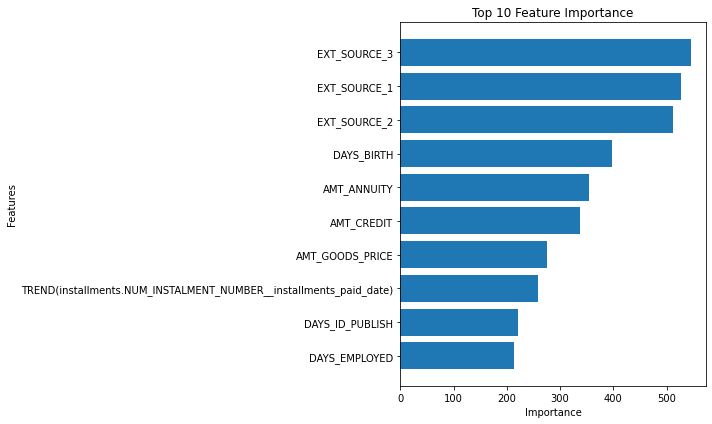

In [45]:
plot_feature_importances(feature_importance.sort_values(by='importance',ascending=False))

In [46]:
submission.to_csv('featuretools.csv',index=False) # 0.77221

## 3 Leaking Usage：重复申请人漏洞

数据泄露（Data Leakage）是指在模型训练过程中，模型接触到了本不应该得知的信息，这使得模型在训练和测试数据上的表现优于实际应用场景。这通常是需要避免的，因为它会导致过度乐观的模型评估。但在数据竞赛中，如果能发现并利用数据泄露，就可能获取更好的成绩。

在这个问题中，存在一个特殊的数据泄露，我们称之为“重复申请人”泄漏。这是因为数据集中的一部分样本实际上是由同一位申请人在不同的时间提交的，这些申请之间是有相关性的：如果一个申请人在上一次申请的时候就违约了，那么他这次申请也很有可能是违约的。我们可以使用这种相关性来提高模型的预测准确性。

下面的代码就是实现这个策略的步骤：

In [532]:
# 导入训练集和测试集
train = pd.read_csv('./application_train.csv')
test = pd.read_csv('./application_test.csv')
# 合并数据集
application = train.append(test)
del train, test
gc.collect()

245

找出重复申请人：虽然日期是相对于申请时间的，但对于同一个人来说时间差是一样的

In [533]:
# 计算新的特征
application['REGIS_BIRTH_DIFF'] = application.eval('DAYS_REGISTRATION - DAYS_BIRTH') # 注册日期与出生日期的差值
# 上面的代码等价于application['REGIS_BIRTH_DIFF'] = application['DAYS_REGISTRATION'] - application['DAYS_BIRTH']
# 只是eval函数可以加速运算
application['ID_PUBLISH_BIRTH_DIFF'] = application.eval('DAYS_ID_PUBLISH - DAYS_BIRTH') # 身份证发布日期与出生日期的差值

In [534]:
# 如果性别、城市人口比例、DAYS_REGISTRATION - DAYS_BIRTH、DAYS_ID_PUBLISH - DAYS_BIRTH都一样
# 认为就是同一个用户的不同申请
personal_info = ['CODE_GENDER', 'REGION_POPULATION_RELATIVE', 'REGIS_BIRTH_DIFF', 'ID_PUBLISH_BIRTH_DIFF']

In [535]:
application[personal_info].head()

,CODE_GENDER,REGION_POPULATION_RELATIVE,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF
0,M,0.018801,5813.0,7341
1,F,0.003541,15579.0,16474
2,M,0.010032,14786.0,16515
3,F,0.008019,9172.0,16568
4,M,0.028663,15621.0,16474


In [536]:
# 统计每一种组合出现的次数，也就是每一个申请人的申请次数
# 因为我们需要知道这样子一共能筛选出多少重复申请人
user_count = application[personal_info].groupby(personal_info).size().sort_values(ascending=False).reset_index()
user_count.head()

,CODE_GENDER,REGION_POPULATION_RELATIVE,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF,0
0,M,0.035792,5905.0,7940,5
1,F,0.022625,12226.0,16858,3
2,F,0.046220,6346.0,9569,3
3,F,0.030755,6218.0,9930,3
4,F,0.005084,10819.0,17246,3


In [537]:
user_count.shape

(347078, 5)

In [538]:
# 为每一种组合分配一个唯一的id，这个id就是我们认为的用户的id
user_count['user_id'] = np.arange(0, 347078)
user_count.drop(0, axis=1,inplace=True)
user_count.head()

,CODE_GENDER,REGION_POPULATION_RELATIVE,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF,user_id
0,M,0.035792,5905.0,7940,0
1,F,0.022625,12226.0,16858,1
2,F,0.046220,6346.0,9569,2
3,F,0.030755,6218.0,9930,3
4,F,0.005084,10819.0,17246,4


In [539]:
# 将这个id合并回原始数据，这样每个申请就有了一个用户id
application = application.merge(user_count, on=personal_info, how='left')
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF,user_id
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,5813.0,7341,169639
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,15579.0,16474,237795
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

到这里，我们已经找到了重复申请人，并且给他们分配了唯一的用户id。但问题是，我们应该如何利用这个信息呢？一种可能的策略是，如果一个申请人在上一次申请中违约了，那么他在这次申请中也有很高的可能性会违约。我们可以按照这个策略来生成一个新的特征。

In [540]:
application[application['user_id']==9012]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF,user_id
294164,440794,1.0,Cash loans,F,N,N,0,202500.0,508495.5,22527.0,454500.0,Family,Working,Secondary / secondary special,Married,House / apartment,0.018029,-19297,-2189,-9576.0,-2758,NaN,1,1,1,1,1,0,Sales staff,2.0,3,3,WEDNESDAY,8,0,0,0,0,0,0,Self-employed,NaN,0.481647,0.336062,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-397.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,9721.0,16539,9012
311815,130774,NaN,Cash loans,F,N,Y,0,121500.0,561393.0,21163.5,463500.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.018029,-19434,-2326,-9713.0,-2895,NaN,1,1,0,1,0,0,Sales staff,1.0,3,3,TUESDAY,10,0,0,0,0,0,0,Self-employed,NaN,0.622390,0.445396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,-534.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0,9721.0,16539,9012


In [541]:
# 根据用户id和出生日期（DAYS_BIRTH）排序，这样同一个用户的申请会被放在一起，且最近的申请会被放在最下面
application.sort_values(by=['user_id','DAYS_BIRTH'], inplace=True, ascending=False)
application[['SK_ID_CURR','TARGET','user_id','DAYS_BIRTH'] + personal_info][application['user_id']==9012]

,SK_ID_CURR,TARGET,user_id,DAYS_BIRTH,CODE_GENDER,REGION_POPULATION_RELATIVE,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF
294164,440794,1.0,9012,-19297,F,0.018029,9721.0,16539
311815,130774,NaN,9012,-19434,F,0.018029,9721.0,16539


In [542]:
application[application['user_id']==9012].groupby('user_id')['TARGET'].shift(1)

294164    NaN
311815    1.0
Name: TARGET, dtype: float64

In [543]:
# 对每个用户的申请，我们把上一次的申请的TARGET值记录下来，作为这次申请的一个新特征
application['lag_target']=application[['user_id', 'TARGET']].groupby('user_id')['TARGET'].shift(1)

In [544]:
# 例如我们查看user_id为9012的用户，他有两次申请记录，第二次申请在测试集里
application[['SK_ID_CURR','TARGET','user_id','DAYS_BIRTH','lag_target']][application['user_id']==9012]

,SK_ID_CURR,TARGET,user_id,DAYS_BIRTH,lag_target
294164,440794,1.0,9012,-19297,NaN
311815,130774,NaN,9012,-19434,1.0


这个新特征lag_target的含义是，用户的上一次申请是否违约。我们可以使用这个特征来预测用户这次的申请是否会违约。如果不放心，可以先在训练集中验证这种筛选的合理性。

In [546]:
# 计算在训练数据中，`lag_target`和`TARGET`的关系
application[application['TARGET'].notna()].groupby('lag_target')['TARGET'].mean()

lag_target
0.0    0.066692
1.0    0.819588
Name: TARGET, dtype: float64

在上述代码中，我们计算了当用户的上一次申请违约时（lag_target为1），这次申请违约的概率。这可以帮助我们理解这个新特征的预测能力。

在预测测试数据时，我们可以把那些上一次申请违约的用户的这次申请的预测值设为1，这样可以提高模型的预测性能。

In [547]:
# 找到测试集中上一次申请违约的用户的这次申请
test = application[(application['TARGET'].isna()) & (application['lag_target'] == 1)]

In [548]:
# 检查筛选结果
test.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,REGIS_BIRTH_DIFF,ID_PUBLISH_BIRTH_DIFF,user_id,lag_target
311815,130774,NaN,Cash loans,F,N,Y,0,121500.0,561393.0,21163.5,463500.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.018029,-19434,-2326,-9713.0,-2895,NaN,1,1,0,1,0,0,Sales staff,1.0,3,3,TUESDAY,10,0,0,0,0,0,0,Self-employed,NaN,0.622390,0.445396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,-534.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0,9721.0,16539,9012,1.0
310339,119813,NaN,Cash loans,M,Y,N,1,180000.0,104256.0,12370.5,90000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.018801,-13866,-492,-3969.0,-2922,20.0,1,1,0,1,0,0,Drivers,3.0,2,2,MONDAY,9,0,0,0,0,0,0,Business Entity Type 3,NaN,0.484099,0.210350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,0.0,5.0,0.0,-684.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,3.0,9897.0,10944,8773,1.0
340165,337779,NaN,Cash loans,M,N,Y,0,180000.0,266652.0,21195.0,202500.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.030755,-20200,365243,-10383.0,-3711,NaN,1,0,0,1,0,0,NaN,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,XNA,NaN,0.581304,0.392774,0.167,0.0773,0.9856,0.8028,0.0034,0.08,0.069,0.3333,0.375,0.015,0.1345,0.0886,0.0077,0.0658,0.1702,0.0802,0.9856,0.8105,0.0035,0.0806,0.069,0.3333,0.375,0.0153,0.1469,0.0923,0.0078,0.0696,0.1686,0.0773,0.9856,0.8054,0.0035,0.08,0.069,0.3333,0.375,0.0152,0.1368,0.0902,0.0078,0.0672,reg oper account,block of flats,0

In [549]:
# 读取模型预测的结果
res = pd.read_csv('./final_lgb.csv')

<AxesSubplot:>

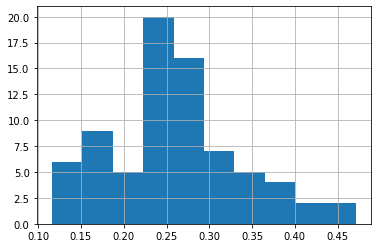

In [550]:
# 可以看到原模型输出的值是比较小的，即便通过上面的分析，我们认为这部分人违约的可能性会很大
res[res['SK_ID_CURR'].isin(test['SK_ID_CURR'])]['TARGET'].hist()

In [551]:
# 因此，我们将这些用户的这次申请的预测值设为1
res.loc[res['SK_ID_CURR'].isin(test['SK_ID_CURR']), 'TARGET'] = 1.0

In [552]:
# 保存预测结果
res.to_csv('./666.csv', index=False)# 0.80125 私榜排名21，金牌成绩

上述代码展示了如何使用lag_target特征来改进模型预测的结果。你可以看到，这种方法可以显著提高模型在私榜的表现。

## 4 单模Optuna贝叶斯优化精调

- **逻辑回归**

In [ ]:
# ! pip install optuna -i https://pypi.douban.com/simple/

Looking in indexes: https://pypi.douban.com


ERROR: Could not find a version that satisfies the requirement optuna (from versions: none)
ERROR: No matching distribution found for optuna


In [553]:
import pandas as pd
import numpy as np
import optuna
from optuna.samplers import RandomSampler, GridSampler, TPESampler
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV, cross_val_score
from scipy.misc import derivative
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer
from sklearn.linear_model import LogisticRegression
from optuna.visualization import plot_optimization_history

In [554]:
apply = pd.read_csv('apply.csv')
# 划分训练集和测试集
test_df = apply[apply['TARGET'].isnull()]
test_df = test_df.drop('TARGET', axis = 1)
train_df = apply[~apply['TARGET'].isnull()]
y_train = train_df['TARGET']

In [555]:
def missing (df):
    """
    计算每一列的缺失值及占比
    """
    missing_number = df.isnull().sum().sort_values(ascending=False)              # 每一列的缺失值求和后降序排序                  
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)          # 每一列缺失值占比
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])      # 合并为一个DataFrame
    return missing_values

In [556]:
missing_data = missing(train_df)
useless_names = missing_data.loc[missing_data['Missing_Percent']>=0.8].index.tolist()
useless_names[:10]

['BUREAU_12M_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_min',
 'BUREAU_12M_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_max',
 'BUREAU_12M_DAYS_CREDIT_ENDDATE_ENDATE_FACT_DIFF_mean',
 'BUREAU_6M_AMT_CREDIT_MAX_OVERDUE_mean',
 'BUREAU_6M_AMT_CREDIT_MAX_OVERDUE_max',
 'BUREAU_12M_DAYS_ENDDATE_FACT_min',
 'BUREAU_12M_DAYS_ENDDATE_FACT_mean',
 'BUREAU_12M_DAYS_ENDDATE_FACT_max',
 'BUREAU_12M_DAYS_CREDIT_ENDDATE_FACT_DIFF_mean',
 'BUREAU_12M_DAYS_CREDIT_ENDDATE_FACT_DIFF_max']

In [558]:
# 尝试一下把缺失值占比80%以上的列都删掉
train_df = train_df.drop(columns=useless_names)
features = list(train_df.columns)
features.remove('TARGET')
test_df = test_df[features]

In [559]:
X_train = train_df.drop(['SK_ID_CURR', 'TARGET'], axis=1)

In [560]:
# 用NaN替换正无穷大值
X_train[X_train == np.inf] = np.nan
test_df[test_df == np.inf] = np.nan

# 用NaN替换负无穷大值
X_train[X_train == -np.inf] = np.nan
test_df[test_df == -np.inf] = np.nan

In [561]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
# 记录一下特征的名字
features = list(X_train.columns)

# 缺失值的中位数填充
imputer = SimpleImputer(strategy = 'median')

# 将每个特征缩放到0-1之间
scaler = MinMaxScaler(feature_range = (0, 1))

# 在训练数据上进行填充
imputer.fit(X_train.append(test_df[features]))
X_train = imputer.transform(X_train)

X_train = pd.DataFrame(X_train,columns=features)
# 使用相同的缩放器对数据进行缩放
scaler.fit(X_train.append(test_df[features]))
X_train = scaler.transform(X_train)

print('训练数据的形状 ', X_train.shape)

 训练数据的形状  (307505, 1708)


接下来，定义一个目标函数，优化逻辑回归模型的超参数，从而提高其在交叉验证中的roc_auc_score指标

In [563]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, roc_auc_score
from optuna import Trial

# 定义Logistic_objective，接受每一次优化实验
def Logistic_objective(trial: Trial):
    # 从调参空间中选择参数
    penalty = trial.suggest_categorical("penalty", ["l2"])
    tol = trial.suggest_float("tol", 0.0001, 0.0002, log=True)
    C = trial.suggest_float("C", 0.00035, 0.0005, log=True)
    fit_intercept = trial.suggest_categorical("fit_intercept", [True])
    solver = trial.suggest_categorical("solver", ["lbfgs"])

    # 创建Logistic回归模型
    clf = LogisticRegression(
        penalty=penalty,
        tol=tol,
        C=C,
        fit_intercept=fit_intercept,
        solver=solver,
        random_state=2022,  # 用于重现结果
        class_weight='balanced',
        verbose=-1,  # 日志输出
        n_jobs=-1,  # 并行计算
    )

    # 定义StratifiedKFold对象
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=2022)

    # 定义评分函数对象，这里使用roc_auc_score
    scoring = make_scorer(roc_auc_score, greater_is_better=True)

    # 计算交叉验证得分
    auc_score = cross_val_score(clf, X_train, y_train, scoring=scoring, cv=skf).mean()
    
    return auc_score

In [ ]:
# 创建一个study对象，用于管理超参数优化过程。direction='maximize'表示我们希望最大化目标函数的值。
study = optuna.create_study(direction='maximize')

# 调用study对象的optimize方法，执行超参数优化
study.optimize(Logistic_objective, n_trials=10)

[I 2023-06-20 12:36:14,959] A new study created in memory with name: no-name-6a195a95-7768-4e1f-b4b5-ee2bf1af7765


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  1.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  1.1min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  1.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  1.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  1.2min finished
[I 2023-06-20 12:42:50,484] Trial 0 finished with value: 0.697019475581939 and parameters: {'penalty': 'l2', 'tol': 0.00011525225063384917, 'C': 0.0003541289185710365, 'fit_intercept': True, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.697019475581939.
[P

Optuna是一个自动化的超参数优化工具，它可以帮助我们找到最优的模型参数。在我们使用Optuna进行调参的过程中，可能会遇到一些问题，比如返回的NaN值。这是一个相对常见的问题，可能有以下几个原因：

1. 数据中包含NaN或Inf等值：这是一个常见的数据清洗问题。我们的模型依赖于我们的输入数据，如果输入数据包含无效或不合适的值，如NaN或无穷大的值，那么模型就可能无法正常工作。我们需要在建模之前确保数据清洗得当，没有这样的值。

2. 模型无法收敛：这是模型训练过程中可能遇到的问题。逻辑回归模型通过迭代的方式不断优化其参数以最小化损失函数，但是如果学习率过大或者数据的尺度不一致，那么模型可能无法找到一个稳定的解，也就是说模型无法收敛。我们可以通过调整学习率或者在训练之前对数据进行归一化或标准化来解决这个问题。

3. 完全分离的数据：在某些情况下，一个或多个特征能够完全区分正样本和负样本。<br>举个例子，假设我们有一个二分类问题，特征X和标签Y的关系如下：
<center>X = [0, 0, 0, 1, 1, 1]<br>
Y = [0, 0, 0, 1, 1, 1]</center>

&emsp;&emsp;这在逻辑回归模型中可能会引起问题。比如一个特征在正样本中的值总是大于在负样本中的值，模型会倾向于将这个特征的权重提升到无穷大，以便能够完全正确地分类所有样本。然而这会导致模型的稳定性问题，可能会返回NaN或者无法收敛。我们通常需要对这类特征进行一些处理，比如加入一些噪声，或者采用一些可以处理完全分离数据的非线性模型，如支持向量机、树模型。

&emsp;&emsp;小伙伴在使用Optuna进行参数调整时，如果遇到了NaN的问题，可以根据这些原因来进行排查和解决问题。

In [ ]:
print(study.best_params)# 0.6985

{'penalty': 'l2', 'tol': 0.00010936469693767362, 'C': 0.0004856051125168555, 'fit_intercept': True, 'solver': 'lbfgs'}


In [ ]:
optuna.__version__

'3.2.0'

In [ ]:
# 这个库需要单独安装，可以支持可视化
! pip install optuna[visualization]

  Using cached optuna-3.2.0-py3-none-any.whl (390 kB)


ERROR: Could not install packages due to an OSError: [WinError 5] 拒绝访问。: 'c:\\programdata\\anaconda3\\lib\\site-packages\\__pycache__\\typing_extensions.cpython-39.pyc'
Consider using the `--user` option or check the permissions.



  Using cached colorlog-6.7.0-py2.py3-none-any.whl (11 kB)
  Using cached cmaes-0.9.1-py3-none-any.whl (21 kB)
  Using cached alembic-1.11.1-py3-none-any.whl (224 kB)
  Using cached typing_extensions-4.6.3-py3-none-any.whl (31 kB)
  Using cached Mako-1.2.4-py3-none-any.whl (78 kB)
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 3.10.0.2
    Uninstalling typing-extensions-3.10.0.2:


In [ ]:
# ! pip install nbformat -i https://pypi.douban.com/simple/

In [ ]:
import nbformat
nbformat.__version__

'5.8.0'

In [ ]:
# ! pip install plotly

In [ ]:
import plotly
plotly.__version__

'5.14.1'

In [ ]:
# 绘制优化历史图，显示目标函数值随着试验次数的变化情况
optuna.visualization.plot_optimization_history(study)

In [ ]:
# 绘制参数重要性图，显示各个超参数对目标函数值的影响程度
# 由此我们可以更好的确定参数空间
optuna.visualization.plot_param_importances(study)

In [ ]:
# 绘制超参数搜索空间的切片，显示'C'和'tol'两个超参数对目标函数值的影响
# 颜色越浅表示实验越早进行
optuna.visualization.plot_slice(study, params=['C', 'tol'])

- **lightgbm**

In [ ]:
import lightgbm as lgb

Optuna + lgb + focal loss调参

In [ ]:
def focal_loss_lgb_sk(y_true, y_pred, alpha, gamma):
    a, g = alpha, gamma

    def fl(x, t):
        p = 1 / (1 + np.exp(-x))
        return -((a * t + (1 - a) * (1 - t)) * ((1 - (t * p + (1 - t) * (1 - p))) ** g) * (t * np.log(p) + (1 - t) * np.log(1 - p)))

    partial_fl = lambda x: fl(x, y_true)
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    return grad, hess

In [ ]:
# 初始化
focal_loss = lambda x,y: focal_loss_lgb_sk(x, y, 0.25, 2.)
def opt_lgb(trial):    
    num_leaves = trial.suggest_int("num_leaves", 10,100, 1)
    subsample =  trial.suggest_float('subsample',0.6,1.0,log=False)
    subsample_freq = trial.suggest_int('subsample_freq',1,5,1)
    colsample_bytree = trial.suggest_float('colsample_bytree',0.8,1.0,log=False)
    reg_lambda = trial.suggest_int("reg_lambda", 1, 100, 1)
    reg_alpha = trial.suggest_int("reg_alpha", 1, 100, 1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 100, 1)
    skf= StratifiedKFold(n_splits=5, random_state=666, shuffle=True)
    clf  = lgb.LGBMClassifier(
        objective=focal_loss,
        max_depth=-1,
        random_state=666,
        learning_rate=0.02,
        n_estimators=10000,
        num_leaves = num_leaves,
        subsample=subsample,
        subsample_freq=subsample_freq,
        colsample_bytree=colsample_bytree,
        min_child_weight=min_child_weight,
        reg_lambda=reg_lambda,
        reg_alpha=reg_alpha,
        verbose=-1
        )
    scoring = make_scorer(roc_auc_score, greater_is_better=True) 
    return cross_val_score(
        clf, X_train, y_train,scoring=scoring,cv=skf).mean()

In [ ]:
study_lgb = optuna.create_study(direction='maximize')

[I 2023-07-23 18:51:01,678] A new study created in memory with name: no-name-71d61dc1-57d1-453d-ac45-fc825b469931


In [ ]:
study_lgb.optimize(opt_lgb, n_trials=10)

[I 2023-07-23 21:54:05,047] Trial 0 finished with value: 0.5 and parameters: {'num_leaves': 54, 'subsample': 0.9023798131966922, 'subsample_freq': 3, 'colsample_bytree': 0.8142200777700817, 'reg_lambda': 4, 'reg_alpha': 56, 'min_child_weight': 31}. Best is trial 0 with value: 0.5.
[I 2023-07-24 00:49:47,769] Trial 1 finished with value: 0.5 and parameters: {'num_leaves': 18, 'subsample': 0.9732356429240294, 'subsample_freq': 2, 'colsample_bytree': 0.9073196459237116, 'reg_lambda': 63, 'reg_alpha': 61, 'min_child_weight': 34}. Best is trial 0 with value: 0.5.
[I 2023-07-24 08:40:52,127] Trial 2 finished with value: 0.7884246033255857 and parameters: {'num_leaves': 56, 'subsample': 0.6061311528154582, 'subsample_freq': 2, 'colsample_bytree': 0.9990298028230663, 'reg_lambda': 91, 'reg_alpha': 4, 'min_child_weight': 24}. Best is trial 2 with value: 0.7884246033255857.
[I 2023-07-24 11:10:07,417] Trial 3 finished with value: 0.5 and parameters: {'num_leaves': 78, 'subsample': 0.962370500286

In [ ]:
study_lgb.best_params #0.7969

{'num_leaves': 19,
 'subsample': 0.7877310637563023,
 'subsample_freq': 3,
 'colsample_bytree': 0.882259368699227,
 'reg_lambda': 22,
 'reg_alpha': 16,
 'min_child_weight': 80}

In [ ]:
# 绘制参数重要性图，显示各个超参数对目标函数值的影响程度
optuna.visualization.plot_param_importances(study_lgb)

## 5 逆向工程与无限融合

### 5.1 逆向工程Reverse Engineering

在kaggle竞赛领域，逆向工程是指根据已有的数据或模型，推断出其背后的逻辑、规律、特征或参数等信息，以便改进、优化或复现原始的数据或模型。逆向工程的目的可能是为了提高分数、学习新技术、解决实际问题或者满足好奇心等。

逆向工程（Reverse Engineering）在机器学习竞赛中扮演着一个非常重要的角色，它涉及对预测结果和模型行为的深入理解。通过探索和利用竞赛中的信息泄露、评价标准的特性、或是数据的特定模式，我们可以进一步优化模型以达到更好的表现。此外，逆向工程也常常与模型融合（Model Fusion）相结合，通过有效地结合不同模型的预测结果，可以产生更强大的预测能力。

在我们的工作中，我们利用了逆向工程和模型融合的思想进行了无限融合。首先，我们构建了多个独立的模型，包括逻辑回归模型（default_model_log_reg.csv）、基于特征工程的模型（featuretools.csv）以及基于LightGBM的模型（focal_lgb.csv），每个模型都生成了一组预测结果。

然后，我们开始进行模型融合。我们的策略是对这些模型的预测结果进行加权平均，其中权重是根据模型的性能和特性进行手动调整的。在这个过程中，我们多次提交预测结果，并根据每次提交的成绩来调整权重，以此达到最优的融合效果。此外，我们同时将重复申请人的预测结果设为1.0。

通过这种方式，我们实现了无限融合，每次提交的成绩都比上一次有所提升。在多次尝试和调整后，我们最终取得了0.80279的成绩，这是我们之前所有模型中最好的成绩。这表明逆向工程和模型融合是一种有效的提升模型性能的策略，它可以帮助我们充分利用每个模型的优点，同时减少各自的不足。

In [65]:
# 加载三个模型的预测结果
sub1 = pd.read_csv('default_model_log_reg.csv') # 逻辑回归模型
sub2 = pd.read_csv('featuretools.csv') # 基于featuretools的模型
sub5 = pd.read_csv('focal_lgb.csv') # 基于LightGBM的模型

In [104]:
# 加载重复申请人的数据
test = pd.read_csv('duplicate_id.csv')

In [105]:
test

,SK_ID_CURR
0,130774
1,119813
2,337779
3,288879
4,207304
...,...
71,300411
72,108522
73,233512
74,401230


In [67]:
# 创建新的DataFrame用于存储最终的预测结果
result = pd.DataFrame()
result['SK_ID_CURR'] = sub1.SK_ID_CURR

In [68]:
# 将三个模型的预测结果进行加权平均
# 对于重复申请人，我们假设他们的违约概率为1，因此直接将预测结果设为1
result['TARGET'] = 1.1*(0.7*sub5.TARGET + 0.3*sub2.TARGET) - 0.1*sub1.TARGET
result.loc[result['SK_ID_CURR'].isin(test['SK_ID_CURR']), 'TARGET'] = 1.0

In [69]:
result.TARGET.max()

1.0

In [70]:
result.TARGET.min()

0.12636886095172792

In [71]:
# 如果做减法的话最小值可能会小于0，这个时候就把最小值设置为0
# result.loc[result['TARGET'] < 0, 'TARGET'] = 0

In [72]:
result.to_csv('sub.csv',index=False) # 0.80279 排名15名

### 5.2 结果提交与最终排名

In [73]:
# 读取数据
sub1 = pd.read_csv('d_80173.csv')
sub2 = pd.read_csv('T_79898.csv')
sub3 = pd.read_csv('c_79602.csv')
sub4 = pd.read_csv('w_79849.csv')
sub5 = pd.read_csv('心徙_80175.csv')
# 工作流
sub = pd.DataFrame()
result = pd.DataFrame()
sub['SK_ID_CURR'] = sub1.SK_ID_CURR
result['SK_ID_CURR'] = sub1.SK_ID_CURR
# 0.80408
result['TARGET'] = 0.8*(0.95*(0.7*(0.5*sub5.TARGET + 0.5*sub1.TARGET) + 0.3*sub2.TARGET) + 0.05*sub3.TARGET) + 0.2*sub4.TARGET
result.to_csv('submission.csv',index=False)

![图片3](https://fufanshare.oss-cn-beijing.aliyuncs.com/Ethan/HomeCredit%E8%AF%BE%E4%BB%B6%E5%9B%BE%E7%89%87%E5%90%88%E8%BE%91/03.png)

## **【总结】写在最后**

恭喜把课程看到最后的小伙伴，你们已经成功完成了整个金融案例的学习，在这个过程中，我相信你一定收获颇丰：

1. 主表探索阶段，我们遇到了众多的缺失值和异常值。对于没有完全脱敏的数据来说，我们并不能一股脑用众数或者中位数去填充，而是要思考和探索这部分缺失值和异常值是不是代表了一众特殊群体；对于部分完全脱敏的数据，我们则是可以通过画热力图来判断这部分脱敏数据可能和业务上有什么样的关联。在这个案例当中，我们可以查看平均违约率以及画核函数密度估计图来判断这类群体是否比较特殊。

2. 建立baseline阶段，我们发现lightgbm不愧是竞赛利器，其在速度和效果上都相当出色。在后续的竞赛和项目中，小伙伴们都可以优先考虑使用它。同时，如果在建模过程中遇到内存不足的问题，可以考虑使用polars库、列存储格式parquet、优化数据类型或扩大虚拟内存来解决。

3. 在主表特征工程阶段，我们创造了一系列领域特征，包括贷款利率、还款压力、供养压力和一些稳定性指标等。相信在面对其他金融信贷赛题时，小伙伴们能够灵活运用这些技巧。此外，我们还对在baseline中表现好的特征进行了一些基础的统计特征衍生，并且我们还讨论了如何进行Leaking-proof式目标编码，我相信应该能对小伙伴们未来处理分类问题带来巨大的启发。

4. 在附表的衍生阶段，我们使用聚合链接策略GAME，既维持住了数据量，实现了主表和附表行与行之间一一对应，同时充分挖掘了附表里的信息。这使模型能够全面理解借款人过去的借款行为特征，成功地将我们的业务知识转化为模型可以理解的数字。我相信小伙伴们未来遇到多表单拼接ID列不一致的时候也能有很好的应对策略。

5. 最后，我们还讨论了自动化衍生的库featuretools以及一些进阶策略：对抗样本不平衡的损失函数focal loss、利用数据泄露以及逆向工程技巧为自己进一步提分。

感谢观看！相信这份课程一定能为小伙伴们将来的金融科技之路铺设坚实的基础！